<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/SEA_0902.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# A_Streaming_Ensemble_Algorithm_SEA

In [ ]:
import numpy as np
import pandas as pd
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [ ]:
import random
import os
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    #tf.random.set_seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

# 실험을 위한 기본적인 function 들...

In [ ]:
import sys, os
import math

from torch.autograd import Variable
from argparse import Namespace
#from FRTrain_arch import Generator, DiscriminatorF, DiscriminatorR, weights_init_normal, test_model
#from FRTrain_arch import weights_init_normal, test_model
import warnings
warnings.filterwarnings("ignore")

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

In [ ]:
main_figsize=(15,3)

plt.rc('font', size=10)        # 기본 폰트 크기
plt.rc('axes', labelsize=10)   # x,y축 label 폰트 크기
plt.rc('xtick', labelsize=10)  # x축 눈금 폰트 크기
plt.rc('ytick', labelsize=10)  # y축 눈금 폰트 크기
plt.rc('legend', fontsize=10)  # 범례 폰트 크기
plt.rc('figure', titlesize=10) # figure title 폰트 크기


In [ ]:
def weights_init_normal(m):
    """Initializes the weight and bias of the model.

    Args:
        m: A torch model to initialize.

    Returns:
        None.
    """

    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)
    elif classname.find('Linear') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.2)
        torch.nn.init.constant_(m.bias.data, 0)


In [ ]:
# Define the Generator
# bucket에 대해 x를 전처리
class Generator(nn.Module):

    def __init__(self,input_dim):
        super(Generator, self).__init__()

        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        #self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(2, self.input_dim*10))
            #self.fc2.append(nn.BatchNorm1d(num_features=50))
            self.fc3.append(nn.Linear(self.input_dim*10, 1))

        #self.fc = nn.Linear(input_dim, input_dim)

    def forward(self,x,b):
        pxy = []
        for i in range(self.input_dim):
            h0 = self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1))
            #h1 = F.relu(self.fc2[i](h0))
            #h2 = self.fc3[i](h1)
            h2 = self.fc3[i](F.relu(h0))
            pxy.append(h2)

        #return self.fc(torch.tensor(torch.cat(pxy, dim=1), requires_grad = True))
        return torch.cat(pxy, dim=1)


In [ ]:
# Define the Discriminator
# 비즈니스에 해당하는 모델
class Discriminator(nn.Module):

    def __init__(self, input_dim=5):
        """Initializes Discriminator with torch components."""
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, input_dim*4),
            nn.ReLU(),
            nn.Linear(input_dim*4, input_dim),
            nn.ReLU(),
            nn.Linear(input_dim, 1),
            nn.Sigmoid()
        )

    def forward(self, input_data):
        """Defines a forward operation of the model.

        Args:
            input_data: The input data.

        Returns:
            The predicted label (y_hat) for the given input data.
        """

        output = self.model(input_data)
        return output


In [ ]:
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
import scipy

def test_model(model_,model2_, train_tensors, test_tensors, avaible_range,columns):
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test

    model_.eval()

    b_dim = XS_test.shape[1]-1

    #test_analysis = {}
    XS = XS_train[:,b_dim].cpu().data.numpy()
    '''
    for bk in np.unique(XS,axis = 0):
        test_analysis[f'Sum(MI{bk})']= []
        test_analysis[f'Std(MI{bk})']= []
        test_analysis[f'Ent(MI{bk})']= []

        test_analysis[f'Sum(DR{bk})']= []
        test_analysis[f'Std(DR{bk})']= []
        test_analysis[f'Ent(DR{bk})']= []

    test_analysis['TrainSum(MI)']= []
    test_analysis['TrainStd(MI)']= []
    test_analysis['TrainEnt(MI)']= []

    test_analysis['Test Sum(MI)']= []
    test_analysis['Test Std(MI)']= []
    test_analysis['Test Ent(MI)']= []

    test_analysis['Test Sum(DR)']= []
    test_analysis['Test Std(DR)']= []
    test_analysis['Test Ent(DR)']= []
    '''
    if model2_ == None:
        ax = XS_test[:,0:b_dim]
        ref_ax = XS_train[:,0:b_dim]
    else:
        model2_.eval()
        ax = model2_(XS_test[:,0:b_dim],XS_test[:,b_dim].reshape(-1,1)/avaible_range)
        ref_ax = model2_(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range)

    y_hat = model_(ax)
    y_hat = (y_hat.cpu().data.numpy()> 0.5).astype(float)

    ty_ = y_test.data.numpy()
    f1 = f1_score(ty_,y_hat)
    '''
    #################### Test (f(x'),y) #########################
    ax_df = pd.DataFrame(ax.cpu().data.numpy(),columns=columns)
    mi_scores = make_mi_scores(ax_df, ty_, discrete_features="auto")
    #test_analysis['Test Sum(MI)'].append(np.sum(mi_scores))
    #test_analysis['Test Std(MI)'].append(np.std(mi_scores))
    #test_analysis['Test Ent(MI)'].append(scipy.stats.entropy(mi_scores))

    ks = __ks_drift(ax_df.values,XS_test[:,0:b_dim].cpu().data.numpy())
    #test_analysis['Test Sum(DR)'].append(np.sum(ks[:,0]))
    #test_analysis['Test Std(DR)'].append(np.std(ks[:,0]))
    #test_analysis['Test Ent(DR)'].append(scipy.stats.entropy(ks[:,0]))

    #################### Train (f(x'),y) #########################
    ax_df = pd.DataFrame(ref_ax.cpu().data.numpy(),columns=columns)
    mi_scores = make_mi_scores(ax_df, y_train.data.numpy(), discrete_features="auto")
    #test_analysis['TrainSum(MI)'].append(np.sum(mi_scores))
    #test_analysis['TrainStd(MI)'].append(np.std(mi_scores))
    #test_analysis['TrainEnt(MI)'].append(scipy.stats.entropy(mi_scores))

    #################### Train (f(x'_b),y_b) #########################
    '''
    '''
    for bk in np.unique(XS,axis = 0):
        inx = np.where(XS==bk)[0]
        #print(XS_train[:,b_dim].cpu().data.numpy())
        if model2_ == None:
            ax = XS_train[inx][:,0:b_dim]
        else:
            ax = model2_(XS_train[inx][:,0:b_dim],XS_train[inx][:,b_dim].reshape(-1,1)/avaible_range)


        ty_ = y_train[inx].data.numpy()

        ax_df = pd.DataFrame(ax.cpu().data.numpy(),columns=columns)
        mi_scores = make_mi_scores(ax_df, ty_, discrete_features="auto")
        #test_analysis[f'Sum(MI{bk})'].append(np.sum(mi_scores))
        #test_analysis[f'Std(MI{bk})'].append(np.std(mi_scores))
        #test_analysis[f'Ent(MI{bk})'].append(scipy.stats.entropy(mi_scores))

        ks = __ks_drift(XS_train[:,0:b_dim].cpu().data.numpy(),ax_df.values)
        #test_analysis[f'Sum(DR{bk})'].append(np.sum(ks[:,0]))
        #test_analysis[f'Std(DR{bk})'].append(np.std(ks[:,0]))
        #test_analysis[f'Ent(DR{bk})'].append(scipy.stats.entropy(ks[:,0]))
    '''
    print("Test f1 score: {}".format(f1))

    #test_analysis_df = pd.DataFrame(test_analysis)
    #print(test_analysis_df)

    return f1#,test_analysis_df

In [ ]:

def test_all_data(discriminator,generator,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break


    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        if generator == None:
            xs = X_live_unit[:,0:b_dim]
        else:
            xs = generator(X_live_unit[:,0:b_dim],X_live_unit[:,b_dim].reshape(-1,1)/avaible_range)
        predicted_y = discriminator(xs)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        cpu_xs = xs.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({test_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf

In [ ]:
H=20

class Net(nn.Module):
    def __init__(self,input_dim):
        super(Net, self).__init__()
        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()
        #self.fc4 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(1, H))
            self.fc2.append(nn.Linear(1, H))
            self.fc3.append(nn.Linear(H, 1))

    def forward(self, x, y):
        h = []
        for i in range(self.input_dim):
            h0 = F.relu(self.fc1[i](x[:,i].reshape(-1,1))+self.fc2[i](y.reshape(-1,1)))
            h1 = self.fc3[i](h0)
            h.append(h1)

        mi = torch.cat(h, dim=1)
        return mi

class customLoss(nn.Module):
    def __init__(self, model):
        super(customLoss, self).__init__()
        self.model = model

    def forward(self, x,y):
        minibatch = int(x.shape[0] * 0.8)
        s = np.random.choice(x.shape[0],minibatch)
        #x_sample = Variable(torch.from_numpy(x[s,:]).type(torch.FloatTensor), requires_grad = True)
        #y_sample = Variable(torch.from_numpy(y[s]).type(torch.FloatTensor), requires_grad = True)
        #y_shuffle = Variable(torch.from_numpy(np.random.permutation(y[s])).type(torch.FloatTensor), requires_grad = True)
        x_sample = x[s,:] #Variable(x[s,:], requires_grad = True)
        y_sample = y[s] #Variable(, requires_grad = True)
        y_shuffle = y[torch.randperm(minibatch)] #Variable(, requires_grad = True)
        p_xy = self.model(x_sample, y_sample)
        p_x_y = self.model(x_sample, y_shuffle)
        ret = torch.mean(p_xy,0) - torch.log(torch.mean(torch.exp(p_x_y),0))
        loss = - ret

        return loss #, ret.sum().reshape(-1,)

In [ ]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model(train_tensors, test_tensors, train_opt, lambda_f, avaible_range, alpha, columns,ShowChart = False, do_mine=True):
    #seed_everything()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)

    lambda_f = torch.tensor([lambda_f],dtype=torch.float32).to(device)

    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train.to(device)
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test.to(device)
    #s1_test = test_tensors.s1_test.to(device)

    # Saves return values here
    #test_result = []

    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch

    b_dim = XS_train.shape[1]-1

    # The loss values of each component will be saved in the following lists.
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    a_losses = []
    m_losses =[]
    f_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss(reduce=False)  # mean square error

    # Initializes generator and discriminator
    discriminator = Discriminator(b_dim).to(device)
    discriminator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(discriminator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]


    adapter = Generator(b_dim).to(device)
    adapter.apply(weights_init_normal)

    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net(b_dim).to(device)

    mine_loss = customLoss(mine).to(device)
    optimizer_M = torch.optim.Adam(mine_loss.parameters(), lr=0.001)
    #kld_loss = nn.KLDivLoss(reduction='batchmean')
    default_value = torch.tensor([0.5],dtype=torch.float32).to(device)
    for epoch in tqdm(range(n_epochs)):


        # -------------------------------
        #  b에 대한 x의 전처리
        # -------------------------------

        if lambda_f >= 0.0:
            xs = adapter(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range) # z0, b

            #org = torch.histc(XS_train[:,0:b_dim], bins=100, min=0, max=1)
            #trg = torch.histc(xs, bins=100, min=0, max=1)

            ml = torch.mean(mse_loss(xs, XS_train[:,0:b_dim]),dim=0)

            ## distribution의 변차를 최소화 한다. kld_loss ??
            #kl = torch.mean(kld_loss(trg.log(), org),dim=0)
            #
            a_loss =  torch.sum(ml) + torch.std(ml)
        else:
            xs = XS_train[:,0:b_dim]
            a_loss = torch.tensor(0.0)

        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = discriminator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) #+ torch.log(mine_loss.mean()+1)*0.001

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()
        '''
        if lambda_f >= 0.0:
            # -------------------
            #  Forwards MINE
            # -------------------

            xs_test = adapter(XS_test[:,0:b_dim],XS_test[:,b_dim].reshape(-1,1)/avaible_range)
            #x_sample = Variable(torch.clone(xs_test), requires_grad = True)

            m_loss, lmd = mine_loss(xs_test,
                                    y_test, #generator(xs_test).reshape(-1,1),
                                    default_value)

            m_losses.append(-m_loss.cpu().data.numpy())
            f_losses.append(lmd.cpu().data.numpy())

            m_loss = m_loss.sum() * 0.01
            #m_loss.mean().backward()

            #lambda_f = lmd #.detach()
        else:
            m_loss = torch.tensor(0.0)
        '''

        lambda1 = 0.7

        if lambda_f >= 0.0:
            #loss =  lambda1*g_loss + (1-lambda1)*a_loss + torch.std(torch.tensor((g_loss,a_loss)))   #(1.0-lambda_f) * g_loss + lambda_f * a_loss + m_loss.mean()*0.01
            loss =  g_loss + a_loss + torch.std(torch.tensor((g_loss,a_loss)))
        else:
            loss = g_loss

        loss.backward()

        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()

        a_losses.append(a_loss.cpu().data.numpy())
        g_losses.append(g_loss.cpu().data.numpy())

        '''
        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [a loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, a_losses[-1], g_losses[-1])
                )
        '''
        if lambda_f < 0.0:
            adapter = None

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1 = test_model(discriminator,adapter, train_tensors, test_tensors, avaible_range,columns)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    df_loss = pd.DataFrame({'Generator loss':a_losses,'Predictor loss':g_losses})
    if ShowChart:
        df_loss.plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel=f'bucket ({XS_train.shape[0]})',fontsize=15)
        plt.legend(loc=1)
        plt.show()
    '''
    if lambda_f >= 0.0:
        plt.figure(figsize=main_figsize)
        mi_df = pd.DataFrame(m_losses,columns=columns)
        mi_df.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='epoch',fontsize=10)
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

        plt.figure(figsize=main_figsize)
        #plt.plot(a_losses,linewidth=1,label='Adapter loss')
        #plt.plot(g_losses,linewidth=1,label='classifier loss')
        plt.plot(f_losses,linewidth=1,label='lambda')
        plt.ylabel('lambda')
        plt.xlabel('epoch')
        plt.legend(loc=1,ncol=1)
        plt.show()
    '''
    return f1,discriminator,adapter,df_loss

In [ ]:
plt.style.use('bmh')

def __ks_2samp2(sample1, sample2):
    # Gets all observations
    sample1 = np.sort(sample1)
    sample2 = np.sort(sample2)
    n1 = sample1.shape[0]
    n2 = sample2.shape[0]
    data_all = np.concatenate([sample1, sample2])
    cdf1 = np.searchsorted(sample1, data_all, side='right') / n1
    cdf2 = np.searchsorted(sample2, data_all, side='right') / n2
    # Evaluates the KS statistic
    cddiffs = cdf1 - cdf2
    minS = -np.min(cddiffs)
    maxS = np.max(cddiffs)
    ks_stat =  max(minS, maxS)

    #if ks_stat == minS:
    #    ks_stat = -ks_stat

    # Calculates the P-Value based on the two-sided test
    # The P-Value comes from the KS Distribution Survival Function (SF = 1-CDF)
    m, n = float(n1), float(n2)
    en = m * n / (m + n)
    p_value = 0.0 #stats.kstwobign.sf(math.sqrt(en) * abs(ks_stat))
    #p_value = stats.kstwobign.sf(en * abs(ks_stat))
    return ks_stat,p_value

def __ks_drift(ref_x,inf_x):
    x_drift = np.zeros((ref_x.shape[1],2))
    for i in range(ref_x.shape[1]):
        #s, p = ks_2samp(ref_x[:,i],inf_x[:,i],mode='asymp')
        s, p = __ks_2samp2(ref_x[:,i],inf_x[:,i])
        x_drift[i,0] = s
        x_drift[i,1] = p
    return x_drift

In [ ]:
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

In [ ]:
from more_itertools import locate
def find_indices(list_to_check, item_to_find):
    indices = locate(list_to_check, lambda x: x == item_to_find)
    return list(indices)

In [ ]:
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

def check_mi_drift(X:pd.DataFrame,Y:np.array,train_size:int,test_size:int):

    columns = X.columns
    is_Has_bucket = False
    # 'b' 즉, bucket count 가 있으며, 'b'를 제외 시킨다.
    if 'b' in columns:
        print('Dataset has buckets!')
        columns = columns[0:-1]
        buckets = list(X['b'])
        X = X[columns]
        is_Has_bucket = True

    mi_scores = make_mi_scores(X, Y, discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    scaler_c1 = MinMaxScaler()
    # trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
    X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:train_size]), scaler_c1.transform(X[train_size:])),axis=0), columns=columns)

    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    if is_Has_bucket:
        b_min = min(buckets[-X_live.shape[0]:])
        b_max = max(buckets[-X_live.shape[0]:])
        print(f'bucket range in live set {b_min}~{b_max}')
        for i in range(b_min,b_max+1):
            s = find_indices(buckets,i)
            if len(s) > 0:
                xl = X.iloc[s]
                yl = Y[s]
                X_live_set.append(xl)
                Y_live_set.append(yl)
    else:
        for i in range(int(X_live.shape[0]/test_size)):
            xl = X_live[i*test_size:i*test_size+train_size]
            yl = Y_live[i*test_size:i*test_size+train_size]

            if len(xl) ==  train_size:
                X_live_set.append(xl)
                Y_live_set.append(yl)
            else:
                #print(xl.shape)
                truncate_count = xl.shape[0] #truncate_count + len(xl)
                break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = np.asarray(X_live_set)
    Y_live_set = np.asarray(Y_live_set)

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = pd.DataFrame(X_live_unit,columns = columns)
        mi_scores = make_mi_scores(X_live_unit, Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,X_live_unit.values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    for c_name in df_mis.columns:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        df_mis[c_name].plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
        ax[0].set_title(f'Mutual Information of {c_name}',fontdict={'fontsize':10})

        df_drf[c_name].plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
        ax[1].set_title(f'Drift (KS-test) of {c_name}',fontdict={'fontsize':10})
        ax[1].legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    df_mis.plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
    ax[0].set_title(f'Mutual Information',fontdict={'fontsize':10})

    df_drf.plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
    ax[1].set_title(f'Drift (KS-test)',fontdict={'fontsize':10})
    ax[1].legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    if is_Has_bucket:
        X['b'] = buckets
    return X,Y

In [ ]:
import copy
import torch.optim as optim

def train_classificaion_model(X,Y,train_size, test_size):
    seed_everything()

    mi_scores = make_mi_scores(X[test_size:test_size+train_size], Y[test_size:test_size+train_size], discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)
    # Convert to 2D PyTorch tensors
    X_train = torch.tensor(X[:train_size].values, dtype=torch.float32).to(device)
    y_train = torch.tensor(Y[:train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    X_test = torch.tensor(X[test_size:test_size+train_size].values, dtype=torch.float32).to(device)
    y_test = torch.tensor(Y[test_size:test_size+train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    in_dim = X_train.shape[1]
    # Define the model
    model = nn.Sequential(
        nn.Linear(in_dim, in_dim*4),
        nn.ReLU(),
        nn.Linear(in_dim*4, in_dim),
        nn.ReLU(),
        nn.Linear(in_dim, 1),
        nn.Sigmoid()
    ).to(device)

    # loss function and optimizer
    loss_fn = nn.BCELoss()  # mean square error
    optimizer = optim.Adam(model.parameters(), lr=0.0001)

    n_epochs = 1000   # number of epochs to run
    batch_size = 100  # size of each batch
    batch_start = torch.arange(0, len(X_train), batch_size)

    # Hold the best model
    best_mse = np.inf   # init to infinity
    best_weights = None
    history = []

    for epoch in tqdm(range(n_epochs)):
        model.train()
        with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
            bar.set_description(f"Epoch {epoch}")
            for start in bar:
                # take a batch
                X_batch = X_train[start:start+batch_size]
                y_batch = y_train[start:start+batch_size]
                # forward pass
                y_pred = model(X_batch)
                loss = loss_fn(y_pred, y_batch)
                # backward pass
                optimizer.zero_grad()
                loss.backward()
                # update weights
                optimizer.step()
                # print progress
                bar.set_postfix(mse=float(loss))
        # evaluate accuracy at end of each epoch
        model.eval()
        y_pred = model(X_test)
        mse = loss_fn(y_pred, y_test)
        mse = float(mse)
        history.append(mse)
        if mse < best_mse:
            best_mse = mse
            best_weights = copy.deepcopy(model.state_dict())

    # restore model and return best accuracy
    model.load_state_dict(best_weights)
    print("MSE: %.2f" % best_mse)
    print("RMSE: %.2f" % np.sqrt(best_mse))
    plt.plot(history)
    plt.show()

    from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
    predicted_y = model(X_test)
    f1_ = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
    print(f'F1 Score:{f1_:.5f}')

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = truncate_count + len(xl)

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set), dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []

    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        predicted_y = model(X_live_unit)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        f1s.append(f1_)

    plt.figure(figsize=main_figsize)
    plt.plot(f1s,linewidth=1)
    plt.ylabel('F1 score')
    plt.xlabel(f'bucket ({test_size})')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

    result_table3 = {}
    #result_table3['lambda']=[]
    result_table3['test_f1']=[]
    result_table3['init_f1']=[]
    result_table3['mean_f1']=[]
    result_table3['last_f1']=[]
    result_table3['SUM(MI)']=[]

    #result_table3['lambda'].append('Case #1 Feature 5')
    result_table3['test_f1'].append(f1_)
    result_table3['init_f1'].append(f1s[0])
    result_table3['mean_f1'].append(np.mean(f1s))
    result_table3['last_f1'].append(f1s[-1])
    result_table3['SUM(MI)'].append(np.sum(mi_scores))

    result = pd.DataFrame(result_table3)
    print(result)
    return model, result

In [ ]:
# importing the modules
from IPython.display import display

def drift_tolerant(X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0,trial_count=20):

    seed_everything()

    print('trial_count:',trial_count)
    columns = X.columns[:-1]
    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    train_tensors = Namespace(XS_train = torch.tensor(X_train.values, dtype=torch.float32),
                            y_train = torch.tensor(Y_train, dtype=torch.float32))
    test_tensors = Namespace(XS_test = torch.tensor(X_test.values, dtype=torch.float32),
                            y_test = torch.tensor(Y_test, dtype=torch.float32))

    train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)

    lambda_f_set = np.asarray([[-0.1,0.0] for v in range(trial_count)]).reshape(-1,) # np.concatenate([[-0.1 for v in range(trial_count)],[0.0 for v in range(trial_count)]])
    lambda_a2 = 0.0

    print('lambda_f2',lambda_f2)
    result_table0 = {} # Original
    result_table1 = {} # Drift tolerant
    # Original
    infos2 = {}
    result_table2 = {}
    result_table2['Trial']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    # Drift tolerant
    infos3 = {}
    result_table3 = {}
    result_table3['Trial']=[]
    result_table3['test_f1']=[]
    result_table3['init_f1']=[]
    result_table3['mean_f1']=[]
    result_table3['last_f1']=[]


    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:

            idx = len(result_table2['test_f1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
        else:
            idx1 = len(result_table3['test_f1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx1} for Drift tolerant model ###########################')

        f1,last_discriminator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, avaible_range = avaible_range, alpha= lambda_f2,columns = columns)# 0.00057)
        tad,df_mis,df_drf = test_all_data(last_discriminator,last_adapter,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
        if lambda_f < 0.0:
            result_table0[f'T{idx}'] = tad
            result_table2['Trial'].append(idx)

            infos2[f'T{idx}'] = (df_loss,df_mis,df_drf)
            result_table2['test_f1'].append(f1)
            result_table2['init_f1'].append(tad[0])
            result_table2['mean_f1'].append(np.mean(tad))
            result_table2['last_f1'].append(tad[-1])
            '''
            for clm in test_analysis.columns:
                if clm not in result_table2:
                    result_table2[clm] = []
                result_table2[clm].append(test_analysis[clm].values[0])
            '''
        else:
            #idx1 = idx-int(len(lambda_f_set)/2)
            result_table1[f'T{idx1}'] = tad
            result_table3['Trial'].append(idx1)

            infos3[f'T{idx1}'] = (df_loss,df_mis,df_drf)
            result_table3['test_f1'].append(f1)
            result_table3['init_f1'].append(tad[0])
            result_table3['mean_f1'].append(np.mean(tad))
            result_table3['last_f1'].append(tad[-1])
            '''
            for clm in test_analysis.columns:
                if clm not in result_table3:
                    result_table3[clm] = []
                result_table3[clm].append(test_analysis[clm].values[0])
            '''

            print('Normal model mean        :',np.mean(result_table2['mean_f1']))
            print('Drift tolerant model mean:',np.mean(result_table3['mean_f1']))


    Orginal_df = pd.DataFrame(result_table0)
    Driftto_df = pd.DataFrame(result_table1)

    original_statistics_df = pd.DataFrame(result_table2)
    drift_statistics_df = pd.DataFrame(result_table3)

    original_statistics_df.loc[len(original_statistics_df)] = original_statistics_df.mean()
    original_statistics_df.loc[len(original_statistics_df)] = original_statistics_df[0:len(original_statistics_df)-1].sem()
    original_statistics_df.at[len(original_statistics_df)-2,'Trial'] = 'mean'
    original_statistics_df.at[len(original_statistics_df)-1,'Trial'] = 'sem'

    drift_statistics_df.loc[len(drift_statistics_df)] = drift_statistics_df.mean()
    drift_statistics_df.loc[len(drift_statistics_df)] = drift_statistics_df[0:len(drift_statistics_df)-1].sem()
    drift_statistics_df.at[len(drift_statistics_df)-2,'Trial'] = 'mean'
    drift_statistics_df.at[len(drift_statistics_df)-1,'Trial'] = 'sem'

    fig, ax = plt.subplots(figsize=main_figsize)

    Orginal_df.T.plot.box(ax = ax, showfliers=False,ylabel='F1 Score',fontsize=10,color='blue')
    ax.set_xticks([])
    Orginal_med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':Orginal_df.T.median().values})],axis=0).reset_index(drop=True)
    Orginal_med_df.plot(ax = ax,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color='blue')

    flierprops = dict(marker='.', markerfacecolor='green', markeredgecolor='none')
    Driftto_df.T.plot.box(ax=ax, flierprops=flierprops,ylabel='F1 Score',fontsize=10,color='green')
    Driftto_med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':Driftto_df.T.median().values})],axis=0).reset_index(drop=True)
    Driftto_med_df.plot(ax = ax,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color='green')

    ax.legend(['Normal model','Drift tolerant model'],ncol=2,bbox_to_anchor=(1.0, 1.0))
    leg = ax.get_legend()
    leg.legendHandles[0].set_color('blue')
    leg.legendHandles[1].set_color('green')

    ax.set_title('Comparison of F1 score between normal model and drift tolerant model',fontdict={'fontsize':10})
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)

    Orginal_df.T.plot.box(ax = ax, showfliers=False,ylabel='F1 Score',fontsize=10,color='blue')
    ax.set_xticks([])
    Orginal_med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':Orginal_df.T.median().values})],axis=0).reset_index(drop=True)
    Orginal_med_df.plot(ax = ax,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color='blue')

    #flierprops = dict(marker='.', markerfacecolor='green', markeredgecolor='none')
    Driftto_df.T.plot.box(ax=ax, showfliers=False,ylabel='F1 Score',fontsize=10,color='green')
    Driftto_med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':Driftto_df.T.median().values})],axis=0).reset_index(drop=True)
    Driftto_med_df.plot(ax = ax,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color='green')

    ax.legend(['Normal model','Drift tolerant model'],ncol=2,bbox_to_anchor=(1.0, 1.0))
    leg = ax.get_legend()
    leg.legendHandles[0].set_color('blue')
    leg.legendHandles[1].set_color('green')

    ax.set_title('Comparison of F1 score between normal model and drift tolerant model without outlier',fontdict={'fontsize':10})
    plt.show()

    max_mean_trial = int(drift_statistics_df[drift_statistics_df['mean_f1']==np.max(drift_statistics_df['mean_f1'])]['Trial'].values[0])
    print('max_mean_trial=',max_mean_trial)

    fig, ax = plt.subplots(figsize=main_figsize)
    Driftto_df[[f'T{max_mean_trial}']].plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='green',label=f'Drift tolerant model (T{max_mean_trial})')
    Orginal_df.T.median().plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='blue',label='Normal model')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    ax.set_title('Max F1 score of drift tolerant model with normal model median',fontdict={'fontsize':10})
    plt.show()


    og_loss,og_mis,og_drf = infos2['T0']
    df_loss,df_mis,df_drf = infos3[f'T{max_mean_trial}']

    ax = df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket')
    ax.set_title(f'Training loss at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
    og_mis.astype(np.float32).plot(ax = ax[0],linewidth=1,ylabel='MI',xlabel='bucket',legend=None)
    ax[0].set_title(f'MI of original feature',fontdict={'fontsize':10})
    df_mis.astype(np.float32).plot(ax = ax[1],linewidth=1,ylabel='MI',xlabel='bucket')
    ax[1].set_title(f'MI of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    og_drf.astype(np.float32).plot(ax=ax[0],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',legend=None)
    ax[0].set_title(f'Drift of original feature',fontdict={'fontsize':10})
    df_drf.astype(np.float32).plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket')
    ax[1].set_title(f'Drift of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    display(original_statistics_df)

    display(drift_statistics_df)

    return Orginal_df, Driftto_df, infos2, infos3, original_statistics_df,drift_statistics_df

# 이론

+ 사실 입력 $x_i$ 에서 어떤 feature가 시간에 따라 importance가 변하는지 알기 어렵다. trainset의 경우, bucket size가 크지 않을 수 있으며, 또한 I(z,b)가 분명하게 나타나지 않을 수도 있기 때문이다.
+ 따라서 아래와 같은 구조를 제안한다.
+ 실험3~4는 sensitive featrue z에 대해, G(z,b)으로 전처리 하였으나, 이번 구조는 모든 feature에 대하여 $G(x_i,b)$으로 전처리한다.
+ $I(x_i,b) > 0$ 인 feature는 G에 의해 전처리 될 것이고,$I(x_j,b) = 0$ 인 feature는 G에 의해 by-pass 되도록 학습될 것이다.

<pre>
x0 ------>|                     |- x'0 --> |                        |
x1 ------>|  Generator G(xi,b)  |- x'1 --> |                        |
x2 ------>|  (Adaptive model)   |- x'2 --> | Discriminator (D(x,g)) | -> y^
x3 ------>|                     |- x'3 --> | predictive model       |
z0 ------>|                     |- z'0 --> |                        |
                     ^
                     |
                     b
</pre>

$$
b = \{1,2,3,...N\} \in B
$$
$$
N << M
$$
$$
b_{norm} = b/M
\tag{17}
$$
$$
L_D = H(y,\hat{y}) = H(y,D(G(x_i,b_{norm})))=\mathbb{E}_{y}[-log(D(G(x_i,b_{norm})))]
\tag{21}
$$

$$
L_G = \sum_{i}MSE(G(x_i,b_{norm}),x_i)
\tag{22}
$$

$$
\min_{G(.)} L_D + L_G+ std(L_1,L_2)
\tag{23}
$$

# 실험
+ synthetic data를 만든다.
+ 해당 data는 data drift가 시간에 따라 변화 된다.
+ 이때, 성능의 감소를 정량적으로 측정하고
+ Bucket을 고려한 몇개의 모델을 적용한다.

## synthetic data의 생성 (Case #1 MI의 감소, Drift의 증가 )

+ $P_t(y,z_0) \ne P_{t+w}(y,z_0) $ , $P_t(y|z_0) \ne P_{t+w}(y|z_0) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature z에 대해서 MI 감소, ks-test 통계량 증가



+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift

### Dataset 준비

In [ ]:
data_size = 40000
cor = [1.5, 1.2, 0.9 , 0.7, 0.5]

In [ ]:
seed_everything()
#y= np.random.normal(1,2,data_size)
y= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x[:,ix] = y + np.random.normal(1,cor_,data_size)
    #sns.scatterplot(x=x[:,ix],y=y)

In [ ]:
seed_everything(100)

for i in range(400):
    s = i*100
    #x[s:s+100,3] = y[s:s+100] + np.random.normal(1,5-(i/100),100)
    x[s:s+100,4] = y[s:s+100] + np.random.normal(1,0.5+(i/100),100)
    #x[s:s+100,5] = i
#sns.scatterplot(x=x[0:200,4],y=y[0:200])
#sns.scatterplot(x=x[39800:40000,4],y=y[39800:40000])

### 실험

MI Analysis MI Max 0.20278, Min 0.02707, Mean 0.09885, Std 0.06305
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


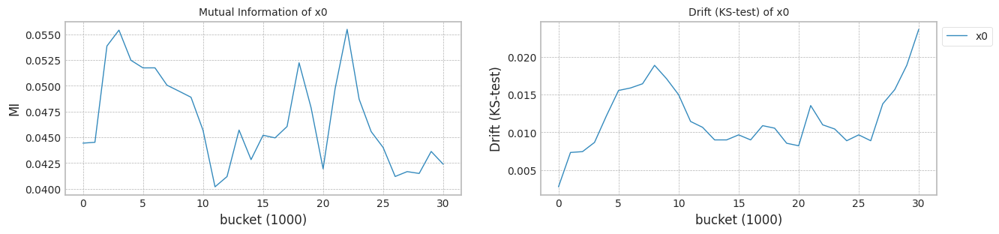

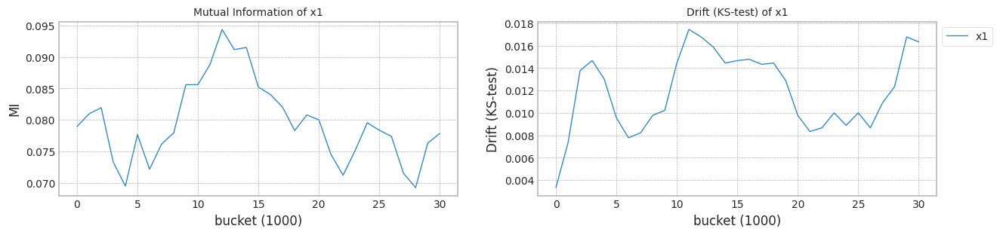

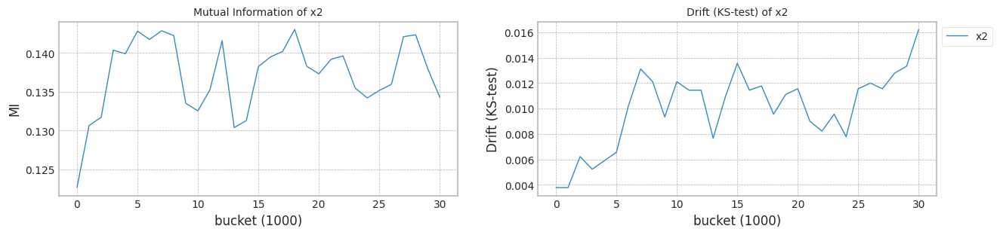

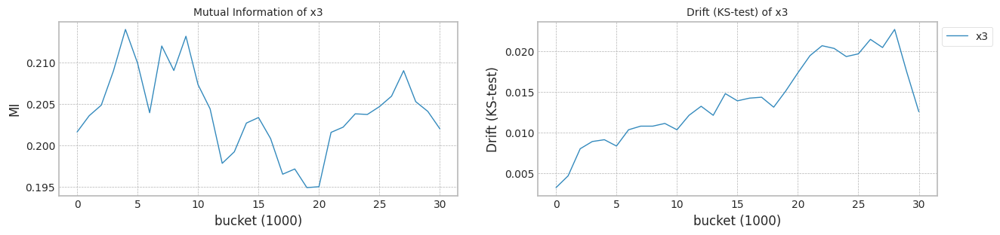

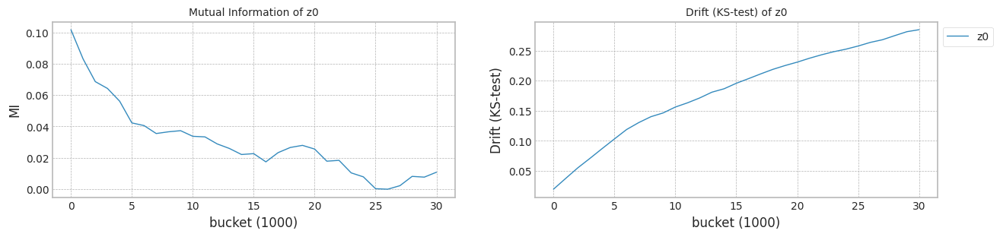

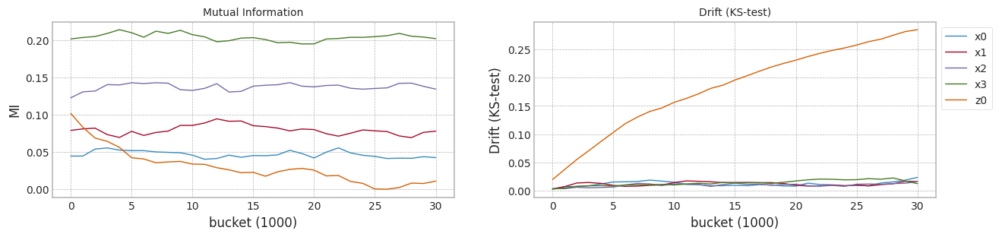

In [ ]:
columns=['x0','x1','x2','x3','z0']
X = pd.DataFrame(x,columns=columns)
Y = y

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X, Y,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

cuda:0


100%|██████████| 300/300 [00:02<00:00, 128.29it/s]


<Axes: >

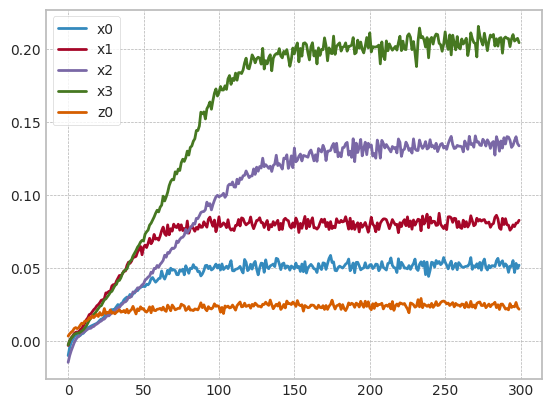

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
mine = Net(X1.shape[1]).to(device)
loss_mse = customLoss(mine).to(device)
optimizer = torch.optim.Adam(loss_mse.parameters(), lr=0.01)
plot_loss = []

x = torch.tensor(X1.values,dtype=torch.float32).to(device)
y = torch.tensor(Y1,dtype=torch.float32).to(device)

for epoch in tqdm(range(300)):
    mine.zero_grad()
    mine_loss = loss_mse(x,y)
    mine_loss.sum().backward()
    optimizer.step()
    plot_loss.append(-mine_loss.cpu().data.numpy())

plot_loss = np.asarray(plot_loss)
df_loss = pd.DataFrame(plot_loss,columns=X1.columns)

df_loss.plot()

In [ ]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.520974,0.392205,0.600995,0.478669,0.421766,0
1,0.447230,0.556479,0.629077,0.735705,0.529014,0
2,0.489501,0.704159,0.760582,0.582973,0.570549,0
3,0.581446,0.301839,0.443337,0.515173,0.396001,0
4,0.571642,0.639275,0.524701,0.583380,0.561748,0
...,...,...,...,...,...,...
39995,0.346158,0.267147,0.513105,0.599663,0.185740,39
39996,0.426322,0.302644,0.484909,0.587518,0.721101,39
39997,0.374186,0.587769,0.624447,0.598315,0.489479,39
39998,0.470439,0.265430,0.218971,0.645349,1.258888,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 624.74it/s]


Test f1 score: 0.8755589486312575
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8033370678547825
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 235.30it/s]


Test f1 score: 0.8581103222282905
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.228466
x1    0.142541
x2    0.129287
x3    0.173226
z0    0.092771
dtype: float64
Mean F1 for all data: 0.8287080851177534
Normal model mean        : 0.8033370678547825
Drift tolerant model mean: 0.8287080851177534
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 645.53it/s]


Test f1 score: 0.8752573967703479
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8050695837316075
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.49it/s]


Test f1 score: 0.8788011376066507
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.068244
x1    0.128423
x2    0.113405
x3    0.152097
z0    0.240491
dtype: float64
Mean F1 for all data: 0.8450267919475111
Normal model mean        : 0.8042033257931951
Drift tolerant model mean: 0.8368674385326322
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.26it/s]


Test f1 score: 0.8555280819498411
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.776874864934093
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 238.76it/s]


Test f1 score: 0.877606909627133
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.095143
x1    0.083369
x2    0.065186
x3    0.127495
z0    0.359846
dtype: float64
Mean F1 for all data: 0.8285145352722383
Normal model mean        : 0.795093838840161
Drift tolerant model mean: 0.8340831374458343
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.60it/s]


Test f1 score: 0.8565048771888589
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7785596639941288
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.68it/s]


Test f1 score: 0.8461706305913156
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.259215
x1    0.046341
x2    0.147419
x3    0.187423
z0    0.437806
dtype: float64
Mean F1 for all data: 0.791322161646156
Normal model mean        : 0.790960295128653
Drift tolerant model mean: 0.8233928934959147
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.05it/s]


Test f1 score: 0.8440038222646918
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7764108086680027
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.15it/s]


Test f1 score: 0.8659180977542933
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.380143
x1    0.111731
x2    0.129323
x3    0.153978
z0    0.370806
dtype: float64
Mean F1 for all data: 0.8176360718110309
Normal model mean        : 0.7880503978365229
Drift tolerant model mean: 0.822241529158938
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.31it/s]


Test f1 score: 0.8531980174651876
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.779635698280768
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 238.55it/s]


Test f1 score: 0.8696416794899977
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.495409
x1    0.072975
x2    0.183677
x3    0.166326
z0    0.202634
dtype: float64
Mean F1 for all data: 0.8445513455266535
Normal model mean        : 0.7866479479105637
Drift tolerant model mean: 0.8259598318868906
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 616.96it/s]


Test f1 score: 0.8611369990680336
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.77937267009738
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 233.87it/s]


Test f1 score: 0.8687092135825684
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.469803
x1    0.070401
x2    0.094466
x3    0.115968
z0    0.383125
dtype: float64
Mean F1 for all data: 0.8346687718895363
Normal model mean        : 0.7856086225086802
Drift tolerant model mean: 0.8272039661729828
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.54it/s]


Test f1 score: 0.8756628070555135
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8088947136032578
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 238.63it/s]


Test f1 score: 0.8656455142231948
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.154849
x1    0.114921
x2    0.129728
x3    0.159677
z0    0.295746
dtype: float64
Mean F1 for all data: 0.8344016915086595
Normal model mean        : 0.7885193838955026
Drift tolerant model mean: 0.8281036818399423
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.51it/s]


Test f1 score: 0.87546346782988
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001058333633786
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 239.24it/s]


Test f1 score: 0.8798419839789312
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.080728
x1    0.081928
x2    0.108663
x3    0.145631
z0    0.112100
dtype: float64
Mean F1 for all data: 0.8501288422381471
Normal model mean        : 0.789806767169711
Drift tolerant model mean: 0.8305509218841873
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.86it/s]


Test f1 score: 0.8755830350363379
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8062409078908431
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 241.80it/s]


Test f1 score: 0.8580880675336526
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.457194
x1    0.142814
x2    0.079918
x3    0.091806
z0    0.302190
dtype: float64
Mean F1 for all data: 0.8018643799660629
Normal model mean        : 0.7914501812418242
Drift tolerant model mean: 0.8276822676923749
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.09it/s]


Test f1 score: 0.8504433497536946
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8039391943210655
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 237.90it/s]


Test f1 score: 0.874641359523284
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.432197
x1    0.109957
x2    0.060910
x3    0.137125
z0    0.134882
dtype: float64
Mean F1 for all data: 0.8287838771230037
Normal model mean        : 0.7925855460672099
Drift tolerant model mean: 0.8277824140042501
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.81it/s]


Test f1 score: 0.8758312438678731
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8048892208128762
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 237.48it/s]


Test f1 score: 0.872020213116555
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.445269
x1    0.126229
x2    0.103806
x3    0.138358
z0    0.254860
dtype: float64
Mean F1 for all data: 0.8352850268725249
Normal model mean        : 0.7936108522960154
Drift tolerant model mean: 0.828407631743273
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.19it/s]


Test f1 score: 0.8621891703462701
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.780511184682827
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 237.45it/s]


Test f1 score: 0.8778142076502733
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.267932
x1    0.073090
x2    0.092724
x3    0.146470
z0    0.229147
dtype: float64
Mean F1 for all data: 0.8503247221989466
Normal model mean        : 0.7926031855565394
Drift tolerant model mean: 0.8300935617783248
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.63it/s]


Test f1 score: 0.8752730449978157
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8000096553180603
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 236.90it/s]


Test f1 score: 0.8459061637534498
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.252362
x1    0.075211
x2    0.092290
x3    0.105778
z0    0.116276
dtype: float64
Mean F1 for all data: 0.8211544939021163
Normal model mean        : 0.7931322191109338
Drift tolerant model mean: 0.8294550569300242
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 648.98it/s]


Test f1 score: 0.8756306207501645
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988744707769135
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.15it/s]


Test f1 score: 0.8493696084936961
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.404297
x1    0.056889
x2    0.062341
x3    0.102903
z0    0.193631
dtype: float64
Mean F1 for all data: 0.8090072540502042
Normal model mean        : 0.7935150358886658
Drift tolerant model mean: 0.8280918700713695
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.57it/s]


Test f1 score: 0.8754782988958129
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7996097780495082
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 238.32it/s]


Test f1 score: 0.8712696839555115
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.041720
x1    0.048032
x2    0.089627
x3    0.090792
z0    0.294735
dtype: float64
Mean F1 for all data: 0.7797431255375641
Normal model mean        : 0.7938959572737183
Drift tolerant model mean: 0.8250700735380068
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 654.01it/s]


Test f1 score: 0.8750938136592687
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8092579409161434
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.51it/s]


Test f1 score: 0.8788343558282208
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.068355
x1    0.104448
x2    0.112125
x3    0.138376
z0    0.225588
dtype: float64
Mean F1 for all data: 0.8454446125201609
Normal model mean        : 0.7947996033703316
Drift tolerant model mean: 0.8262685758310747
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.21it/s]


Test f1 score: 0.8753972602739725
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969313603401925
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.58it/s]


Test f1 score: 0.8524552547039926
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.432685
x1    0.112065
x2    0.147079
x3    0.122251
z0    0.291609
dtype: float64
Mean F1 for all data: 0.8054353495350183
Normal model mean        : 0.7949180343131016
Drift tolerant model mean: 0.8251111743701827
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 645.11it/s]


Test f1 score: 0.8756792001738752
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8022122050015595
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 238.63it/s]


Test f1 score: 0.8671004742472703
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.503065
x1    0.094151
x2    0.124348
x3    0.176082
z0    0.429366
dtype: float64
Mean F1 for all data: 0.7667056014825702
Normal model mean        : 0.7953019380335468
Drift tolerant model mean: 0.822037196849782
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 654.82it/s]


Test f1 score: 0.875985977212971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963621588990416
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.49it/s]


Test f1 score: 0.8772697440385036
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.071197
x1    0.113520
x2    0.105871
x3    0.166348
z0    0.441978
dtype: float64
Mean F1 for all data: 0.7475070003754992
Normal model mean        : 0.7953549490768215
Drift tolerant model mean: 0.8183106870260678


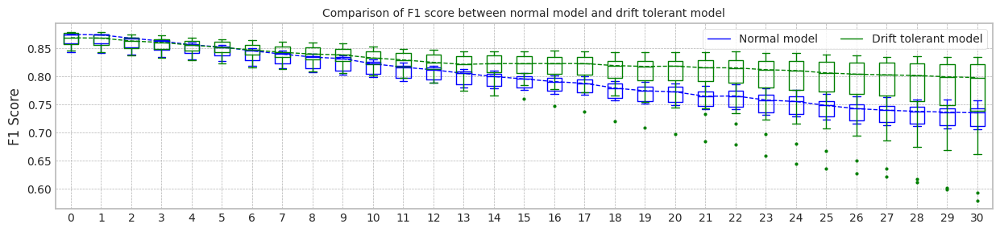

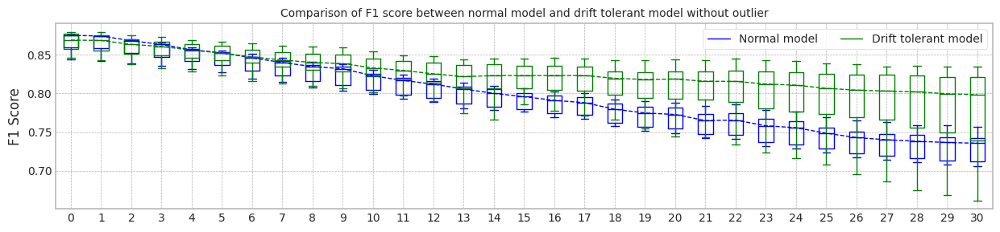

max_mean_trial= 12


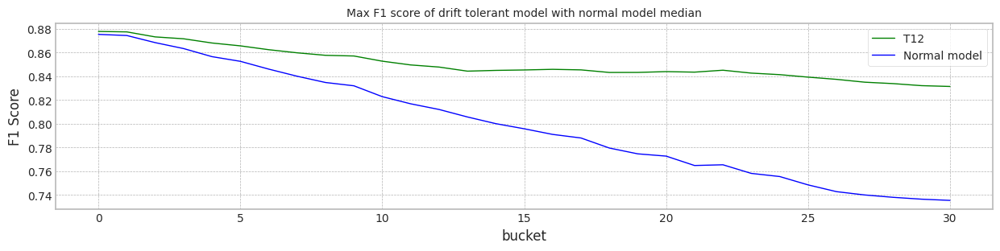

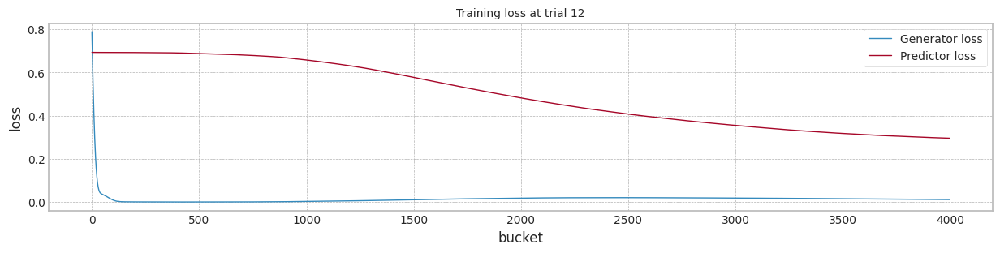

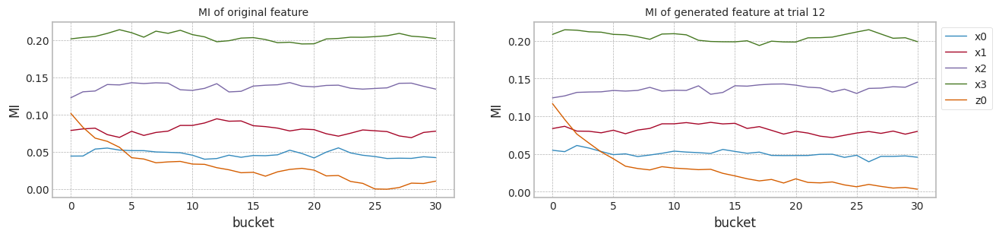

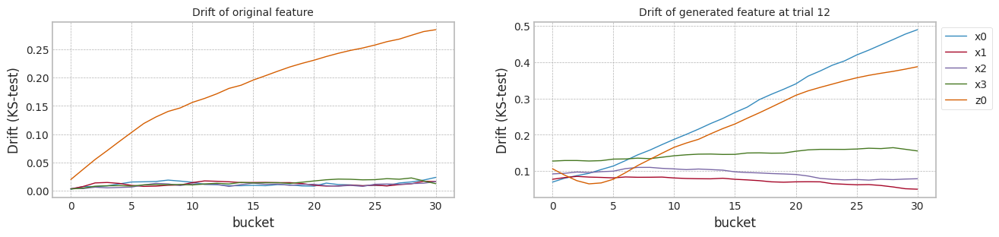

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.875559,0.875559,0.803337,0.741126
1,1.0,0.875257,0.875257,0.805070,0.744587
2,2.0,0.855528,0.855528,0.776875,0.706167
3,3.0,0.856505,0.856505,0.778560,0.708660
4,4.0,0.844004,0.844004,0.776411,0.712162
5,5.0,0.853198,0.853198,0.779636,0.710468
6,6.0,0.861137,0.861137,0.779373,0.708667
7,7.0,0.875663,0.875663,0.808895,0.750188
8,8.0,0.875463,0.875463,0.800106,0.735986
9,9.0,0.875583,0.875583,0.806241,0.745390


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.858110,0.858110,0.828708,0.814397
1,1.0,0.878801,0.878801,0.845027,0.820740
2,2.0,0.877607,0.877607,0.828515,0.742028
3,3.0,0.846171,0.846171,0.791322,0.732294
4,4.0,0.865918,0.865918,0.817636,0.761548
5,5.0,0.869642,0.869642,0.844551,0.831050
6,6.0,0.868709,0.868709,0.834669,0.809176
7,7.0,0.865646,0.865646,0.834402,0.824837
8,8.0,0.879842,0.879842,0.850129,0.834364
9,9.0,0.858088,0.858088,0.801864,0.717509


In [ ]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100) #np.max(X1['b']+1))

## synthetic data의 생성 (Case #2 MI의 증감(상대적), Drift의 고정)

+ $P_t(y|z_0) \ne P_{t+w}(y|z_0)$ , $P_t(z_0) = P_{t+w}(z_0)$
+ Actual Drift
+ 즉, P(X)의 변화없이, Concept (본 Dataset에서 MI의 변화)만 변경


+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature에 대해 y의 비중이 시간에 따라 감소하도록 생성

### Dataset 준비

In [ ]:
data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 2.5])

In [ ]:
seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

In [ ]:
x1.shape

(40000, 5)

In [ ]:
import matplotlib.pyplot as plt

seed_everything()

y1_array = []
cor_const = cor[4]
for ii in range(x1.shape[0]):
    cor[4] = cor[4] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 2.0)
    y1_array.append(np.sum(cor * x1[ii])+e)

In [ ]:
m = 5 #np.mean(y1_array[0:2000])
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
print(sum(y1))

5
21325


### 실험

MI Analysis MI Max 0.22746, Min 0.00677, Mean 0.06988, Std 0.08433
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


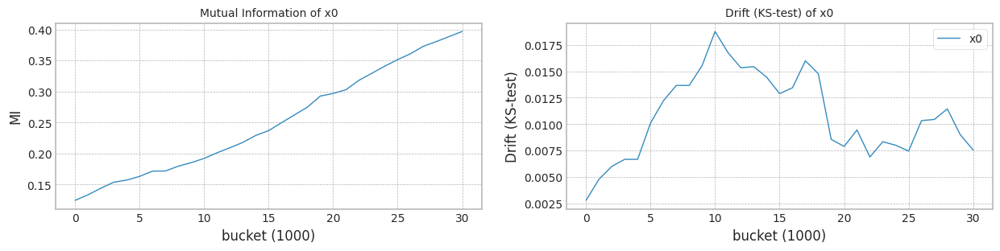

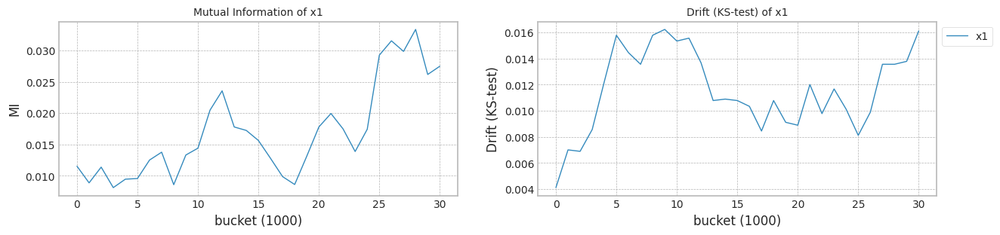

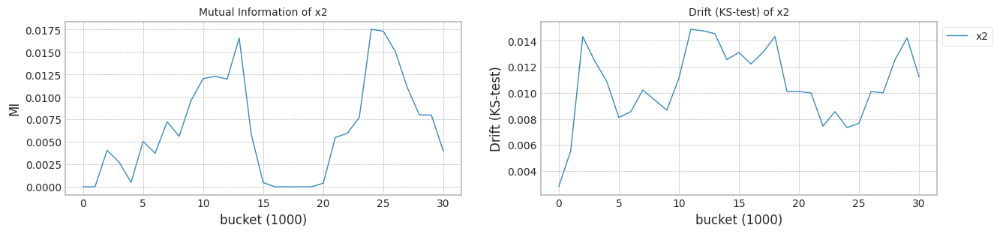

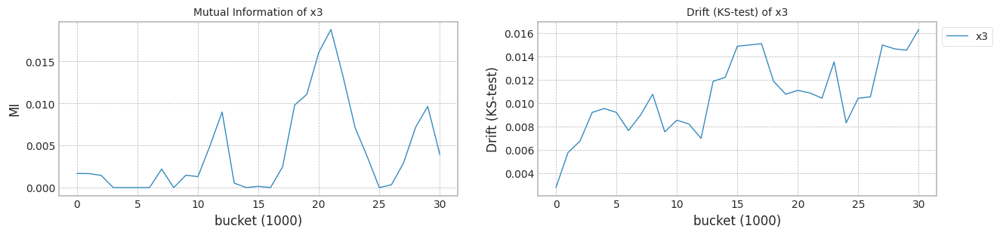

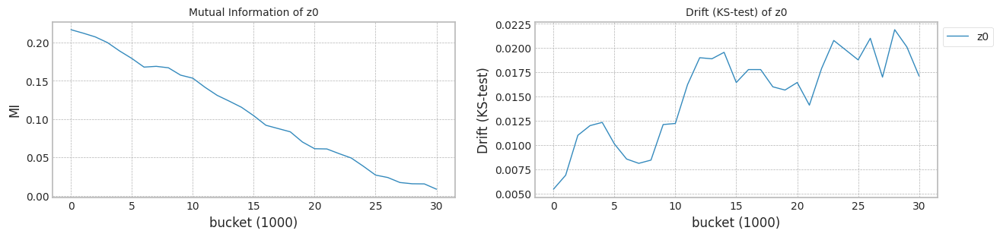

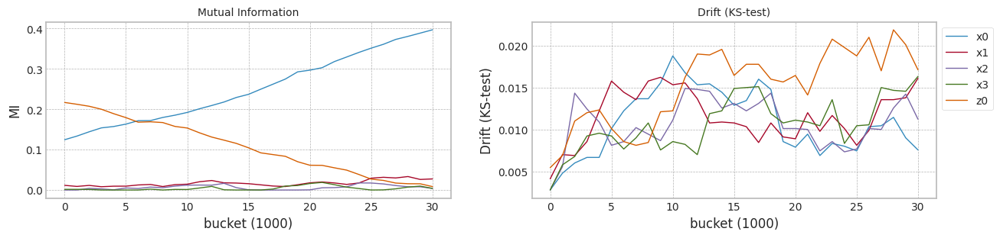

In [ ]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

#train_size = 2100
#test_size = 400

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

In [ ]:
#bucket_size = 700
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.525799,0.497734,0.329063,0.549493,0.366139,0
1,0.610533,0.420412,0.508390,0.580336,0.662926,0
2,0.556874,0.464734,0.669603,0.724770,0.486574,0
3,0.344341,0.646524,0.340976,0.528780,0.611850,0
4,0.503142,0.550860,0.598773,0.465698,0.487044,0
...,...,...,...,...,...,...
39995,0.333622,0.399822,0.303105,0.605408,0.709407,39
39996,0.358451,0.483875,0.341855,0.574439,0.695384,39
39997,0.559469,0.343824,0.542547,0.575250,0.504288,39
39998,0.433692,0.530132,0.301231,0.282353,0.762158,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 643.35it/s]


Test f1 score: 0.9365773646801531
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8642847292771869
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 236.74it/s]


Test f1 score: 0.9518826497243764
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.255075
x1    0.088928
x2    0.034247
x3    0.363806
z0    0.142022
dtype: float64
Mean F1 for all data: 0.9145783443717581
Normal model mean        : 0.8642847292771869
Drift tolerant model mean: 0.9145783443717581
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.99it/s]


Test f1 score: 0.9095621090259159
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.85329168099841
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.01it/s]


Test f1 score: 0.9562872023809523
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.236735
x1    0.082477
x2    0.049910
x3    0.312204
z0    0.252222
dtype: float64
Mean F1 for all data: 0.9148450968900799
Normal model mean        : 0.8587882051377984
Drift tolerant model mean: 0.914711720630919
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.07it/s]


Test f1 score: 0.9322837824200222
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8684525797318826
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 239.11it/s]


Test f1 score: 0.930771954674221
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.248129
x1    0.090222
x2    0.046409
x3    0.017351
z0    0.132401
dtype: float64
Mean F1 for all data: 0.9111311012852565
Normal model mean        : 0.8620096633358264
Drift tolerant model mean: 0.9135181808490316
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 643.58it/s]


Test f1 score: 0.9428676066654458
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8672823089981738
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.75it/s]


Test f1 score: 0.9442556708605016
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.232789
x1    0.068093
x2    0.030817
x3    0.285025
z0    0.117728
dtype: float64
Mean F1 for all data: 0.8950685911120938
Normal model mean        : 0.8633278247514133
Drift tolerant model mean: 0.9089057834147971
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.38it/s]


Test f1 score: 0.8506588579795021
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7940804543797344
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 237.86it/s]


Test f1 score: 0.9520790602274846
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.243835
x1    0.091946
x2    0.036842
x3    0.311710
z0    0.243677
dtype: float64
Mean F1 for all data: 0.8806026664109865
Normal model mean        : 0.8494783506770777
Drift tolerant model mean: 0.903245160014035
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.76it/s]


Test f1 score: 0.913331992760909
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8533114443146491
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 237.70it/s]


Test f1 score: 0.9590347923681257
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.235989
x1    0.089319
x2    0.060889
x3    0.436756
z0    0.205978
dtype: float64
Mean F1 for all data: 0.8970693182226038
Normal model mean        : 0.8501171996166729
Drift tolerant model mean: 0.9022158530487965
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.41it/s]


Test f1 score: 0.9217391304347826
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8645762925076509
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 239.29it/s]


Test f1 score: 0.968361581920904
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.254713
x1    0.067674
x2    0.042527
x3    0.550939
z0    0.132441
dtype: float64
Mean F1 for all data: 0.9247165604403103
Normal model mean        : 0.852182784315384
Drift tolerant model mean: 0.9054302398190127
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.47it/s]


Test f1 score: 0.9312034852060266
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8725484348557931
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.12it/s]


Test f1 score: 0.9405604042259991
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.180964
x1    0.077029
x2    0.068968
x3    0.170226
z0    0.242853
dtype: float64
Mean F1 for all data: 0.8972986252940278
Normal model mean        : 0.8547284906329351
Drift tolerant model mean: 0.9044137880033896
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.71it/s]


Test f1 score: 0.9285453882610282
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8574496308114765
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.82it/s]


Test f1 score: 0.962087087087087
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.254599
x1    0.101900
x2    0.065993
x3    0.327939
z0    0.135599
dtype: float64
Mean F1 for all data: 0.9070095066184277
Normal model mean        : 0.8550308395416619
Drift tolerant model mean: 0.9047022011828383
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.80it/s]


Test f1 score: 0.9091879391621452
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8498517790280777
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.11it/s]


Test f1 score: 0.9306613226452906
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.189642
x1    0.072158
x2    0.026631
x3    0.170677
z0    0.231842
dtype: float64
Mean F1 for all data: 0.8324849474923853
Normal model mean        : 0.8545129334903034
Drift tolerant model mean: 0.897480475813793
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.72it/s]


Test f1 score: 0.8818354321200622
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8233670716383916
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.24it/s]


Test f1 score: 0.9601571268237935
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.245151
x1    0.090799
x2    0.041437
x3    0.323358
z0    0.287168
dtype: float64
Mean F1 for all data: 0.8719856310532021
Normal model mean        : 0.851681491503766
Drift tolerant model mean: 0.8951627626537392
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 666.90it/s]


Test f1 score: 0.8563283922462942
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8073247648474384
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.03it/s]


Test f1 score: 0.9571708500513203
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.261154
x1    0.108301
x2    0.043821
x3    0.370513
z0    0.204000
dtype: float64
Mean F1 for all data: 0.8906323125022076
Normal model mean        : 0.8479850976157387
Drift tolerant model mean: 0.8947852251411116
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.00it/s]


Test f1 score: 0.9238424045491471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8742951737528983
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 238.44it/s]


Test f1 score: 0.9667293233082707
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.342720
x1    0.085857
x2    0.045652
x3    0.478039
z0    0.210075
dtype: float64
Mean F1 for all data: 0.9037318300609938
Normal model mean        : 0.8500089496262895
Drift tolerant model mean: 0.895473425519564
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.73it/s]


Test f1 score: 0.927823791753891
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8530985460199252
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 237.96it/s]


Test f1 score: 0.9534927157265596
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.226681
x1    0.089566
x2    0.039738
x3    0.404763
z0    0.199957
dtype: float64
Mean F1 for all data: 0.9042821967947562
Normal model mean        : 0.8502296350829778
Drift tolerant model mean: 0.896102623467792
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.95it/s]


Test f1 score: 0.9158195113251293
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8607785272267906
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.05it/s]


Test f1 score: 0.9358513189448442
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.147914
x1    0.067767
x2    0.031832
x3    0.310738
z0    0.159358
dtype: float64
Mean F1 for all data: 0.8853136543865705
Normal model mean        : 0.8509328945592319
Drift tolerant model mean: 0.8953833588623772
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 685.09it/s]


Test f1 score: 0.9538206286293667
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8701842117318654
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.26it/s]


Test f1 score: 0.9390154298310066
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.185591
x1    0.066136
x2    0.030165
x3    0.151950
z0    0.211093
dtype: float64
Mean F1 for all data: 0.9003430473506459
Normal model mean        : 0.8521361018825215
Drift tolerant model mean: 0.8956933393928941
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 643.28it/s]


Test f1 score: 0.931809938338774
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.872268459090658
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.67it/s]


Test f1 score: 0.967863183612103
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.260663
x1    0.107484
x2    0.045692
x3    0.415796
z0    0.183308
dtype: float64
Mean F1 for all data: 0.9312291421895523
Normal model mean        : 0.8533203581888825
Drift tolerant model mean: 0.897783680733874
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.93it/s]


Test f1 score: 0.9425959780621572
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8721698936417652
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 241.23it/s]


Test f1 score: 0.9459131247080804
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.256785
x1    0.134538
x2    0.069301
x3    0.289595
z0    0.107154
dtype: float64
Mean F1 for all data: 0.914362735846373
Normal model mean        : 0.8543675546029316
Drift tolerant model mean: 0.8987047393512351
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 666.88it/s]


Test f1 score: 0.9430998264681707
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8666168725103278
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.14it/s]


Test f1 score: 0.9495118549511855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.187376
x1    0.095172
x2    0.032104
x3    0.283280
z0    0.203061
dtype: float64
Mean F1 for all data: 0.8793704121202693
Normal model mean        : 0.855012255545426
Drift tolerant model mean: 0.8976871431811843
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.41it/s]


Test f1 score: 0.9297622301175185
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8551530438235324
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.12it/s]


Test f1 score: 0.9566430963900261
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.239444
x1    0.082380
x2    0.047749
x3    0.354208
z0    0.176996
dtype: float64
Mean F1 for all data: 0.8880159376261292
Normal model mean        : 0.8550192949593314
Drift tolerant model mean: 0.8972035829034315


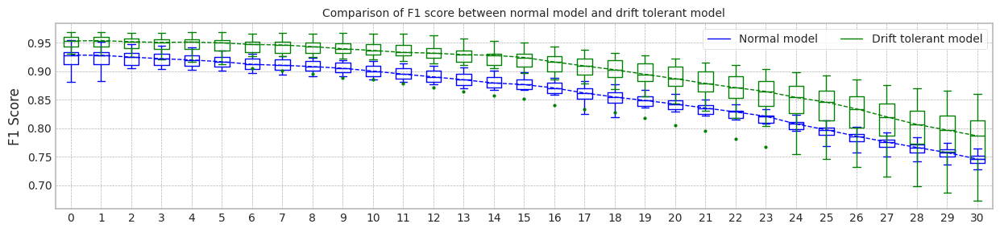

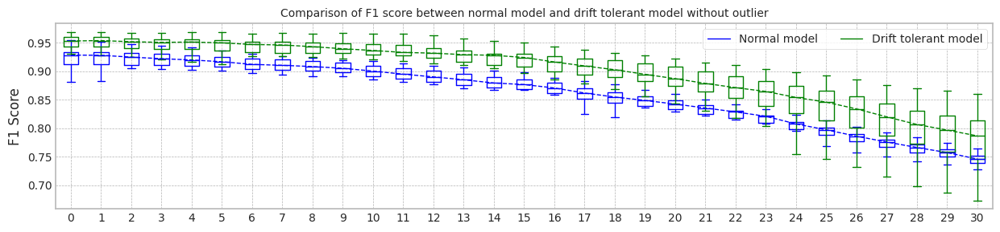

max_mean_trial= 16


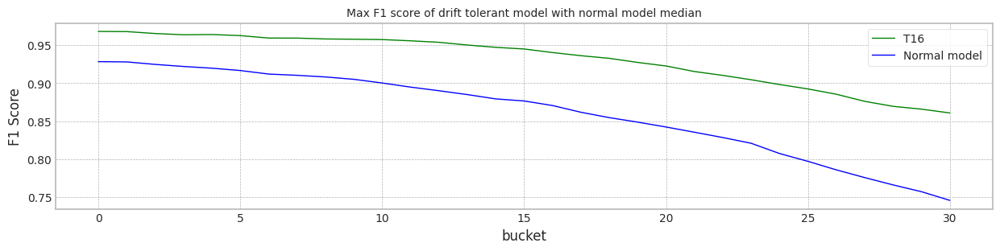

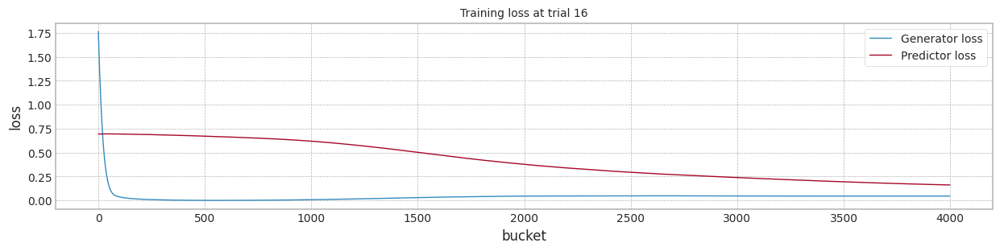

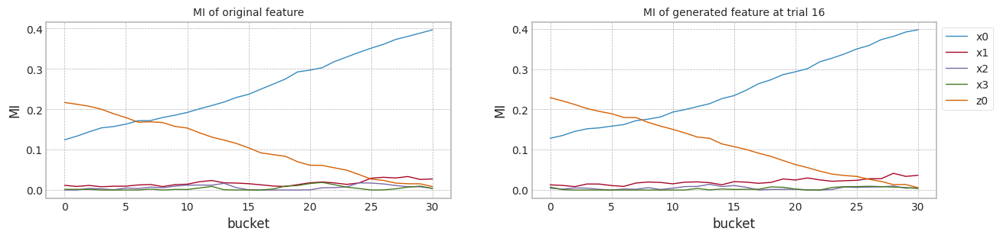

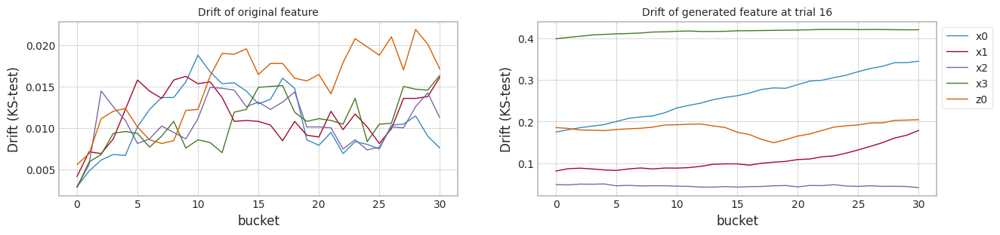

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.936577,0.936577,0.864285,0.749950
1,1.0,0.909562,0.909562,0.853292,0.750074
2,2.0,0.932284,0.932284,0.868453,0.741671
3,3.0,0.942868,0.942868,0.867282,0.749798
4,4.0,0.850659,0.850659,0.794080,0.710292
5,5.0,0.913332,0.913332,0.853311,0.731653
6,6.0,0.921739,0.921739,0.864576,0.746007
7,7.0,0.931203,0.931203,0.872548,0.763881
8,8.0,0.928545,0.928545,0.857450,0.743386
9,9.0,0.909188,0.909188,0.849852,0.745248


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.951883,0.951883,0.914578,0.825980
1,1.0,0.956287,0.956287,0.914845,0.815843
2,2.0,0.930772,0.930772,0.911131,0.834022
3,3.0,0.944256,0.944256,0.895069,0.807014
4,4.0,0.952079,0.952079,0.880603,0.735959
5,5.0,0.959035,0.959035,0.897069,0.739066
6,6.0,0.968362,0.968362,0.924717,0.811900
7,7.0,0.940560,0.940560,0.897299,0.803360
8,8.0,0.962087,0.962087,0.907010,0.762766
9,9.0,0.930661,0.930661,0.832485,0.673432


In [ ]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100) #np.max(X1['b']+1))


## synthetic data의 생성 (Case #3 MI의 증감(상대적), Drift의 증가)

+ $P_t(y,z_0) \ne P_{t+w}(y,z_0) $ , $P_t(y|z_0) \ne P_{t+w}(y|z_0) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature $z_0$에 대해서 MI 증가, ks-test 통계량 증가
+ 이에따라 $X_0$의 MI 감소

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift, MI는 고정

### Dataset 준비

In [ ]:
import matplotlib.pyplot as plt

cor = np.asarray([2.5, 1.2, 0.9 , 0.7, 1.5])

seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

seed_everything()

y1_array = []
cor_const = cor[0]
for ii in range(x1.shape[0]):
    cor[0] = cor[0] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 2.0)
    e1 = np.random.normal(0.0,  4*ii/40000)
    x1[ii,4] = x1[ii,4] + e1
    y1_array.append(np.sum(cor * x1[ii])+e)

In [ ]:
m = np.mean(y1_array)
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
sum(y1)

5.568336092094251


19898

### 실험

MI Analysis MI Max 0.18765, Min 0.00339, Mean 0.06075, Std 0.07062
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


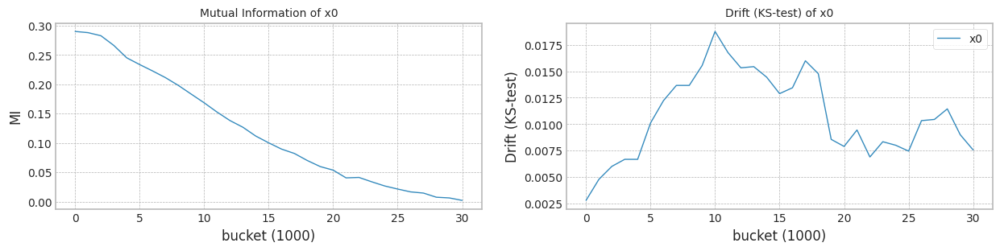

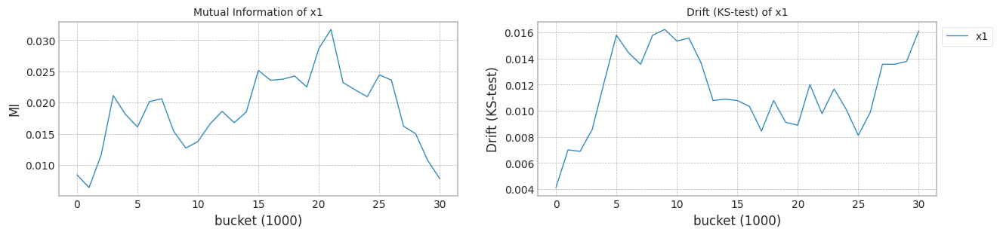

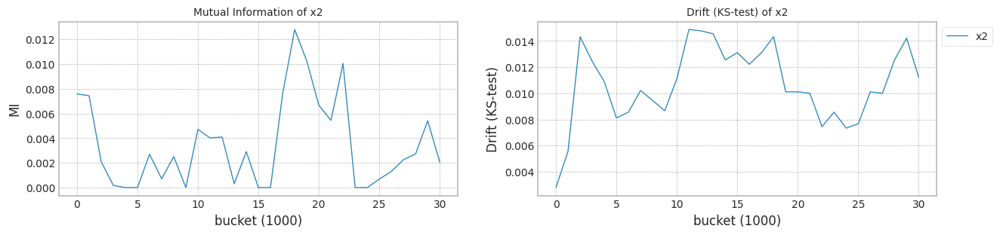

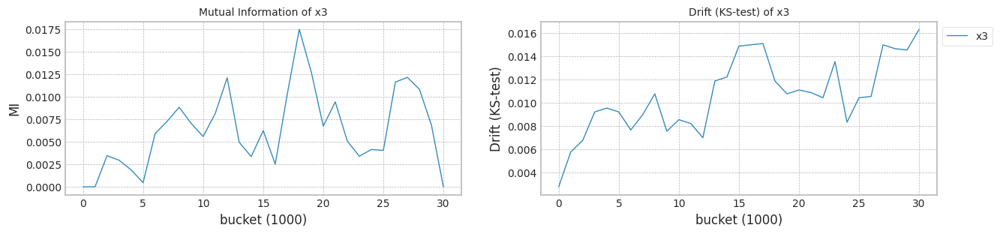

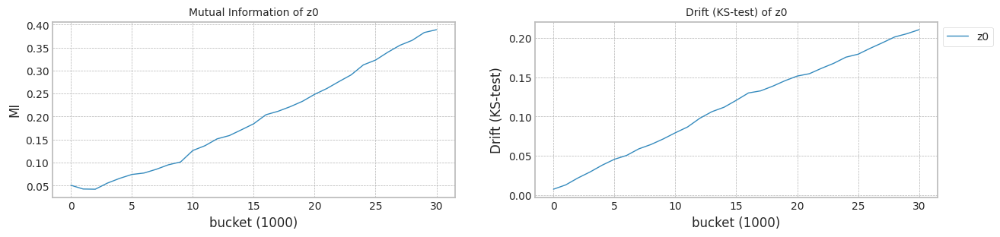

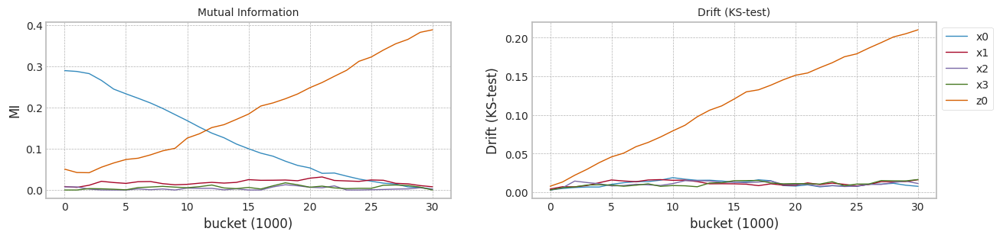

In [ ]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)

In [ ]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.525799,0.497734,0.329063,0.549493,0.348766,0
1,0.610533,0.420412,0.508390,0.580336,0.603602,0
2,0.556874,0.464734,0.669603,0.724770,0.452177,0
3,0.344341,0.646524,0.340976,0.528780,0.559737,0
4,0.503142,0.550860,0.598773,0.465698,0.452611,0
...,...,...,...,...,...,...
39995,0.333622,0.399822,0.303105,0.605408,0.612303,39
39996,0.358451,0.483875,0.341855,0.574439,0.395651,39
39997,0.559469,0.343824,0.542547,0.575250,0.268402,39
39998,0.433692,0.530132,0.301231,0.282353,0.347175,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 681.31it/s]


Test f1 score: 0.9054407913878383
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8453543721755923
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 241.49it/s]


Test f1 score: 0.8969061974893744
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.228129
x1    0.088147
x2    0.042624
x3    0.240509
z0    0.233283
dtype: float64
Mean F1 for all data: 0.8522791274058752
Normal model mean        : 0.8453543721755923
Drift tolerant model mean: 0.8522791274058752
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.05it/s]


Test f1 score: 0.8943554538520213
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8331323541594289
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.89it/s]


Test f1 score: 0.9008085190297772
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.356670
x1    0.130677
x2    0.055986
x3    0.056928
z0    0.222749
dtype: float64
Mean F1 for all data: 0.8070763792052823
Normal model mean        : 0.8392433631675106
Drift tolerant model mean: 0.8296777533055788
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.40it/s]


Test f1 score: 0.9052734375000001
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8398637369354993
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.60it/s]


Test f1 score: 0.9004588444610919
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.176093
x1    0.066079
x2    0.030785
x3    0.012749
z0    0.184538
dtype: float64
Mean F1 for all data: 0.8631128152685468
Normal model mean        : 0.8394501544235068
Drift tolerant model mean: 0.8408227739599013
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.89it/s]


Test f1 score: 0.8840999249490725
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8341611715590737
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.73it/s]


Test f1 score: 0.8936664729808251
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.273043
x1    0.063427
x2    0.024900
x3    0.135781
z0    0.217018
dtype: float64
Mean F1 for all data: 0.8523615635850337
Normal model mean        : 0.8381279087073985
Drift tolerant model mean: 0.8437074713661845
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.61it/s]


Test f1 score: 0.8720298348428343
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8181127484850822
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.39it/s]


Test f1 score: 0.8905608755129959
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.290541
x1    0.072842
x2    0.024527
x3    0.213595
z0    0.228581
dtype: float64
Mean F1 for all data: 0.8403377746529715
Normal model mean        : 0.8341248766629352
Drift tolerant model mean: 0.843033532023542
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.76it/s]


Test f1 score: 0.8782599285791581
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8354662202166913
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.26it/s]


Test f1 score: 0.8978664559462664
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.197391
x1    0.085889
x2    0.067276
x3    0.153312
z0    0.267262
dtype: float64
Mean F1 for all data: 0.856694669121644
Normal model mean        : 0.8343484339218946
Drift tolerant model mean: 0.845310388206559
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.15it/s]


Test f1 score: 0.8791446160492493
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8325955808389909
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 241.37it/s]


Test f1 score: 0.901450427180608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.287276
x1    0.071498
x2    0.043688
x3    0.340685
z0    0.212075
dtype: float64
Mean F1 for all data: 0.829162123211043
Normal model mean        : 0.8340980263386226
Drift tolerant model mean: 0.8430034932071997
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.67it/s]


Test f1 score: 0.8967517401392112
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8294344804851029
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 241.23it/s]


Test f1 score: 0.8940047021943575
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.223082
x1    0.077584
x2    0.029158
x3    0.063047
z0    0.292229
dtype: float64
Mean F1 for all data: 0.8460170640208431
Normal model mean        : 0.8335150831069327
Drift tolerant model mean: 0.8433801895589049
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.62it/s]


Test f1 score: 0.8774872847327564
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.818966236984827
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.30it/s]


Test f1 score: 0.8984932593180016
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.234247
x1    0.135778
x2    0.075570
x3    0.203606
z0    0.217294
dtype: float64
Mean F1 for all data: 0.8516431090970401
Normal model mean        : 0.8318985446489209
Drift tolerant model mean: 0.8442982917298089
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.12it/s]


Test f1 score: 0.8859665602104076
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8391685048733114
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 239.64it/s]


Test f1 score: 0.8925390856916683
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.157341
x1    0.133914
x2    0.034412
x3    0.120649
z0    0.246552
dtype: float64
Mean F1 for all data: 0.8570318285154357
Normal model mean        : 0.83262554067136
Drift tolerant model mean: 0.8455716454083715
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.72it/s]


Test f1 score: 0.8879668049792531
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8379324007699017
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 241.15it/s]


Test f1 score: 0.8995478671122469
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.286921
x1    0.119466
x2    0.043982
x3    0.052824
z0    0.272409
dtype: float64
Mean F1 for all data: 0.8656865603548511
Normal model mean        : 0.8331079824985
Drift tolerant model mean: 0.8474002740398696
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.46it/s]


Test f1 score: 0.8474807856532878
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8057311652051016
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.08it/s]


Test f1 score: 0.8915473622278878
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.257889
x1    0.112172
x2    0.033516
x3    0.273652
z0    0.221545
dtype: float64
Mean F1 for all data: 0.8493615652433687
Normal model mean        : 0.8308265810573835
Drift tolerant model mean: 0.8475637149734946
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.24it/s]


Test f1 score: 0.8768547600996427
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.830936507458779
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 241.00it/s]


Test f1 score: 0.899186346497321
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.331978
x1    0.067642
x2    0.099921
x3    0.110391
z0    0.278538
dtype: float64
Mean F1 for all data: 0.8263739310974582
Normal model mean        : 0.8308350369344139
Drift tolerant model mean: 0.8459337315984149
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.07it/s]


Test f1 score: 0.9065858901700216
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8402398396461872
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.63it/s]


Test f1 score: 0.8843494657448145
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.138875
x1    0.059319
x2    0.020100
x3    0.038935
z0    0.190699
dtype: float64
Mean F1 for all data: 0.849861544298504
Normal model mean        : 0.8315068085566834
Drift tolerant model mean: 0.8462142896484213
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 642.99it/s]


Test f1 score: 0.9063015826779299
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8450546952914686
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.37it/s]


Test f1 score: 0.8863255033557047
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.171054
x1    0.091143
x2    0.035932
x3    0.037032
z0    0.196319
dtype: float64
Mean F1 for all data: 0.8272152248248851
Normal model mean        : 0.8324100010056691
Drift tolerant model mean: 0.8449476853268522
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.47it/s]


Test f1 score: 0.9099293563579279
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8496339201319842
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.82it/s]


Test f1 score: 0.8980035580154181
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.293197
x1    0.193029
x2    0.063803
x3    0.132907
z0    0.243233
dtype: float64
Mean F1 for all data: 0.8496913175193432
Normal model mean        : 0.8334864959510639
Drift tolerant model mean: 0.8452441623388829
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.03it/s]


Test f1 score: 0.9066408143480369
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8414382299923047
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 241.56it/s]


Test f1 score: 0.9000593706708886
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.306584
x1    0.103165
x2    0.049151
x3    0.098355
z0    0.232452
dtype: float64
Mean F1 for all data: 0.8434632321396063
Normal model mean        : 0.8339542450123134
Drift tolerant model mean: 0.8451394017389254
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.78it/s]


Test f1 score: 0.9057373070575673
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8461658964572731
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.84it/s]


Test f1 score: 0.8936003140950137
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.235760
x1    0.127140
x2    0.044699
x3    0.149832
z0    0.228201
dtype: float64
Mean F1 for all data: 0.8553823401816218
Normal model mean        : 0.834632670092589
Drift tolerant model mean: 0.8457084538746309
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 666.73it/s]


Test f1 score: 0.9095687725104643
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8482515182664953
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.91it/s]


Test f1 score: 0.8966128397006695
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.217971
x1    0.115176
x2    0.044208
x3    0.093190
z0    0.225849
dtype: float64
Mean F1 for all data: 0.8554662434751231
Normal model mean        : 0.8353494515754262
Drift tolerant model mean: 0.846222021748341
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.42it/s]


Test f1 score: 0.8945131375579598
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8257386050853327
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.05it/s]


Test f1 score: 0.9016409550948217
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.361527
x1    0.141860
x2    0.033964
x3    0.050032
z0    0.219645
dtype: float64
Mean F1 for all data: 0.8116036667197916
Normal model mean        : 0.8348689092509215
Drift tolerant model mean: 0.8444911039969135


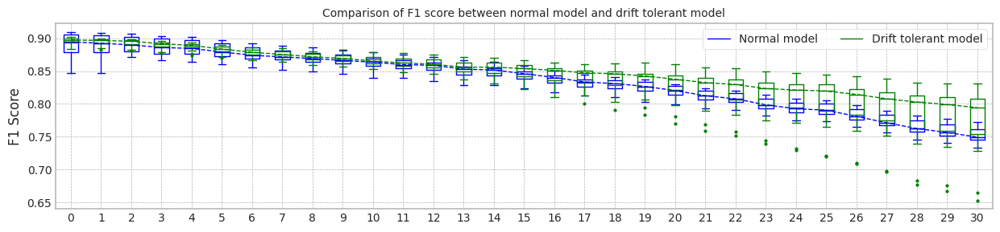

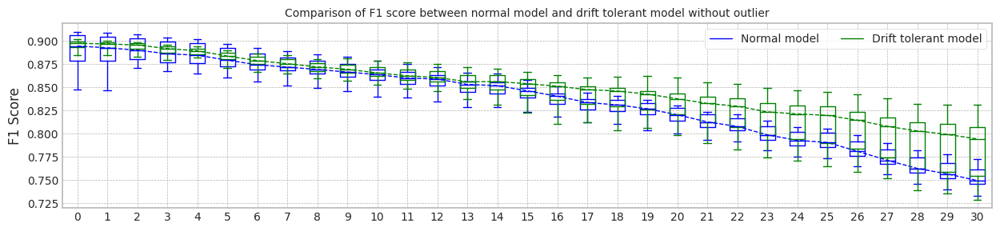

max_mean_trial= 10


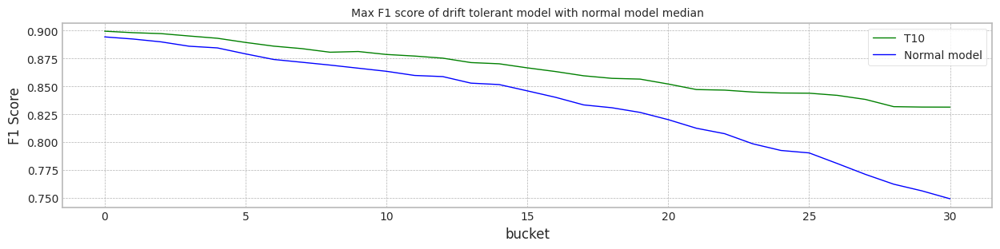

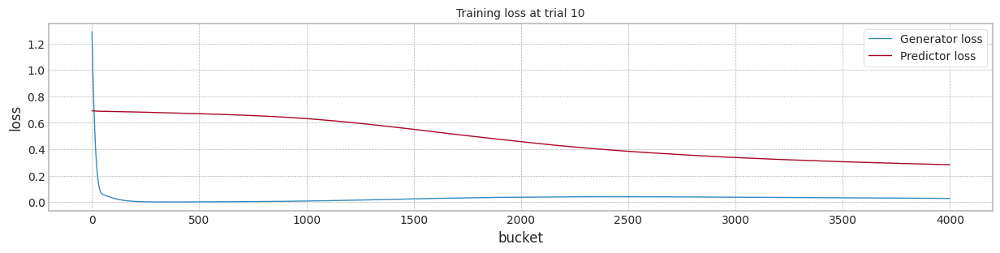

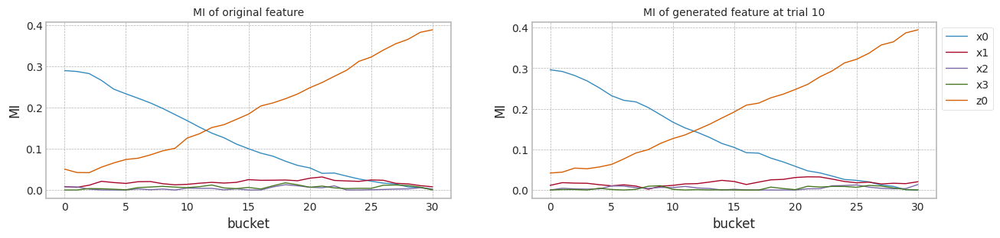

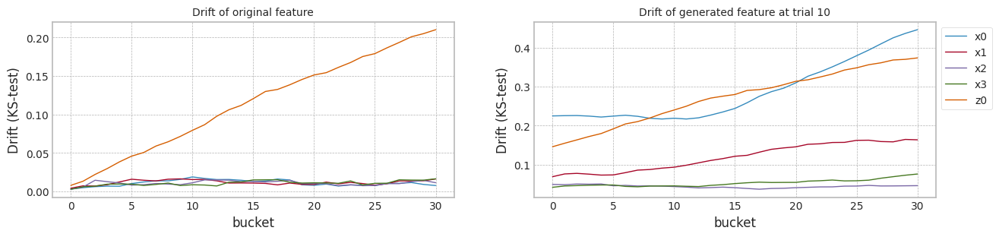

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.905441,0.905441,0.845354,0.761285
1,1.0,0.894355,0.894355,0.833132,0.749946
2,2.0,0.905273,0.905273,0.839864,0.748671
3,3.0,0.884100,0.884100,0.834161,0.743378
4,4.0,0.872030,0.872030,0.818113,0.737296
5,5.0,0.878260,0.878260,0.835466,0.751474
6,6.0,0.879145,0.879145,0.832596,0.746631
7,7.0,0.896752,0.896752,0.829434,0.738907
8,8.0,0.877487,0.877487,0.818966,0.741661
9,9.0,0.885967,0.885967,0.839169,0.772128


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.896906,0.896906,0.852279,0.806396
1,1.0,0.900809,0.900809,0.807076,0.664757
2,2.0,0.900459,0.900459,0.863113,0.820066
3,3.0,0.893666,0.893666,0.852362,0.802121
4,4.0,0.890561,0.890561,0.840338,0.780551
5,5.0,0.897866,0.897866,0.856695,0.801889
6,6.0,0.901450,0.901450,0.829162,0.755626
7,7.0,0.894005,0.894005,0.846017,0.791217
8,8.0,0.898493,0.898493,0.851643,0.788462
9,9.0,0.892539,0.892539,0.857032,0.810057


In [ ]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100) #np.max(X1['b']+1))


## synthetic data의 생성 (Case #4 MI의 고정, Drift의 증가)

+ $P_t(y|z_0) = P_{t+w}(y|z_0)$ , $P_t(z_0) \ne P_{t+w}(z_0)$
+ Virtual Drift
+ 즉, Concept (본 Dataset에서 MI의 변화)의 변화는 없고, P(X)만 변함.

### Dataset 준비

In [ ]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

y3= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x3 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    '''
    x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)
    '''
    # z0
    if ix == 4:
        for ii in range(len(y3)):
            x3[ii,ix] = y3[ii] + np.random.normal(0.0 + 4*ii/data_size,cor_)
    else:
        x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)


### 실험

MI Analysis MI Max 0.20278, Min 0.05089, Mean 0.11172, Std 0.05282
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.67it/s]


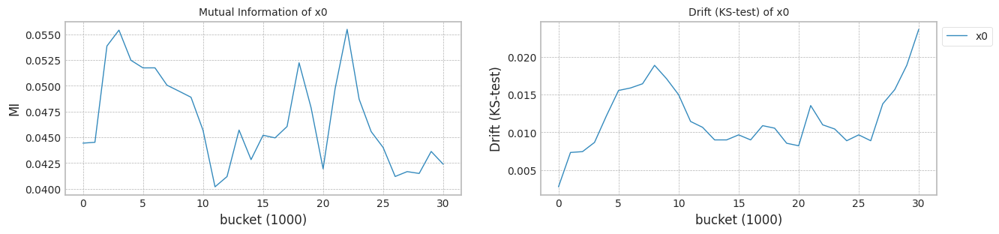

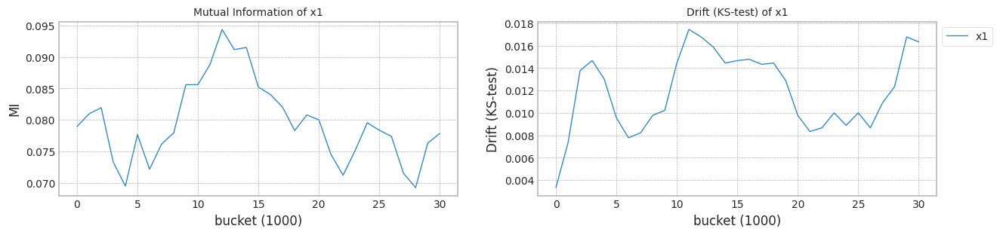

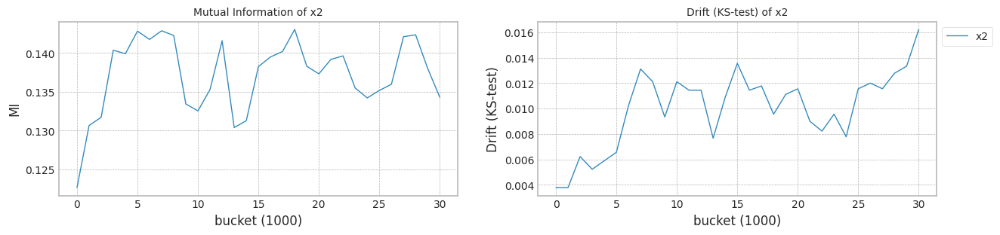

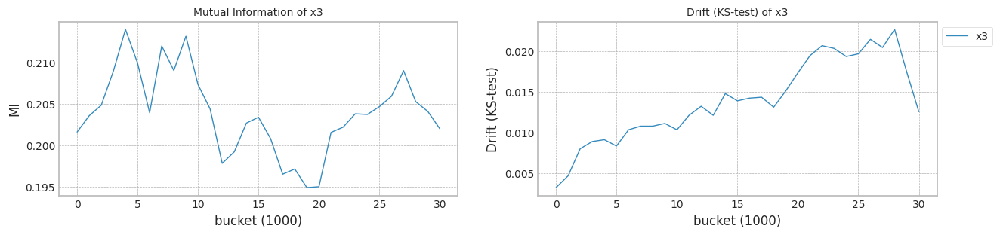

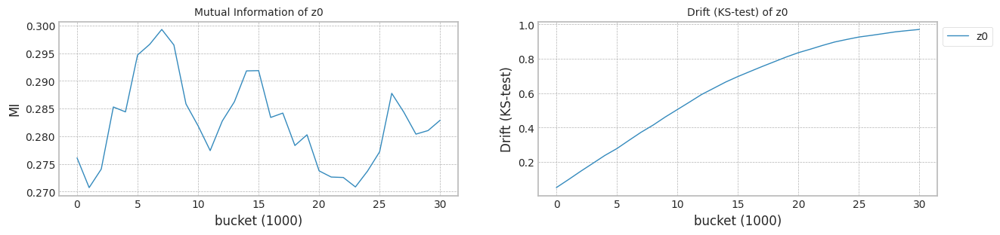

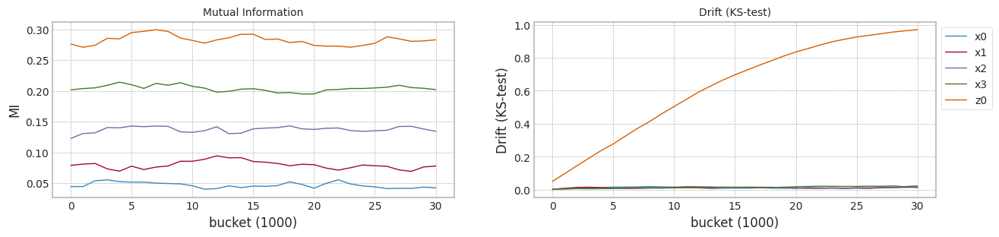

In [ ]:
columns=['x0','x1','x2','x3','z0']
X3 = pd.DataFrame(x3,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X3, y3,train_size, test_size)

In [ ]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.520974,0.392205,0.600995,0.478669,0.477486,0
1,0.447230,0.556479,0.629077,0.735705,0.578715,0
2,0.489501,0.704159,0.760582,0.582973,0.354045,0
3,0.581446,0.301839,0.443337,0.515173,0.360338,0
4,0.571642,0.639275,0.524701,0.583380,0.597569,0
...,...,...,...,...,...,...
39995,0.346158,0.267147,0.513105,0.599663,0.989291,39
39996,0.426322,0.302644,0.484909,0.587518,1.004704,39
39997,0.374186,0.587769,0.624447,0.598315,1.321791,39
39998,0.470439,0.265430,0.218971,0.645349,1.148847,39


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.32it/s]


Test f1 score: 0.9094218415417559
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7553238378309143
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 241.39it/s]


Test f1 score: 0.9143297041680415
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.093057
x1    0.607032
x2    0.218258
x3    0.246925
z0    0.303996
dtype: float64
Mean F1 for all data: 0.9073047560676344
Normal model mean        : 0.7553238378309143
Drift tolerant model mean: 0.9073047560676344
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 685.36it/s]


Test f1 score: 0.9004610226320201
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7426420890419302
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 238.88it/s]


Test f1 score: 0.9213826191255042
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.119315
x1    0.191229
x2    0.240616
x3    0.251882
z0    0.341667
dtype: float64
Mean F1 for all data: 0.9147851198018191
Normal model mean        : 0.7489829634364222
Drift tolerant model mean: 0.9110449379347267
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.40it/s]


Test f1 score: 0.8989945155393052
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7795684763418709
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.34it/s]


Test f1 score: 0.9125156969443281
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.265939
x1    0.230226
x2    0.234459
x3    0.251358
z0    0.432057
dtype: float64
Mean F1 for all data: 0.8806082325069917
Normal model mean        : 0.759178134404905
Drift tolerant model mean: 0.9008993694588151
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.73it/s]


Test f1 score: 0.9095629597576806
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7643952962108309
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.45it/s]


Test f1 score: 0.910362920857018
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.501566
x1    0.107588
x2    0.277455
x3    0.279384
z0    0.350667
dtype: float64
Mean F1 for all data: 0.9053377420517814
Normal model mean        : 0.7604824248563865
Drift tolerant model mean: 0.9020089626070567
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.97it/s]


Test f1 score: 0.9053103007037748
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7504716963229595
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 236.76it/s]


Test f1 score: 0.9112841320320211
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.519265
x1    0.116763
x2    0.263982
x3    0.298731
z0    0.388527
dtype: float64
Mean F1 for all data: 0.9112040914710131
Normal model mean        : 0.7584802791497011
Drift tolerant model mean: 0.903847988379848
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.74it/s]


Test f1 score: 0.8929020459481084
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7700523497988314
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.87it/s]


Test f1 score: 0.9147814627717987
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.530602
x1    0.157222
x2    0.206312
x3    0.240176
z0    0.333842
dtype: float64
Mean F1 for all data: 0.9117893213151788
Normal model mean        : 0.7604089575912228
Drift tolerant model mean: 0.9051715438690698
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.02it/s]


Test f1 score: 0.9014436739797659
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7816751299196717
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.79it/s]


Test f1 score: 0.9125082435700154
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.561072
x1    0.083025
x2    0.257720
x3    0.302889
z0    0.462233
dtype: float64
Mean F1 for all data: 0.9071025607377375
Normal model mean        : 0.7634469822095726
Drift tolerant model mean: 0.9054474034217366
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.29it/s]


Test f1 score: 0.9087996582656984
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7576247123791781
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.46it/s]


Test f1 score: 0.9141480508103371
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.394978
x1    0.225634
x2    0.261810
x3    0.254613
z0    0.352789
dtype: float64
Mean F1 for all data: 0.9130152369637055
Normal model mean        : 0.7627191984807734
Drift tolerant model mean: 0.9063933826144827
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.36it/s]


Test f1 score: 0.9107334910733491
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7615620223789831
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.48it/s]


Test f1 score: 0.9125851087195256
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.147158
x1    0.546419
x2    0.264007
x3    0.265620
z0    0.481541
dtype: float64
Mean F1 for all data: 0.895217217810448
Normal model mean        : 0.7625906233583523
Drift tolerant model mean: 0.9051515865251455
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.63it/s]


Test f1 score: 0.9069319640564827
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7611482331474735
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.59it/s]


Test f1 score: 0.9039599453800637
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.489900
x1    0.136484
x2    0.233810
x3    0.248498
z0    0.326627
dtype: float64
Mean F1 for all data: 0.8949440444199436
Normal model mean        : 0.7624463843372643
Drift tolerant model mean: 0.9041308323146253
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 681.99it/s]


Test f1 score: 0.9043128112747696
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7511891957622406
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 239.34it/s]


Test f1 score: 0.9170229091307683
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.604315
x1    0.206971
x2    0.200692
x3    0.274240
z0    0.331885
dtype: float64
Mean F1 for all data: 0.9142867957457975
Normal model mean        : 0.7614230035577166
Drift tolerant model mean: 0.9050541017174591
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 680.16it/s]


Test f1 score: 0.9097133076593923
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.757709066635845
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 241.14it/s]


Test f1 score: 0.9179425046811324
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.641419
x1    0.160599
x2    0.206416
x3    0.230025
z0    0.245423
dtype: float64
Mean F1 for all data: 0.8979994380441642
Normal model mean        : 0.7611135088142275
Drift tolerant model mean: 0.904466213078018
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.17it/s]


Test f1 score: 0.8665302683836804
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7957686919997398
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 241.31it/s]


Test f1 score: 0.9049822447003121
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.095430
x1    0.093405
x2    0.280348
x3    0.296398
z0    0.346194
dtype: float64
Mean F1 for all data: 0.8950244461802336
Normal model mean        : 0.7637792921361899
Drift tolerant model mean: 0.9037399233166499
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.62it/s]


Test f1 score: 0.9104397376626169
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7589364860685089
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.24it/s]


Test f1 score: 0.8833063209076175
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.431315
x1    0.127151
x2    0.233022
x3    0.314839
z0    0.384129
dtype: float64
Mean F1 for all data: 0.8843467939994277
Normal model mean        : 0.7634333774170698
Drift tolerant model mean: 0.9023546997939912
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.41it/s]


Test f1 score: 0.9098721667203782
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7594623313659289
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.97it/s]


Test f1 score: 0.9141663919111991
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.586039
x1    0.118606
x2    0.232817
x3    0.255498
z0    0.296337
dtype: float64
Mean F1 for all data: 0.8988352811979926
Normal model mean        : 0.7631686410136604
Drift tolerant model mean: 0.9021200718875912
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.07it/s]


Test f1 score: 0.9109677419354838
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7607050976565316
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.50it/s]


Test f1 score: 0.9151761220234829
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.456609
x1    0.356337
x2    0.258817
x3    0.287183
z0    0.322358
dtype: float64
Mean F1 for all data: 0.9078316059931852
Normal model mean        : 0.7630146695538398
Drift tolerant model mean: 0.9024770427691908
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.91it/s]


Test f1 score: 0.907161803713528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7520409746862563
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.70it/s]


Test f1 score: 0.9213949928938449
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.106520
x1    0.217570
x2    0.259943
x3    0.353427
z0    0.318480
dtype: float64
Mean F1 for all data: 0.9195307970196238
Normal model mean        : 0.7623691580910408
Drift tolerant model mean: 0.9034802047839222
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.24it/s]


Test f1 score: 0.9108355795148249
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7640082060828655
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.44it/s]


Test f1 score: 0.9042746703046839
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.493104
x1    0.091333
x2    0.234219
x3    0.310466
z0    0.243803
dtype: float64
Mean F1 for all data: 0.8453723671046541
Normal model mean        : 0.7624602163128088
Drift tolerant model mean: 0.9002519915795184
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.20it/s]


Test f1 score: 0.9102564102564102
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.756218524476168
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.45it/s]


Test f1 score: 0.9143798024149288
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.478416
x1    0.197642
x2    0.255226
x3    0.314871
z0    0.404559
dtype: float64
Mean F1 for all data: 0.9097817355096789
Normal model mean        : 0.7621317062161435
Drift tolerant model mean: 0.9007535570495268
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.87it/s]


Test f1 score: 0.9102854065697361
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.762864823952892
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.88it/s]


Test f1 score: 0.9109214270080981
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.156412
x1    0.374477
x2    0.256649
x3    0.273111
z0    0.377835
dtype: float64
Mean F1 for all data: 0.9027362265295521
Normal model mean        : 0.7621683621029809
Drift tolerant model mean: 0.900852690523528


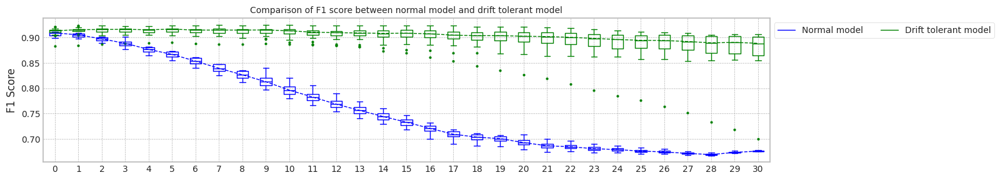

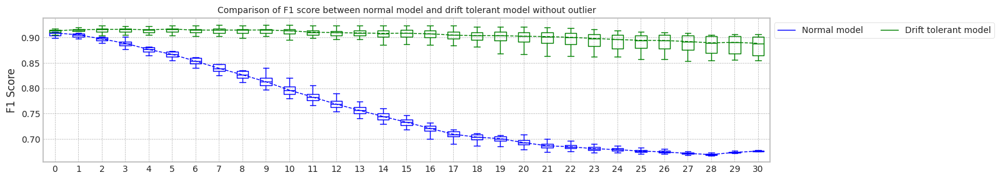

max_mean_trial= 16


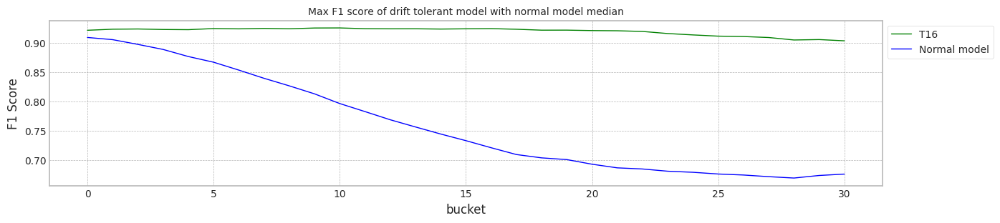

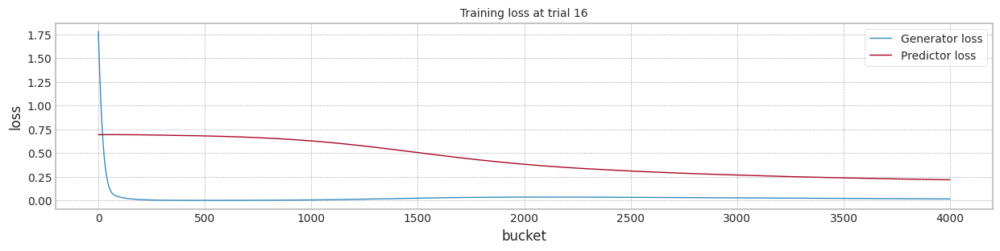

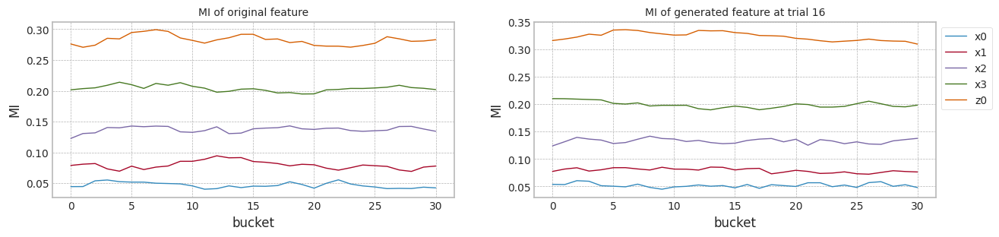

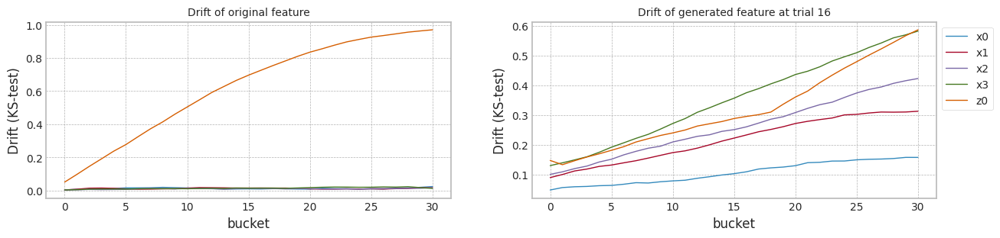

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.909422,0.909422,0.755324,0.675173
1,1.0,0.900461,0.900461,0.742642,0.674775
2,2.0,0.898995,0.898995,0.779568,0.677723
3,3.0,0.909563,0.909563,0.764395,0.677021
4,4.0,0.905310,0.905310,0.750472,0.674924
5,5.0,0.892902,0.892902,0.770052,0.675722
6,6.0,0.901444,0.901444,0.781675,0.679181
7,7.0,0.908800,0.908800,0.757625,0.675622
8,8.0,0.910733,0.910733,0.761562,0.675921
9,9.0,0.906932,0.906932,0.761148,0.676821


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.914330,0.914330,0.907305,0.890630
1,1.0,0.921383,0.921383,0.914785,0.901059
2,2.0,0.912516,0.912516,0.880608,0.854955
3,3.0,0.910363,0.910363,0.905338,0.899258
4,4.0,0.911284,0.911284,0.911204,0.905900
5,5.0,0.914781,0.914781,0.911789,0.899692
6,6.0,0.912508,0.912508,0.907103,0.893076
7,7.0,0.914148,0.914148,0.913015,0.905923
8,8.0,0.912585,0.912585,0.895217,0.855059
9,9.0,0.903960,0.903960,0.894944,0.867227


In [ ]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100) #np.max(X1['b']+1))


## synthetic data의 생성 (Case #5 - Case #1,2,3,4의 상황이 각 feature에 혼재되어 있는 경우)

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ 전체적으로는 Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
<table>
<tr><td>Feature</td><td width='200px'>관계</td><td>Drift유형</td><td>변화</td></tr>
<tr><td>$x_0$</td><td>$P_t(y|x_0) = P_{t+w}(y|x_0)$ , $P_t(x_0) = P_{t+w}(x_0)$</td><td>No Drift</td><td>-</td></tr>
<tr><td>$x_1$</td><td>$P_t(y|x_1) = P_{t+w}(y|x_1)$ , $P_t(x_1) \ne P_{t+w}(x_1)$</td><td>Virtual Drift</td><td>MI 동일, Drift 증가</td></tr>

<tr><td>$x_2$</td><td>$P_t(y|x_2) \ne P_{t+w}(y|x_2)$ , $P_t(x_2) \ne P_{t+w}(x_2)$</td><td>Real Concept Drift</td><td>MI 감소, Drift 증가</td></tr>

<tr><td>$x_3$</td><td>$P_t(y|x_3) \ne P_{t+w}(y|x_3)$ , $P_t(X) \ne P_{t+w}(x_3)$</td><td>Real Concept Drift</td><td>MI 증가, Drift 증가</td></tr>

<tr><td>$z_0$</td><td>$P_t(y|z_0) \ne P_{t+w}(y|z_0)$ , $P_t(z_0) = P_{t+w}(z_0)$</td><td>Actual Drift</td><td>MI 감소, Drift 동일</td></tr>

</table>


### Dataset 준비

In [ ]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.5 , 0.7, 2.5])

x4 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x4[:,ix] = np.random.normal(1,cor_,data_size)

y4_array = []
cor_const = cor[4]
cor_const2 = 3/x4.shape[0]
for ii in range(x4.shape[0]):
    # Case #2, MI의 증감(상대적), Drift의 고정 - z0
    cor[4] = cor[4] - cor_const / x4.shape[0]
    e = np.random.normal(0.0, 2.0)
    # Case #3 MI의 증감(상대적), Drift의 증가 - x3
    e1 = np.random.normal(0.0, 3*cor_const2 * ii)
    x4[ii,3] = x4[ii,3] + e1
    y4_array.append(np.sum(cor * x4[ii])+e)

y4 = [1 if y_ > 5 else 0 for y_ in y4_array]

for i in range(len(y4)):
    #Case #1 MI의 감소, Drift의 증가 - x2
    x4[i,2] = y4[i] + np.random.normal(1,0.5+(i/data_size))
    #Case #4 MI의 고정, Drift의 증가 - x1
    x4[i,1] = y4[i] + np.random.normal(0.0 + 4*(i/data_size),cor[1])


### 실험

MI Analysis MI Max 0.14553, Min 0.02498, Mean 0.08409, Std 0.04454
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.71it/s]


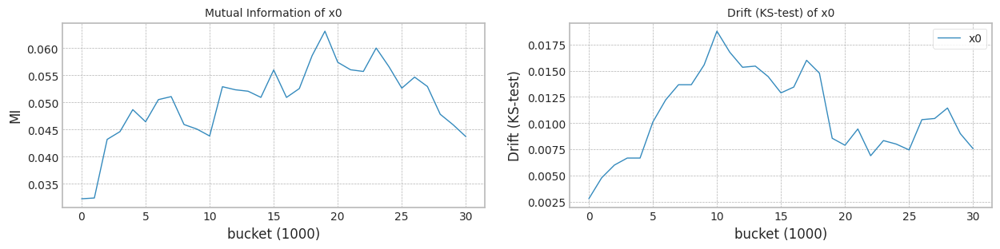

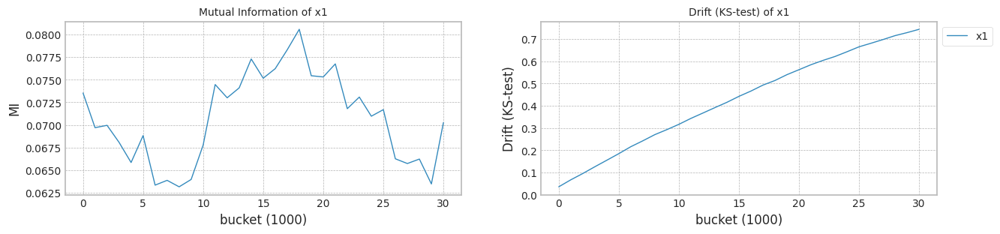

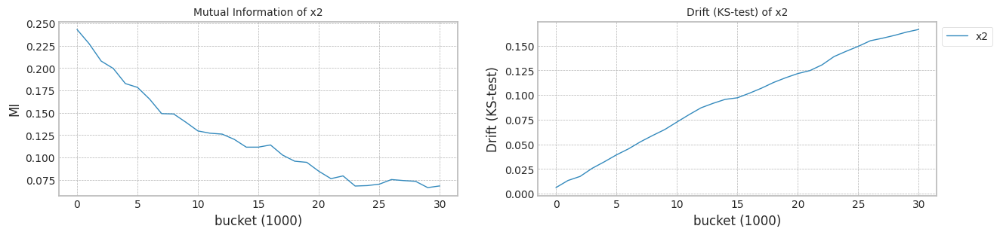

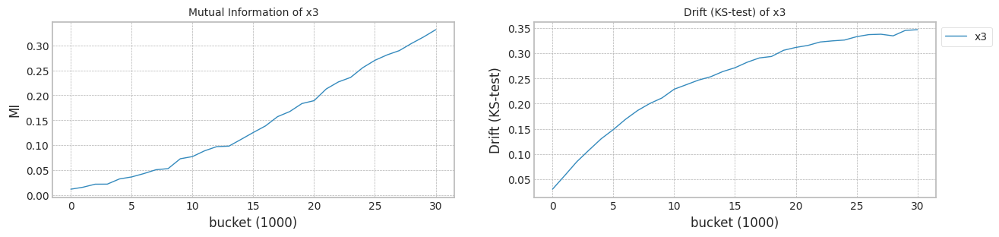

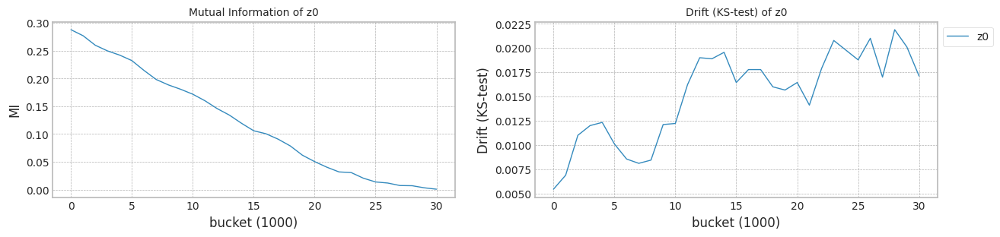

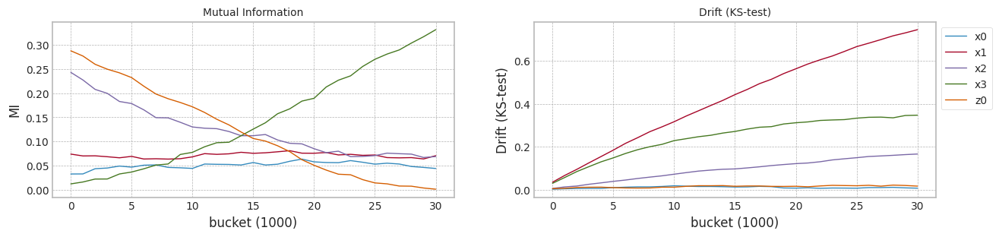

In [ ]:
columns=['x0','x1','x2','x3','z0']
X4 = pd.DataFrame(x4,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X4, y4,train_size, test_size)

In [ ]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.73it/s]


Test f1 score: 0.9100519112789052
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6955085967796114
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.87it/s]


Test f1 score: 0.9320780094149295
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.163254
x1    0.346247
x2    0.136100
x3    0.458430
z0    0.212276
dtype: float64
Mean F1 for all data: 0.8213330417332113
Normal model mean        : 0.6955085967796114
Drift tolerant model mean: 0.8213330417332113
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.47it/s]


Test f1 score: 0.9004264787687744
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6792197135633432
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 241.24it/s]


Test f1 score: 0.932657356035967
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.079412
x1    0.362943
x2    0.134283
x3    0.547136
z0    0.199147
dtype: float64
Mean F1 for all data: 0.78465046182834
Normal model mean        : 0.6873641551714773
Drift tolerant model mean: 0.8029917517807756
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.56it/s]


Test f1 score: 0.9145961170908359
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7518815702276859
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.19it/s]


Test f1 score: 0.925281473899693
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.137624
x1    0.328968
x2    0.153057
x3    0.387556
z0    0.234283
dtype: float64
Mean F1 for all data: 0.7871787147487646
Normal model mean        : 0.7088699601902135
Drift tolerant model mean: 0.7977207394367719
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.42it/s]


Test f1 score: 0.9121315192743764
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7176857800038914
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 245.22it/s]


Test f1 score: 0.9294343240651965
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.131416
x1    0.330082
x2    0.225057
x3    0.416785
z0    0.161065
dtype: float64
Mean F1 for all data: 0.8015665620354517
Normal model mean        : 0.7110739151436329
Drift tolerant model mean: 0.7986821950864419
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 683.68it/s]


Test f1 score: 0.8971049234740918
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6757244203938739
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.61it/s]


Test f1 score: 0.9314093314093315
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.132409
x1    0.377839
x2    0.262165
x3    0.610434
z0    0.227186
dtype: float64
Mean F1 for all data: 0.7928095111674787
Normal model mean        : 0.7040040161936811
Drift tolerant model mean: 0.7975076583026492
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 686.39it/s]


Test f1 score: 0.9023869984763839
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7051551341264631
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.53it/s]


Test f1 score: 0.9230192217533989
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.124731
x1    0.310703
x2    0.143097
x3    0.354552
z0    0.118416
dtype: float64
Mean F1 for all data: 0.7817601863167297
Normal model mean        : 0.7041958691824782
Drift tolerant model mean: 0.7948830796383293
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 680.55it/s]


Test f1 score: 0.902545380793023
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.70665046647586
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 245.51it/s]


Test f1 score: 0.9264931087289434
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.196910
x1    0.328086
x2    0.250140
x3    0.657434
z0    0.228921
dtype: float64
Mean F1 for all data: 0.8176735060603882
Normal model mean        : 0.7045465259386756
Drift tolerant model mean: 0.7981388548414806
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.74it/s]


Test f1 score: 0.911817410166934
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7089878126390659
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.71it/s]


Test f1 score: 0.9270198170731708
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.141810
x1    0.347301
x2    0.216022
x3    0.558434
z0    0.158699
dtype: float64
Mean F1 for all data: 0.7955573488401245
Normal model mean        : 0.7051016867762243
Drift tolerant model mean: 0.797816166591311
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.13it/s]


Test f1 score: 0.9141776937618148
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7176464463015735
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.55it/s]


Test f1 score: 0.9313857389967327
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.136609
x1    0.346133
x2    0.224781
x3    0.619534
z0    0.225853
dtype: float64
Mean F1 for all data: 0.8025787475388886
Normal model mean        : 0.7064955489457075
Drift tolerant model mean: 0.7983453422521529
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 690.03it/s]


Test f1 score: 0.8962663233400773
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6748250956889921
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 245.63it/s]


Test f1 score: 0.9175288799598192
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.193738
x1    0.391792
x2    0.162427
x3    0.155656
z0    0.155806
dtype: float64
Mean F1 for all data: 0.7474067440080728
Normal model mean        : 0.7033285036200361
Drift tolerant model mean: 0.7932514824277449
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.15it/s]


Test f1 score: 0.897849958475593
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6732593964279855
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.22it/s]


Test f1 score: 0.9293666026871401
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.142330
x1    0.330789
x2    0.227613
x3    0.616681
z0    0.268889
dtype: float64
Mean F1 for all data: 0.794806608445647
Normal model mean        : 0.7005949484207586
Drift tolerant model mean: 0.7933928575202814
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.97it/s]


Test f1 score: 0.9083449883449882
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6946659118132491
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.53it/s]


Test f1 score: 0.9203079692030797
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.090814
x1    0.391384
x2    0.181616
x3    0.197358
z0    0.148315
dtype: float64
Mean F1 for all data: 0.7589419795249754
Normal model mean        : 0.7001008620367996
Drift tolerant model mean: 0.7905219510206726
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.58it/s]


Test f1 score: 0.9139969681657403
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7695391091961208
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.92it/s]


Test f1 score: 0.907740819855559
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.137075
x1    0.378839
x2    0.225376
x3    0.231262
z0    0.172982
dtype: float64
Mean F1 for all data: 0.7029658896291895
Normal model mean        : 0.7054422656644396
Drift tolerant model mean: 0.7837868693751738
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.30it/s]


Test f1 score: 0.9120754716981133
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7030030621508987
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.15it/s]


Test f1 score: 0.9339867396944365
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.173315
x1    0.336563
x2    0.146233
x3    0.404527
z0    0.265939
dtype: float64
Mean F1 for all data: 0.8401455726230626
Normal model mean        : 0.7052680368420438
Drift tolerant model mean: 0.7878124910357374
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 686.64it/s]


Test f1 score: 0.9095354523227384
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7079074398921067
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.39it/s]


Test f1 score: 0.9346228239845261
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.090477
x1    0.381864
x2    0.111792
x3    0.518108
z0    0.199272
dtype: float64
Mean F1 for all data: 0.821902655839801
Normal model mean        : 0.7054439970453814
Drift tolerant model mean: 0.7900851686893416
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.43it/s]


Test f1 score: 0.9159125188536953
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7280485005312164
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.20it/s]


Test f1 score: 0.9270574756540003
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.129971
x1    0.328642
x2    0.201366
x3    0.555391
z0    0.213810
dtype: float64
Mean F1 for all data: 0.7893356017285397
Normal model mean        : 0.7068567785132461
Drift tolerant model mean: 0.7900383207542916
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.55it/s]


Test f1 score: 0.9106790645252184
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.64it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7188380447887287
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.66it/s]


Test f1 score: 0.9044953962809171
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.112978
x1    0.381699
x2    0.243423
x3    0.225624
z0    0.251746
dtype: float64
Mean F1 for all data: 0.7610848259619682
Normal model mean        : 0.7075615588823921
Drift tolerant model mean: 0.788335174001802
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.82it/s]


Test f1 score: 0.9156740404613348
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7235246904039809
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.10it/s]


Test f1 score: 0.9335385207271328
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.141867
x1    0.355366
x2    0.220341
x3    0.485656
z0    0.222086
dtype: float64
Mean F1 for all data: 0.8077926463607362
Normal model mean        : 0.7084483995224804
Drift tolerant model mean: 0.7894161446884094
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 688.22it/s]


Test f1 score: 0.9133045599549633
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7211113431200888
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.74it/s]


Test f1 score: 0.9313444253203288
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.204498
x1    0.335695
x2    0.123082
x3    0.509685
z0    0.175011
dtype: float64
Mean F1 for all data: 0.7864418425048618
Normal model mean        : 0.709114870238144
Drift tolerant model mean: 0.7892596024682227
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.88it/s]


Test f1 score: 0.9116814493300622
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7054873847796784
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 245.84it/s]


Test f1 score: 0.9327843738031406
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.153215
x1    0.358871
x2    0.147014
x3    0.527982
z0    0.207946
dtype: float64
Mean F1 for all data: 0.7988353169653555
Normal model mean        : 0.7089334959652207
Drift tolerant model mean: 0.7897383881930794


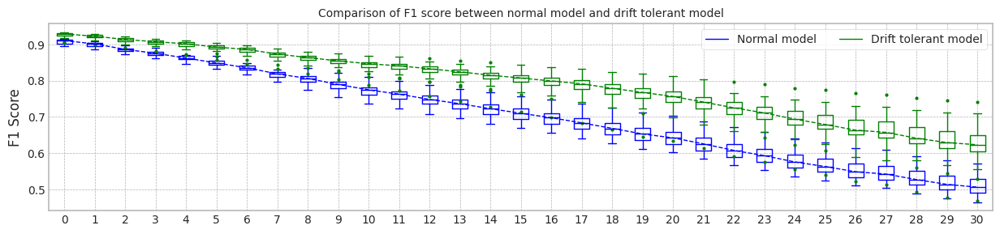

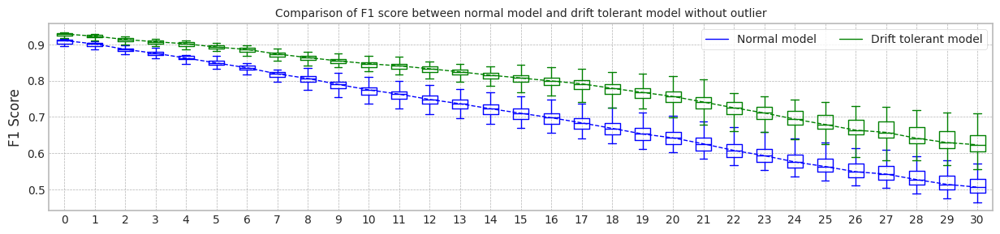

max_mean_trial= 13


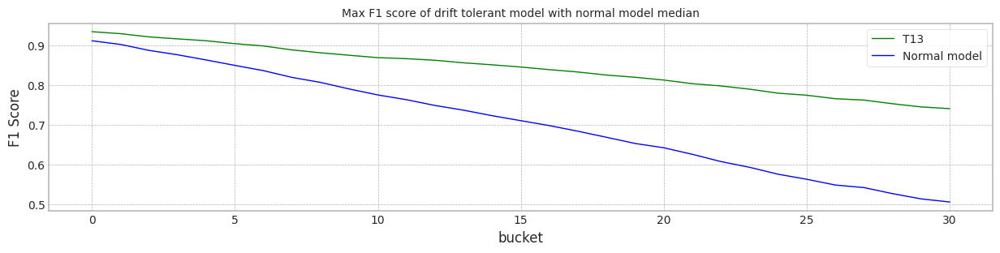

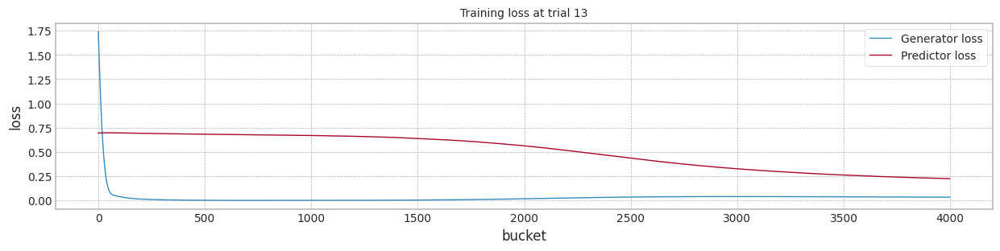

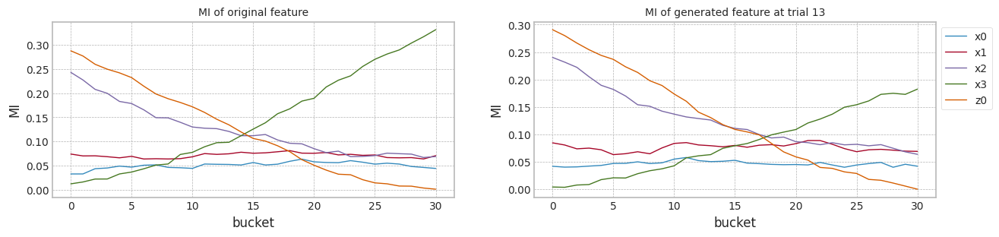

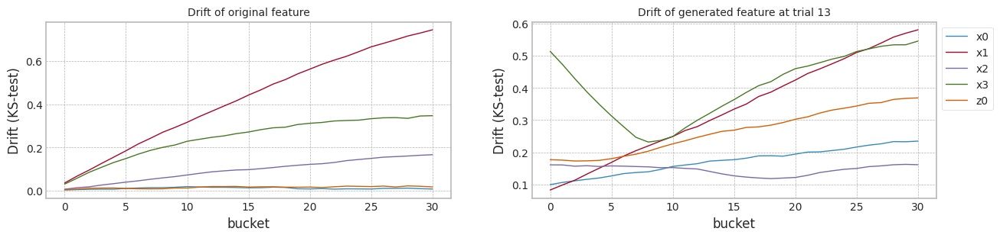

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.910052,0.910052,0.695509,0.485772
1,1.0,0.900426,0.900426,0.679220,0.468137
2,2.0,0.914596,0.914596,0.751882,0.571839
3,3.0,0.912132,0.912132,0.717686,0.534419
4,4.0,0.897105,0.897105,0.675724,0.470208
5,5.0,0.902387,0.902387,0.705155,0.495738
6,6.0,0.902545,0.902545,0.706650,0.499509
7,7.0,0.911817,0.911817,0.708988,0.511062
8,8.0,0.914178,0.914178,0.717646,0.520180
9,9.0,0.896266,0.896266,0.674825,0.465242


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.932078,0.932078,0.821333,0.705163
1,1.0,0.932657,0.932657,0.784650,0.585489
2,2.0,0.925281,0.925281,0.787179,0.621542
3,3.0,0.929434,0.929434,0.801567,0.659549
4,4.0,0.931409,0.931409,0.792810,0.610819
5,5.0,0.923019,0.923019,0.781760,0.624303
6,6.0,0.926493,0.926493,0.817674,0.709919
7,7.0,0.927020,0.927020,0.795557,0.637575
8,8.0,0.931386,0.931386,0.802579,0.639083
9,9.0,0.917529,0.917529,0.747407,0.529911


In [ ]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100) #np.max(X1['b'])+1)

## real-world data 의 실험

### Loan data 실험

#### Dataset 준비

 미국에 본사를 둔 peer-to-peer 대출 기업인 Lending Club은 투자하려는 사람들과 돈을 빌리려는 사람들을 연결해 준다. Lending Club을 통해 투자자가 자신의 돈을 투자할 때, 이 돈은 대출을 받는 사람들에게 전달되며, 대출을 받은 사람들이 대출금을 상환할 때, 원금과 이자가 투자자에게 돌아간다. 대출금의 이자율이 일반적으로 낮아지고 투자자의 수익률이 증가하여 모두에게 이로운 비즈니스 구조를 갖는다.

Lending Club 데이터셋에는 2007년부터 2018년까지의 모든 대출에 대한 완전한 대출 데이터가 포함되어 있다. 이 데이터에는 현재 대출 상태 (상환 중, 연체, 완전 상환 등)와 최신 결제 정보가 포함되어있다. 신용 점수, 금융 조회 횟수, 우편번호와 주소 등과 같은  변수들이 포함되어 있다. 해당 데이터는 약 230만 개의 건수와 150개의 변수로 이루어진 행렬 형태의 데이터이다.

 Lending club loan data는 장기간의 수집 데이터로서 Drift의 특성이 잘 반영되어 있을 것으로 추정하여 실험에 적용하였다.

https://www.kaggle.com/datasets/adarshsng/lending-club-loan-data-csv
https://www.kaggle.com/code/irisyuzhou/lending-club-data-exploration-iris-zhou

데이터는 정제과정을 통해 81개의 feature와 120만건으로 정리하였고, 목표값 y는 아래 그래프에서 fully_paid 가 상환에 해당하고 Charged Off 가 default에 해당하는 것으로 간주하고 default 여부를 예측하는 true, false의 binary class로 구성한다.


##### Data load

In [ ]:

if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

df_accepted = pd.read_csv("/content/drive/MyDrive/Drift/accepted_2007_to_2018Q4.csv")

print(df_accepted.shape)

(2260701, 151)


##### Data 정제

In [ ]:
# for the sake of simplicity, let's consider only Fully Paid and Charged Off values:
df_accepted = df_accepted[df_accepted.loan_status.isin(['Fully Paid', 'Charged Off'])]
print(df_accepted.shape)

cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(50).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# maybe we can go further, and eliminate columns up to title:
cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(45).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# Remaining columns have missing data points, but they account for less than 0.2% of the total data. Let's remove the rows that are missing those values in those columns with dropna():
df_accepted = df_accepted.dropna()
print(df_accepted.shape)

# These are constant columns. We can drop it either.
cols_to_drop = ['out_prncp', 'out_prncp_inv', 'policy_code']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# It seems we have many "duplicated" information. Let's drop some columns, based on visual inspection at corr_pairs dataframe:
cols_to_drop = ['fico_range_low', 'funded_amnt_inv', 'funded_amnt', 'total_pymnt_inv', 'total_pymnt', 'installment', 'collection_recovery_fee', 'total_rec_prncp', 'last_fico_range_low']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

values = df_accepted.loan_status.unique()
encode = [1,0]
d = dict(zip(values, encode))
df_accepted['loan_paid'] = df_accepted['loan_status'].map(d)
df_accepted = df_accepted.drop(columns=['loan_status'])

df_accepted

(1345310, 151)
(1345310, 101)
(1345310, 56)
(1341026, 56)
(1341026, 53)
(1341026, 44)


,id,loan_amnt,term,int_rate,grade,sub_grade,home_ownership,annual_inc,verification_status,issue_d,...,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,hardship_flag,disbursement_method,debt_settlement_flag,loan_paid
0,68407277,3600.0,36 months,13.99,C,C4,MORTGAGE,55000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
1,68355089,24700.0,36 months,11.99,C,C1,MORTGAGE,65000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2,68341763,20000.0,60 months,10.78,B,B4,MORTGAGE,63000.0,Not Verified,Dec-2015,...,Joint App,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
4,68476807,10400.0,60 months,22.45,F,F1,MORTGAGE,104433.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
5,68426831,11950.0,36 months,13.44,C,C3,RENT,34000.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260688,89905081,18000.0,60 months,9.49,B,B2,OWN,130000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260690,88948836,29400.0,60 months,13.99,C,C3,MORTGAGE,180792.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260691,89996426,32000.0,60 months,14.49,C,C4,MORTGAGE,157000.0,Source Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,0
2260692,90006534,16000.0,60 months,12.79,C,C1,RENT,150000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,3.0,0.0,N,Cash,N,1


In [ ]:
# droping constant columns
print(df_accepted.pymnt_plan.value_counts())
print(df_accepted.hardship_flag.value_counts())
cols_to_drop = ['id', 'pymnt_plan', 'hardship_flag']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)
cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

print(df_accepted.term.value_counts())

# convert term into either a 36 or 60 integer numeric data type

l1 = df_accepted.term.unique()
l2 = [36, 60]
d = dict(zip(l1, l2))

df_accepted['term'] = df_accepted['term'].map(d)

# as grade is part of sub_grade, so let's just drop the grade feature.

df_accepted = df_accepted.drop(columns='grade')

df_accepted = pd.get_dummies(df_accepted, columns = ['sub_grade'], prefix='', prefix_sep='', drop_first=True)

cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

# for these columns, let's just create dummy variables, concatenate them with the original dataframe and drop original columns.

df_accepted = pd.get_dummies(df_accepted, columns = ['verification_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['application_type'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['initial_list_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['purpose'], prefix='', prefix_sep='', drop_first=True)
print(df_accepted.shape)

df_accepted['home_ownership'] = df_accepted.home_ownership.replace('NONE', 'ANY')
df_accepted = pd.get_dummies(df_accepted, columns = ['home_ownership'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=[ 'url', 'last_pymnt_d', 'last_credit_pull_d'])
df_accepted = df_accepted.drop(columns=['zip_code', 'addr_state'])
df_accepted = pd.get_dummies(df_accepted, columns = ['disbursement_method'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['debt_settlement_flag'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=['earliest_cr_line'])
print(df_accepted.shape)


df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jan','01')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Feb','02')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Mar','03')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Apr','04')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('May','05')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jun','06')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jul','07')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Aug','08')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Sep','09')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Oct','10')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Dec','11')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Nov','12')

def reorder_issue_d(dt):
    a = dt.split('-')
    return a[1]+a[0]

reorder_issue_d('01-2009')

df_accepted['issue_d'] = df_accepted['issue_d'].apply(reorder_issue_d)
df_accepted = df_accepted.sort_values(by='issue_d')
df_accepted.reset_index(drop=True, inplace=True)

df_accepted.info()

n    1341026
Name: pymnt_plan, dtype: int64
N    1341026
Name: hardship_flag, dtype: int64
(1341026, 41)
Index(['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status',
       'issue_d', 'url', 'purpose', 'zip_code', 'addr_state',
       'earliest_cr_line', 'initial_list_status', 'last_pymnt_d',
       'last_credit_pull_d', 'application_type', 'disbursement_method',
       'debt_settlement_flag'],
      dtype='object')
 36 months    1017398
 60 months     323628
Name: term, dtype: int64
Index(['home_ownership', 'verification_status', 'issue_d', 'url', 'purpose',
       'zip_code', 'addr_state', 'earliest_cr_line', 'initial_list_status',
       'last_pymnt_d', 'last_credit_pull_d', 'application_type',
       'disbursement_method', 'debt_settlement_flag'],
      dtype='object')
(1341026, 86)
(1341026, 83)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1341026 entries, 0 to 1341025
Data columns (total 83 columns):
 #   Column                      Non-Null Count    Dtype  

##### Dataset 만들기

In [ ]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values

2010
2011
2012
2013
2014
2015
2016
2017
2018


In [ ]:

X[2010].shape

(11497, 81)

In [ ]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'dti', 'delinq_2yrs',
       'fico_range_high', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'last_pymnt_amnt', 'last_fico_range_high',
       'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],
      dtype

In [ ]:
seed_everything(12)

X_df = pd.DataFrame(X[2010],columns=COLUMNS)
mi_scores = make_mi_scores(X_df, Y[2010], discrete_features="auto")
print(mi_scores)

recoveries                  0.375327
last_fico_range_high        0.090427
last_pymnt_amnt             0.085496
total_rec_late_fee          0.038954
int_rate                    0.016850
                              ...   
F2                          0.000000
chargeoff_within_12_mths    0.000000
G1                          0.000000
G3                          0.000000
D3                          0.000000
Name: MI Scores, Length: 81, dtype: float64


In [ ]:
# MI Top 5, columns
top_columns = list(mi_scores[0:5].index)
top_columns

['recoveries',
 'last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate']

+ 일부러 예측 확률을 떨어뜨리기 위해 (조정), "recoveries" feature를 제외 한다.

In [ ]:
top_columns = list(mi_scores[1:6].index)
top_columns

['last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate',
 'term']

In [ ]:
top_columns_index = [list(COLUMNS).index(tc) for tc in top_columns]
top_columns_index

[17, 16, 14, 2, 1]

#### 실험

In [ ]:
# 1/10 로 사이즈 줄이기...
seed_everything()

X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
#print(s.shape)
X3 = pd.DataFrame(X2[s],columns=COLUMNS)
Y3 = Y2[s]



columns: ['recoveries', 'last_fico_range_high', 'last_pymnt_amnt', 'total_rec_late_fee', 'int_rate']
MI Analysis MI Max 0.28468, Min 0.02064, Mean 0.17477, Std 0.11951
Dataset structure X_train, (20000, 5) X_test, (20000, 5) X_live (123968, 5)
Truncate 19968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (26, 20000, 5)


100%|██████████| 26/26 [00:11<00:00,  2.28it/s]


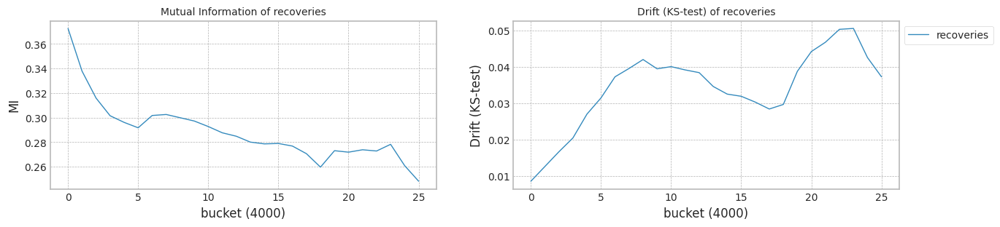

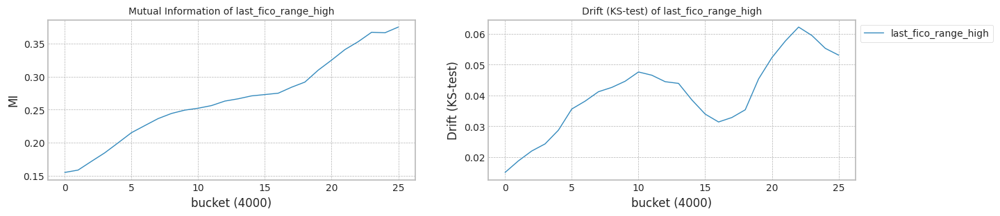

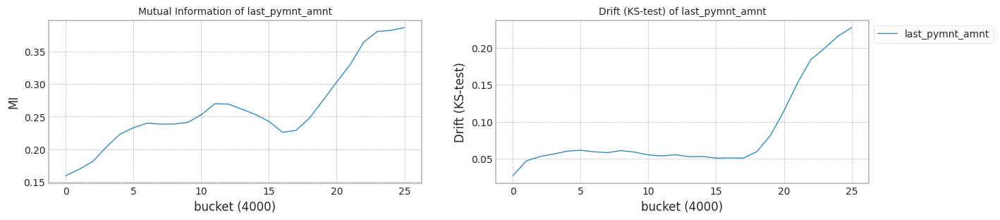

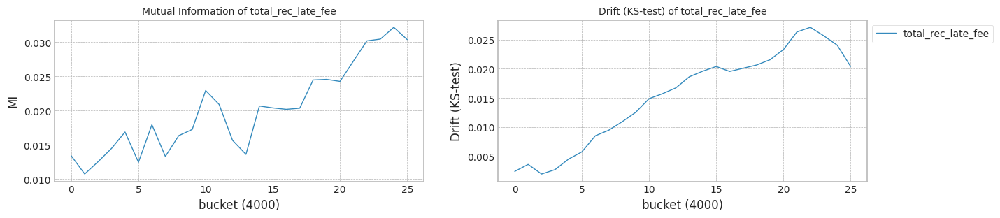

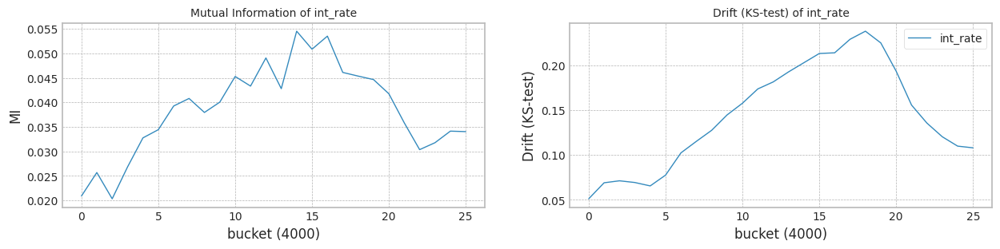

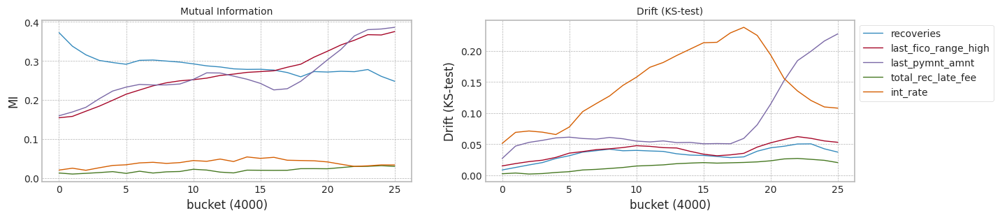

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:10<00:00, 392.02it/s]


Test f1 score: 0.9315357887421821
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.25it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9116853036009894
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 216.59it/s]


Test f1 score: 0.9662837449741527
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.28it/s]


mean of drift:
recoveries              0.855962
last_fico_range_high    0.155696
last_pymnt_amnt         0.489004
total_rec_late_fee      0.945958
int_rate                0.154527
dtype: float64
Mean F1 for all data: 0.902024141621385
Normal model mean        : 0.9116853036009894
Drift tolerant model mean: 0.902024141621385
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 600.29it/s]


Test f1 score: 0.9149358956909927
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.22it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8892937557842946
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 218.88it/s]


Test f1 score: 0.9736659335571246
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.23it/s]


mean of drift:
recoveries              0.826762
last_fico_range_high    0.123967
last_pymnt_amnt         0.487994
total_rec_late_fee      0.965750
int_rate                0.153752
dtype: float64
Mean F1 for all data: 0.9635289067321797
Normal model mean        : 0.9004895296926421
Drift tolerant model mean: 0.9327765241767824
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 596.65it/s]


Test f1 score: 0.9483997387328544
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.25it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9375235777252146
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 218.93it/s]


Test f1 score: 0.9735547711359296
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.29it/s]


mean of drift:
recoveries              0.860837
last_fico_range_high    0.256190
last_pymnt_amnt         0.090777
total_rec_late_fee      0.909363
int_rate                0.149956
dtype: float64
Mean F1 for all data: 0.9615167279616478
Normal model mean        : 0.9128342123701662
Drift tolerant model mean: 0.9423565921050708
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 609.32it/s]


Test f1 score: 0.9299447881696862
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.27it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9093841469423276
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 218.93it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.28it/s]


mean of drift:
recoveries              0.863567
last_fico_range_high    0.215604
last_pymnt_amnt         0.496985
total_rec_late_fee      0.919577
int_rate                0.135250
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model mean        : 0.9119716960132065
Drift tolerant model mean: 0.9284656157939406
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 602.01it/s]


Test f1 score: 0.9438628260992586
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.23it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9316019571171616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 218.13it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.20it/s]


mean of drift:
recoveries              0.876556
last_fico_range_high    0.111090
last_pymnt_amnt         0.492600
total_rec_late_fee      0.941187
int_rate                0.160262
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model mean        : 0.9158977482339974
Drift tolerant model mean: 0.9201310300072624
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 586.12it/s]


Test f1 score: 0.9339622641509433
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.26it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9151424942160997
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 220.41it/s]


Test f1 score: 0.972700983227299
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.29it/s]


mean of drift:
recoveries              0.792519
last_fico_range_high    0.179965
last_pymnt_amnt         0.485652
total_rec_late_fee      0.945869
int_rate                0.154469
dtype: float64
Mean F1 for all data: 0.912301631282869
Normal model mean        : 0.9157718725643478
Drift tolerant model mean: 0.9188261302198635
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 602.51it/s]


Test f1 score: 0.9137813985064493
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.30it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867861910860791
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 226.39it/s]


Test f1 score: 0.9724712278063733
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.888377
last_fico_range_high    0.172960
last_pymnt_amnt         0.482706
total_rec_late_fee      0.943046
int_rate                0.150979
dtype: float64
Mean F1 for all data: 0.9529094351232033
Normal model mean        : 0.9116310609245951
Drift tolerant model mean: 0.9236951737774834
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 607.06it/s]


Test f1 score: 0.9304714833120453
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.30it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9096420996103313
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 220.80it/s]


Test f1 score: 0.9735082081125683
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.860169
last_fico_range_high    0.106212
last_pymnt_amnt         0.489862
total_rec_late_fee      0.945606
int_rate                0.138977
dtype: float64
Mean F1 for all data: 0.9228050348757324
Normal model mean        : 0.9113824407603123
Drift tolerant model mean: 0.9235839064147646
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 602.84it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.28it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.05it/s]


Test f1 score: 0.9735015042814164
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.32it/s]


mean of drift:
recoveries              0.835929
last_fico_range_high    0.060967
last_pymnt_amnt         0.262706
total_rec_late_fee      0.965738
int_rate                0.153129
dtype: float64
Mean F1 for all data: 0.9426373103028765
Normal model mean        : 0.9086502458825608
Drift tolerant model mean: 0.9257009512912214
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 609.73it/s]


Test f1 score: 0.9341360760375729
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.32it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9162468130034456
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 225.12it/s]


Test f1 score: 0.9729291994447017
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.825979
last_fico_range_high    0.119350
last_pymnt_amnt         0.493856
total_rec_late_fee      0.965750
int_rate                0.166417
dtype: float64
Mean F1 for all data: 0.9629609251174585
Normal model mean        : 0.9094099025946493
Drift tolerant model mean: 0.9294269486738452
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 612.40it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.31it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.50it/s]


Test f1 score: 0.9735973597359735
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]


mean of drift:
recoveries              0.859887
last_fico_range_high    0.119237
last_pymnt_amnt         0.489481
total_rec_late_fee      0.945669
int_rate                0.157865
dtype: float64
Mean F1 for all data: 0.9216000323873119
Normal model mean        : 0.9073537920733675
Drift tolerant model mean: 0.928715410829615
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.69it/s]


Test f1 score: 0.9385191652350241
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9233479736340093
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.47it/s]


Test f1 score: 0.9738274464389113
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.859842
last_fico_range_high    0.201092
last_pymnt_amnt         0.478188
total_rec_late_fee      0.915900
int_rate                0.161769
dtype: float64
Mean F1 for all data: 0.9331567170454564
Normal model mean        : 0.9086866405367543
Drift tolerant model mean: 0.929085519680935
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 614.62it/s]


Test f1 score: 0.9386105263157895
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.36it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9236263800175257
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.82it/s]


Test f1 score: 0.9729635948298296
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.860535
last_fico_range_high    0.118358
last_pymnt_amnt         0.486925
total_rec_late_fee      0.946492
int_rate                0.170454
dtype: float64
Mean F1 for all data: 0.9261698817330769
Normal model mean        : 0.9098358512660444
Drift tolerant model mean: 0.9288612398387921
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.29it/s]


Test f1 score: 0.9179459164162797
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8935746324871745
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.63it/s]


Test f1 score: 0.9731042859621726
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.45it/s]


mean of drift:
recoveries              0.860213
last_fico_range_high    0.159577
last_pymnt_amnt         0.488327
total_rec_late_fee      0.938521
int_rate                0.152717
dtype: float64
Mean F1 for all data: 0.9580441268973967
Normal model mean        : 0.9086743356389823
Drift tolerant model mean: 0.9309457317715496
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 616.62it/s]


Test f1 score: 0.9171261669487363
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8928071580545702
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.16it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]


mean of drift:
recoveries              0.860775
last_fico_range_high    0.151817
last_pymnt_amnt         0.507894
total_rec_late_fee      0.945890
int_rate                0.142008
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model mean        : 0.9076165238000214
Drift tolerant model mean: 0.9280021954441496
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 613.10it/s]


Test f1 score: 0.9412096592191379
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9274718720234378
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.37it/s]


Test f1 score: 0.9728807678963802
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.844644
last_fico_range_high    0.144329
last_pymnt_amnt         0.485313
total_rec_late_fee      0.983058
int_rate                0.156413
dtype: float64
Mean F1 for all data: 0.9254850978602699
Normal model mean        : 0.9088574830639851
Drift tolerant model mean: 0.927844876845157
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 607.03it/s]


Test f1 score: 0.9374297910581891
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9220949808842456
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.85it/s]


Test f1 score: 0.9730151843817787
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.880825
last_fico_range_high    0.123523
last_pymnt_amnt         0.483246
total_rec_late_fee      0.945640
int_rate                0.152900
dtype: float64
Mean F1 for all data: 0.9236892492544809
Normal model mean        : 0.9096361594063533
Drift tolerant model mean: 0.9276004281633526
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.15it/s]


Test f1 score: 0.9355397774920334
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.36it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9176229150724697
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.19it/s]


Test f1 score: 0.9657864523536165
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.879033
last_fico_range_high    0.105958
last_pymnt_amnt         0.486654
total_rec_late_fee      0.946502
int_rate                0.147902
dtype: float64
Mean F1 for all data: 0.9020175475223926
Normal model mean        : 0.910079868054471
Drift tolerant model mean: 0.9261791570166326
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 619.54it/s]


Test f1 score: 0.922117866754545
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8991483356899502
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.33it/s]


Test f1 score: 0.9724261518006821
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.860750
last_fico_range_high    0.159419
last_pymnt_amnt         0.493319
total_rec_late_fee      0.935063
int_rate                0.161031
dtype: float64
Mean F1 for all data: 0.9573827315206922
Normal model mean        : 0.9095045242458121
Drift tolerant model mean: 0.927821450411583
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 616.98it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.05it/s]


Test f1 score: 0.9729026287631222
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.890906
last_fico_range_high    0.157992
last_pymnt_amnt         0.495235
total_rec_late_fee      0.965750
int_rate                0.154210
dtype: float64
Mean F1 for all data: 0.9689929410762491
Normal model mean        : 0.9083689323765489
Drift tolerant model mean: 0.9298800249448164


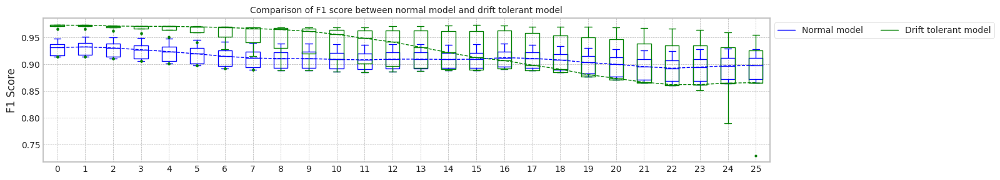

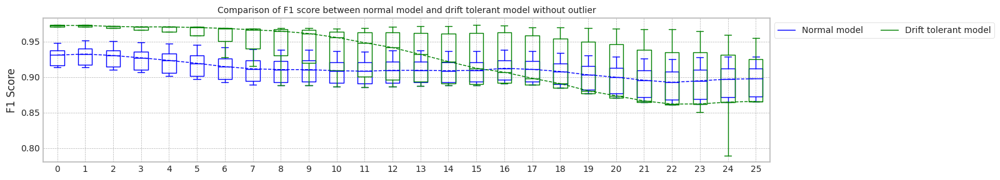

max_mean_trial= 19


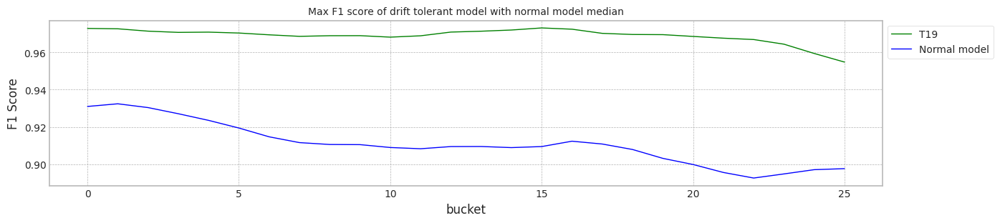

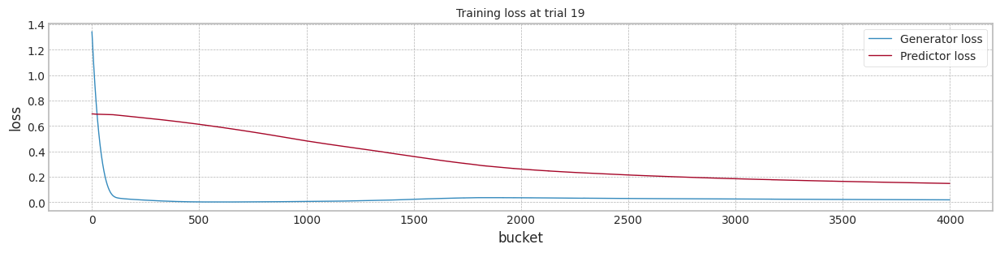

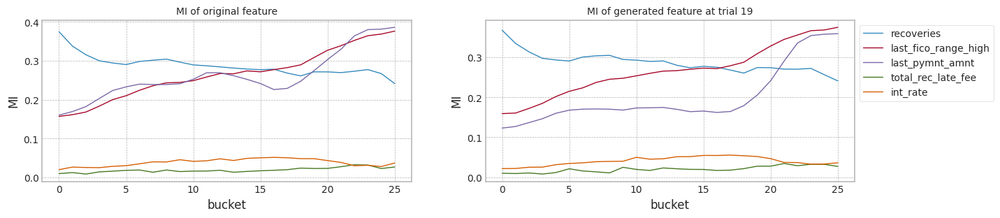

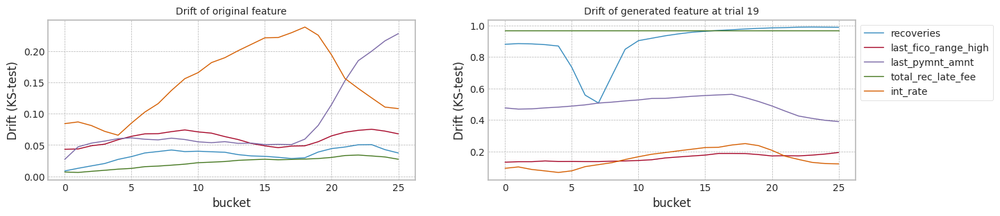

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.931536,0.931536,0.911685,0.899187
1,1.0,0.914936,0.914936,0.889294,0.869137
2,2.0,0.948400,0.948400,0.937524,0.928591
3,3.0,0.929945,0.929945,0.909384,0.895627
4,4.0,0.943863,0.943863,0.931602,0.923030
5,5.0,0.933962,0.933962,0.915142,0.902838
6,6.0,0.913781,0.913781,0.886786,0.865555
7,7.0,0.930471,0.930471,0.909642,0.896045
8,8.0,0.913811,0.913811,0.886793,0.865538
9,9.0,0.934136,0.934136,0.916247,0.904848


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.966284,0.966284,0.902024,0.865538
1,1.0,0.973666,0.973666,0.963529,0.953313
2,2.0,0.973555,0.973555,0.961517,0.942605
3,3.0,0.913811,0.913811,0.886793,0.865538
4,4.0,0.913811,0.913811,0.886793,0.865538
5,5.0,0.972701,0.972701,0.912302,0.865538
6,6.0,0.972471,0.972471,0.952909,0.913721
7,7.0,0.973508,0.973508,0.922805,0.865628
8,8.0,0.973502,0.973502,0.942637,0.729618
9,9.0,0.972929,0.972929,0.962961,0.951385


columns: ['last_fico_range_high', 'last_pymnt_amnt', 'total_rec_late_fee', 'int_rate', 'term']
MI Analysis MI Max 0.27313, Min 0.02197, Mean 0.12315, Std 0.11612
Dataset structure X_train, (20000, 5) X_test, (20000, 5) X_live (123968, 5)
Truncate 19968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (26, 20000, 5)


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


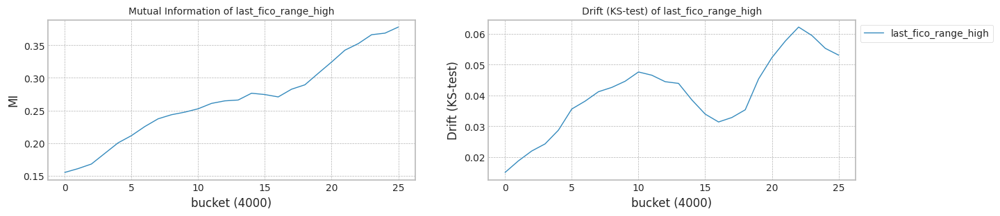

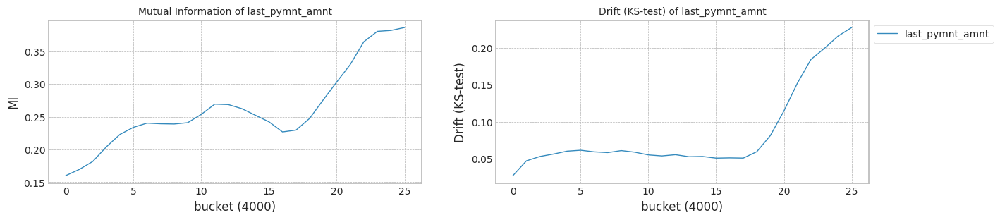

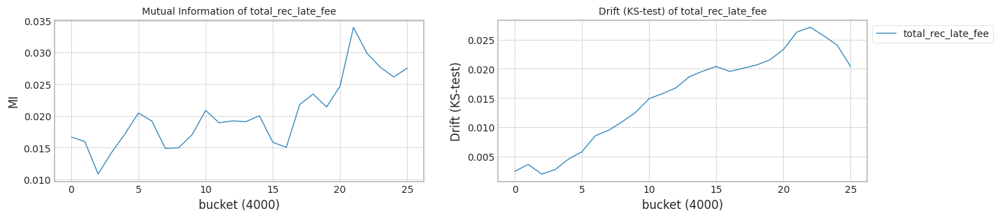

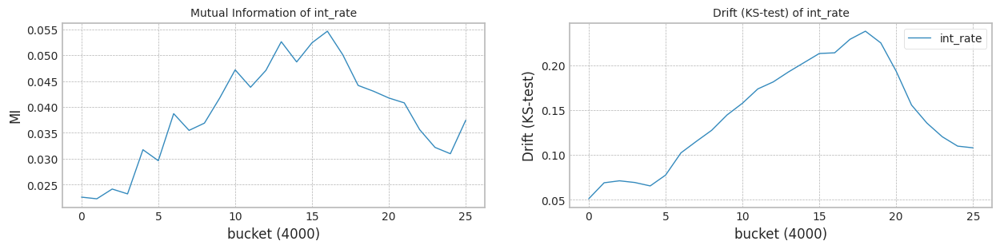

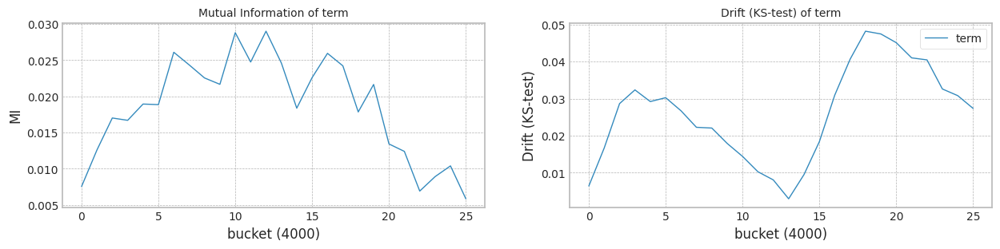

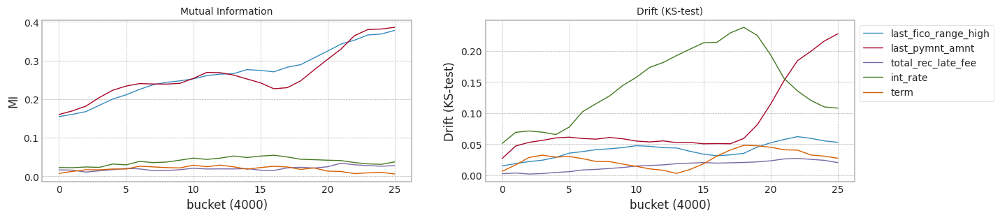

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 624.41it/s]


Test f1 score: 0.9271707127381811
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.9084555030352361
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.38it/s]


Test f1 score: 0.923305785123967
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
last_fico_range_high    0.222535
last_pymnt_amnt         0.515531
total_rec_late_fee      0.940273
int_rate                0.156360
term                    0.754850
dtype: float64
Mean F1 for all data: 0.8924408184187776
Normal model mean        : 0.9084555030352361
Drift tolerant model mean: 0.8924408184187776
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 611.24it/s]


Test f1 score: 0.9137767156396818
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.8867910000847132
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.03it/s]


Test f1 score: 0.9382313392269619
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
last_fico_range_high    0.261181
last_pymnt_amnt         0.485854
total_rec_late_fee      0.942883
int_rate                0.125800
term                    0.680313
dtype: float64
Mean F1 for all data: 0.900309748625963
Normal model mean        : 0.8976232515599747
Drift tolerant model mean: 0.8963752835223704
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 620.94it/s]


Test f1 score: 0.9295562377895619
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.32it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.9134452069855663
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.35it/s]


Test f1 score: 0.9324536777091522
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
last_fico_range_high    0.276469
last_pymnt_amnt         0.492538
total_rec_late_fee      0.939677
int_rate                0.135825
term                    0.734585
dtype: float64
Mean F1 for all data: 0.9060725447863531
Normal model mean        : 0.9028972367018385
Drift tolerant model mean: 0.8996077039436979
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 601.24it/s]


Test f1 score: 0.9241489920637116
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.9030337087185487
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 226.57it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
last_fico_range_high    0.266785
last_pymnt_amnt         0.494344
total_rec_late_fee      0.932679
int_rate                0.152119
term                    0.754850
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model mean        : 0.902931354706016
Drift tolerant model mean: 0.8964039496729108
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.08it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.32it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.23it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
last_fico_range_high    0.197606
last_pymnt_amnt         0.488894
total_rec_late_fee      0.933740
int_rate                0.143896
term                    0.754850
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model mean        : 0.8997036211369227
Drift tolerant model mean: 0.8944816971104386
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.15it/s]


Test f1 score: 0.92485356577742
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.9046349061682263
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.71it/s]


Test f1 score: 0.9332094908384699
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
last_fico_range_high    0.284988
last_pymnt_amnt         0.494167
total_rec_late_fee      0.943860
int_rate                0.162713
term                    0.717225
dtype: float64
Mean F1 for all data: 0.8967391073882912
Normal model mean        : 0.9005255019754733
Drift tolerant model mean: 0.8948579321567474
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 624.25it/s]


Test f1 score: 0.9305850766304957
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.32it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.9153645708910473
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 227.84it/s]


Test f1 score: 0.9407964933529429
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
last_fico_range_high    0.221802
last_pymnt_amnt         0.481838
total_rec_late_fee      0.937438
int_rate                0.120217
term                    0.754850
dtype: float64
Mean F1 for all data: 0.9234309863799979
Normal model mean        : 0.9026453689634125
Drift tolerant model mean: 0.8989397970457832
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.72it/s]


Test f1 score: 0.9138062133391267
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.8868129244434532
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 226.96it/s]


Test f1 score: 0.9344938676312666
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
last_fico_range_high    0.203060
last_pymnt_amnt         0.486794
total_rec_late_fee      0.937033
int_rate                0.131694
term                    0.754850
dtype: float64
Mean F1 for all data: 0.9056992461488617
Normal model mean        : 0.9006663133984176
Drift tolerant model mean: 0.899784728183668
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 624.75it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.36it/s]


Test f1 score: 0.9164573550289397
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
last_fico_range_high    0.080760
last_pymnt_amnt         0.204335
total_rec_late_fee      0.881352
int_rate                0.146677
term                    0.674423
dtype: float64
Mean F1 for all data: 0.891551783353455
Normal model mean        : 0.8991247993386546
Drift tolerant model mean: 0.8988699565358664
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 630.79it/s]


Test f1 score: 0.9166962651293681
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.8932714697902943
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.63it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.46it/s]


mean of drift:
last_fico_range_high    0.651388
last_pymnt_amnt         0.497658
total_rec_late_fee      0.943206
int_rate                0.155538
term                    0.754850
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model mean        : 0.8985394663838185
Drift tolerant model mean: 0.8976622295683349
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 632.08it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.33it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.66it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]


mean of drift:
last_fico_range_high    0.254619
last_pymnt_amnt         0.458319
total_rec_late_fee      0.924067
int_rate                0.125773
term                    0.754850
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model mean        : 0.8974715773362487
Drift tolerant model mean: 0.8966740893221726
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 616.98it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 231.20it/s]


Test f1 score: 0.9368846394627511
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
last_fico_range_high    0.314973
last_pymnt_amnt         0.480900
total_rec_late_fee      0.932446
int_rate                0.125702
term                    0.731160
dtype: float64
Mean F1 for all data: 0.9264177149853581
Normal model mean        : 0.8965816697966073
Drift tolerant model mean: 0.8991527247941048
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 618.45it/s]


Test f1 score: 0.9271210013908207
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.9079983346325814
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.73it/s]


Test f1 score: 0.9361521480726779
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
last_fico_range_high    0.256296
last_pymnt_amnt         0.495862
total_rec_late_fee      0.943917
int_rate                0.137521
term                    0.732798
dtype: float64
Mean F1 for all data: 0.8997617777222046
Normal model mean        : 0.8974598747839899
Drift tolerant model mean: 0.8991995750193433
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 624.11it/s]


Test f1 score: 0.9143012654782964
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.8886376581071904
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 230.79it/s]


Test f1 score: 0.9380616815497418
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.46it/s]


mean of drift:
last_fico_range_high    0.286783
last_pymnt_amnt         0.484088
total_rec_late_fee      0.941469
int_rate                0.140288
term                    0.729815
dtype: float64
Mean F1 for all data: 0.9196293056314473
Normal model mean        : 0.8968297164499328
Drift tolerant model mean: 0.9006588414916364
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 610.52it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.94it/s]


Test f1 score: 0.9398772302220183
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.47it/s]


mean of drift:
last_fico_range_high    0.288367
last_pymnt_amnt         0.507825
total_rec_late_fee      0.949838
int_rate                0.124623
term                    0.754850
dtype: float64
Mean F1 for all data: 0.896044950578444
Normal model mean        : 0.896160581143974
Drift tolerant model mean: 0.9003512487640903
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 614.97it/s]


Test f1 score: 0.9204283360790775
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.89665681729219
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.65it/s]


Test f1 score: 0.9322499299523677
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.45it/s]


mean of drift:
last_fico_range_high    0.269437
last_pymnt_amnt         0.506665
total_rec_late_fee      0.940604
int_rate                0.152612
term                    0.754850
dtype: float64
Mean F1 for all data: 0.8992289289342537
Normal model mean        : 0.8961915959032373
Drift tolerant model mean: 0.9002811037747254
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.82it/s]


Test f1 score: 0.9299031409215609
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.9147992282058239
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 235.43it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.48it/s]


mean of drift:
last_fico_range_high    0.172804
last_pymnt_amnt         0.465315
total_rec_late_fee      0.935348
int_rate                0.145500
term                    0.754850
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model mean        : 0.8972861625092718
Drift tolerant model mean: 0.8994876674856562
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 610.02it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 234.43it/s]


Test f1 score: 0.9302792734983122
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
last_fico_range_high    0.180217
last_pymnt_amnt         0.482460
total_rec_late_fee      0.937327
int_rate                0.138852
term                    0.754850
dtype: float64
Mean F1 for all data: 0.8987667206189531
Normal model mean        : 0.8967031916398983
Drift tolerant model mean: 0.8994476148819506
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.17it/s]


Test f1 score: 0.9211307886921131
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.8974993300817675
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 235.07it/s]


Test f1 score: 0.9382167961524234
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
last_fico_range_high    0.198946
last_pymnt_amnt         0.494808
total_rec_late_fee      0.947717
int_rate                0.143883
term                    0.754850
dtype: float64
Mean F1 for all data: 0.893282921873418
Normal model mean        : 0.8967450936631546
Drift tolerant model mean: 0.8991231573551857
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 619.78it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
term                    0.026173
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.39it/s]


Test f1 score: 0.9312934476116028
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.45it/s]


mean of drift:
last_fico_range_high    0.266875
last_pymnt_amnt         0.484983
total_rec_late_fee      0.911181
int_rate                0.154621
term                    0.728902
dtype: float64
Mean F1 for all data: 0.9180963521336601
Normal model mean        : 0.8962474733230243
Drift tolerant model mean: 0.9000718170941093


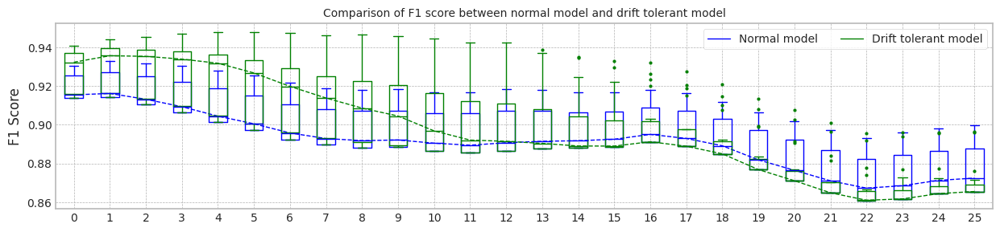

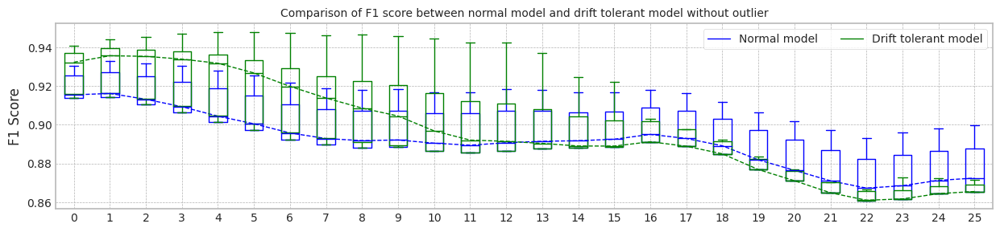

max_mean_trial= 11


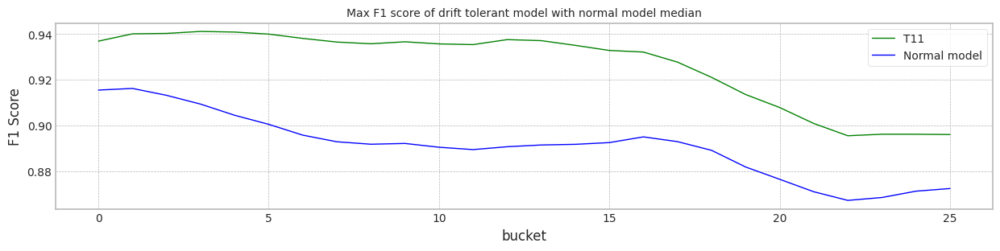

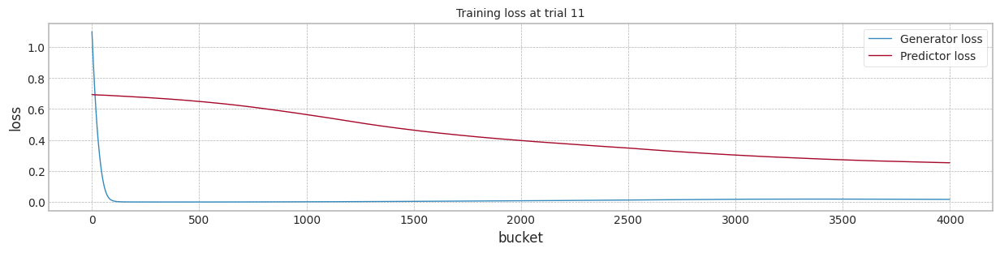

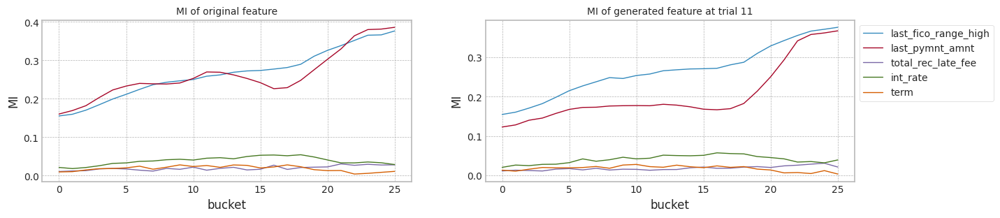

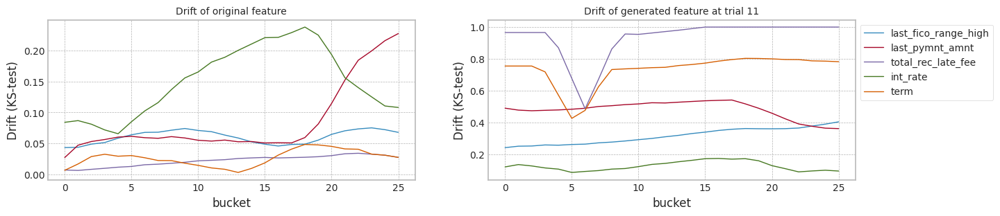

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.927171,0.927171,0.908456,0.890594
1,1.0,0.913777,0.913777,0.886791,0.865579
2,2.0,0.929556,0.929556,0.913445,0.895741
3,3.0,0.924149,0.924149,0.903034,0.885028
4,4.0,0.913811,0.913811,0.886793,0.865538
5,5.0,0.924854,0.924854,0.904635,0.887182
6,6.0,0.930585,0.930585,0.915365,0.899733
7,7.0,0.913806,0.913806,0.886813,0.865612
8,8.0,0.913811,0.913811,0.886793,0.865538
9,9.0,0.916696,0.916696,0.893271,0.876882


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.923306,0.923306,0.892441,0.865507
1,1.0,0.938231,0.938231,0.900310,0.865555
2,2.0,0.932454,0.932454,0.906073,0.865808
3,3.0,0.913811,0.913811,0.886793,0.865538
4,4.0,0.913811,0.913811,0.886793,0.865538
5,5.0,0.933209,0.933209,0.896739,0.865538
6,6.0,0.940796,0.940796,0.923431,0.871647
7,7.0,0.934494,0.934494,0.905699,0.868293
8,8.0,0.916457,0.916457,0.891552,0.871347
9,9.0,0.913811,0.913811,0.886793,0.865538


In [ ]:
seed_everything()
for vc in range(2):
    print("=" * 50)
    #s = np.sort(np.random.choice(len(COLUMNS),2,replace= False))
    top_columns = list(mi_scores[vc:5+vc].index)
    top_columns
    print('columns:',top_columns)
    #print(s.shape)
    X4 = X3[top_columns]

    train_size = 10000*2
    test_size = 2000*2

    X1,Y1 = check_mi_drift(X4, Y3, train_size, test_size)

    bucket_size = 500*2
    X1['b'] = [int(b/bucket_size) for b in X1.index.values]
    _,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 600)

### #2 날짜 단위로 bucket 만들기

#### data 정제

In [ ]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
#df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    #df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values


2010
2011
2012
2013
2014
2015
2016
2017
2018


In [ ]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'issue_d', 'dti',
       'delinq_2yrs', 'fico_range_high', 'inq_last_6mths', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'last_pymnt_amnt',
       'last_fico_range_high', 'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],


In [ ]:
X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
X2 = pd.DataFrame(X2,columns = list(COLUMNS))#[top_columns+['issue_d']]

In [ ]:
X2

,loan_amnt,term,int_rate,annual_inc,issue_d,dti,delinq_2yrs,fico_range_high,inq_last_6mths,open_acc,...,renewable_energy,small_business,vacation,wedding,MORTGAGE,OTHER,OWN,RENT,DirectPay,Y
0,12000.0,36,13.57,42000.0,201001,21.77,0.0,684.0,2.0,10.0,...,0,0,0,0,0,0,0,1,0,0
1,7500.0,36,12.18,26000.0,201001,0.0,0.0,764.0,3.0,5.0,...,0,0,0,0,0,0,0,1,0,0
2,10000.0,36,14.61,62400.0,201001,8.46,0.0,714.0,1.0,7.0,...,0,0,0,0,1,0,0,0,0,0
3,15000.0,36,16.0,96000.0,201001,11.13,2.0,664.0,2.0,13.0,...,0,0,0,0,0,0,0,1,0,0
4,20000.0,36,11.83,105000.0,201001,13.87,0.0,759.0,0.0,9.0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1279675,4800.0,36,9.93,90000.0,201712,20.81,0.0,704.0,0.0,11.0,...,0,0,0,0,0,0,0,1,0,0
1279676,15000.0,36,9.93,150000.0,201712,10.16,0.0,739.0,0.0,6.0,...,0,0,0,0,1,0,0,0,0,0
1279677,9600.0,36,7.97,40500.0,201712,13.75,0.0,709.0,1.0,21.0,...,0,0,0,0,0,0,0,1,0,0
1279678,32000.0,36,5.32,45000.0,201712,28.96,0.0,779.0,0.0,17.0,...,0,0,0,0,1,0,0,0,0,0


In [ ]:
from datetime import date
from datetime import datetime

def date_bucket_num(d,start_day='20100101'):
    date1 = datetime.strptime(start_day, '%Y%m%d')
    date2 = datetime.strptime(str(d)+'01', '%Y%m%d')
    delta = date2 - date1
    return int(delta.days/30)

In [ ]:
X2['b'] = [date_bucket_num(d) for d in X2['issue_d']]

In [ ]:
X2

,loan_amnt,term,int_rate,annual_inc,issue_d,dti,delinq_2yrs,fico_range_high,inq_last_6mths,open_acc,...,small_business,vacation,wedding,MORTGAGE,OTHER,OWN,RENT,DirectPay,Y,b
0,12000.0,36,13.57,42000.0,201001,21.77,0.0,684.0,2.0,10.0,...,0,0,0,0,0,0,1,0,0,0
1,7500.0,36,12.18,26000.0,201001,0.0,0.0,764.0,3.0,5.0,...,0,0,0,0,0,0,1,0,0,0
2,10000.0,36,14.61,62400.0,201001,8.46,0.0,714.0,1.0,7.0,...,0,0,0,1,0,0,0,0,0,0
3,15000.0,36,16.0,96000.0,201001,11.13,2.0,664.0,2.0,13.0,...,0,0,0,0,0,0,1,0,0,0
4,20000.0,36,11.83,105000.0,201001,13.87,0.0,759.0,0.0,9.0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1279675,4800.0,36,9.93,90000.0,201712,20.81,0.0,704.0,0.0,11.0,...,0,0,0,0,0,0,1,0,0,96
1279676,15000.0,36,9.93,150000.0,201712,10.16,0.0,739.0,0.0,6.0,...,0,0,0,1,0,0,0,0,0,96
1279677,9600.0,36,7.97,40500.0,201712,13.75,0.0,709.0,1.0,21.0,...,0,0,0,0,0,0,1,0,0,96
1279678,32000.0,36,5.32,45000.0,201712,28.96,0.0,779.0,0.0,17.0,...,0,0,0,1,0,0,0,0,0,96


<BarContainer object of 95 artists>

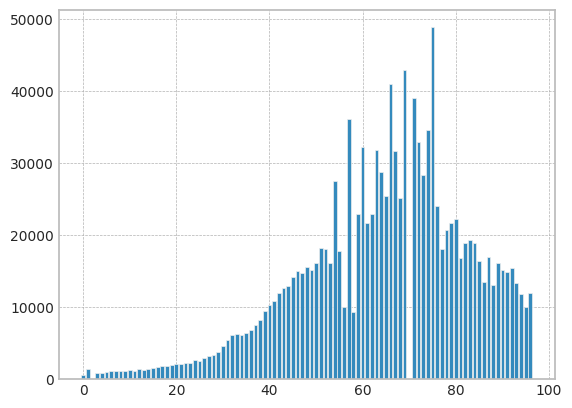

In [ ]:
b_cnt = X2.groupby(['b'])['b'].count()
plt.bar(b_cnt.index,b_cnt.values)

In [ ]:
# 1/10 로 사이즈 줄이기...
seed_everything()
s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
#print(s.shape)
X3 = X2.iloc[s,:]
Y3 = Y2[s]

<BarContainer object of 95 artists>

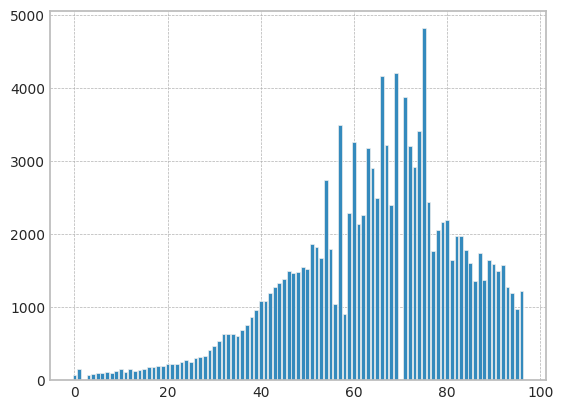

In [ ]:
b_cnt2 = X3.groupby(['b'])['b'].count()
plt.bar(b_cnt2.index,b_cnt2.values)

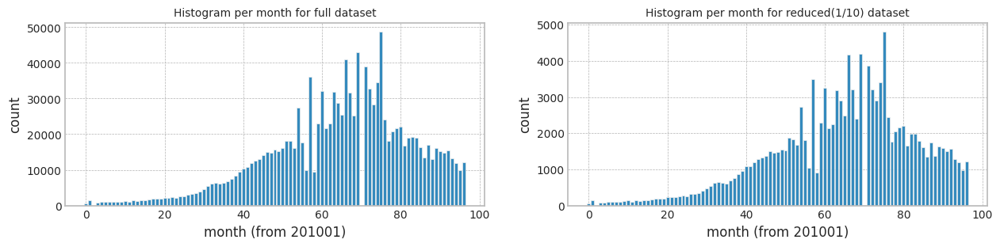

In [ ]:
fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
ax[0].bar(b_cnt.index,b_cnt.values)
ax[0].set_ylabel('count')
ax[0].set_xlabel('month (from 201001)')
ax[0].set_title(f'Histogram per month for full dataset',fontdict={'fontsize':10})

ax[1].bar(b_cnt2.index,b_cnt2.values)
ax[1].set_ylabel('count')
ax[1].set_xlabel('month (from 201001)')
ax[1].set_title(f'Histogram per month for reduced(1/10) dataset',fontdict={'fontsize':10})

plt.show()

In [ ]:
X3.drop(columns=['issue_d'],inplace=True)

In [ ]:
X3

,loan_amnt,term,int_rate,annual_inc,dti,delinq_2yrs,fico_range_high,inq_last_6mths,open_acc,pub_rec,...,small_business,vacation,wedding,MORTGAGE,OTHER,OWN,RENT,DirectPay,Y,b
8,9000.0,36,8.94,44000.0,8.97,0.0,749.0,1.0,14.0,0.0,...,0,0,0,0,0,0,1,0,0,0
19,21125.0,36,13.92,87000.0,18.33,0.0,704.0,1.0,9.0,0.0,...,0,0,0,1,0,0,0,0,0,0
41,24250.0,36,12.53,287000.0,13.89,0.0,729.0,2.0,15.0,0.0,...,0,0,0,0,0,0,1,0,0,0
43,5000.0,36,13.92,38000.0,5.68,0.0,689.0,1.0,5.0,0.0,...,0,0,0,0,0,0,1,0,0,0
52,13000.0,36,8.59,100000.0,18.35,0.0,784.0,2.0,18.0,0.0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1279596,8000.0,36,7.35,27000.0,22.36,0.0,719.0,0.0,14.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279609,29375.0,60,30.75,90000.0,44.94,0.0,689.0,1.0,20.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279627,2500.0,36,10.42,48000.0,25.23,0.0,794.0,1.0,9.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279639,18500.0,36,13.59,45000.0,35.71,1.0,709.0,0.0,14.0,0.0,...,0,0,0,1,0,0,0,0,0,96


#### Drift tolerant 학습

train_size 19361
Dataset has buckets!
MI Analysis MI Max 0.28519, Min 0.01947, Mean 0.17442, Std 0.12009
Dataset structure X_train, (19361, 5) X_test, (19361, 5) X_live (123968, 5)
bucket range in live set 26~96
Truncate 0 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (70,)


100%|██████████| 70/70 [00:03<00:00, 22.02it/s]


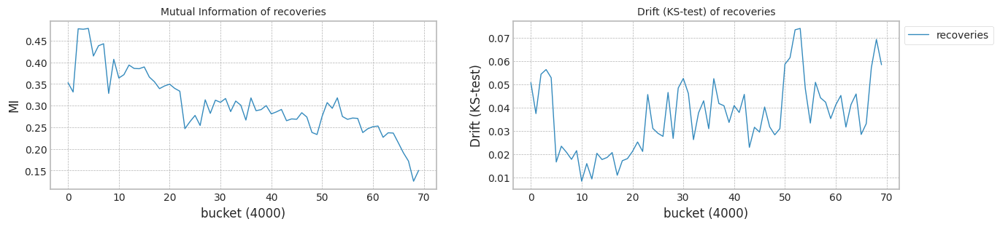

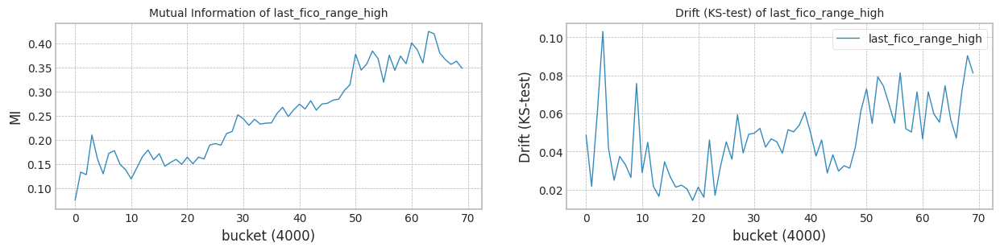

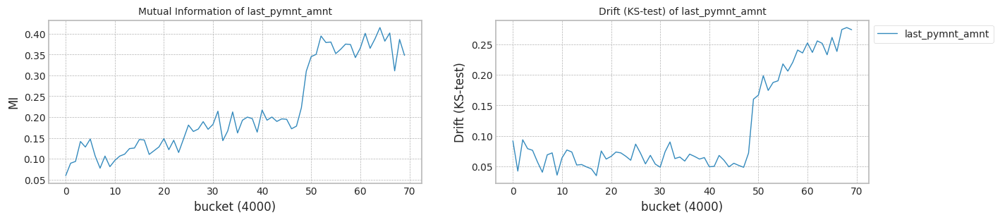

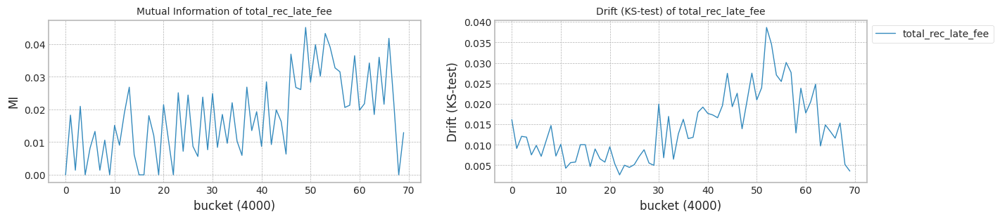

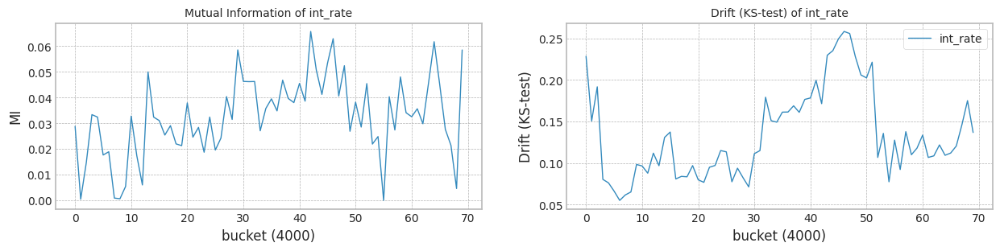

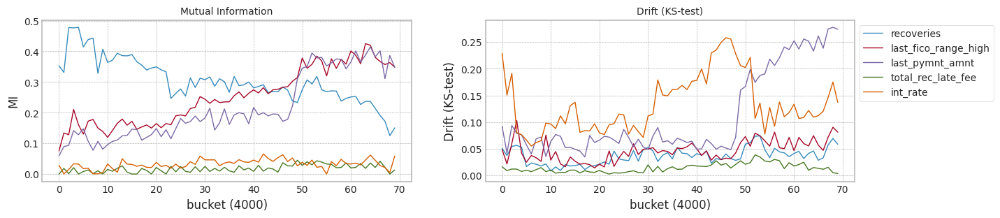

In [ ]:
top_columns = list(mi_scores[0:5].index)
top_columns

train_size = X3[X3['b'] < 46].shape[0] # 2010년 1월에서 39개월 (약 3년6개월간의 data)
print('train_size',train_size)
test_size = 4000

X1,Y1 = check_mi_drift(X3[top_columns+['b']], Y3, train_size, test_size)

MI Analysis MI Max 0.28433, Min 0.02173, Mean 0.17421, Std 0.11921
Dataset structure X_train, (19361, 5) X_test, (19361, 5) X_live (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (27, 19361, 5)


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


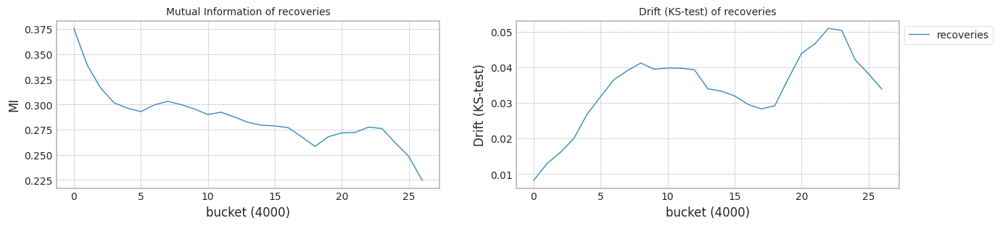

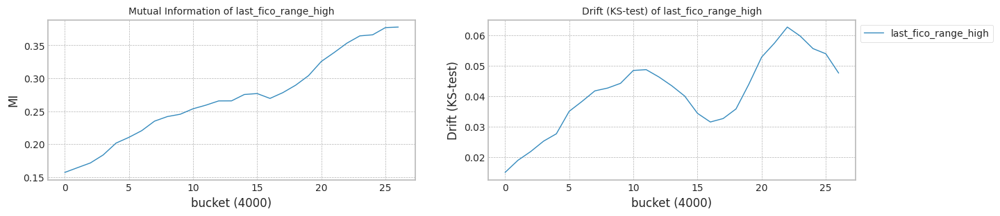

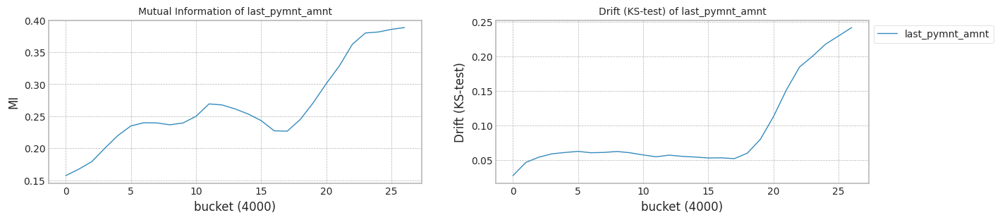

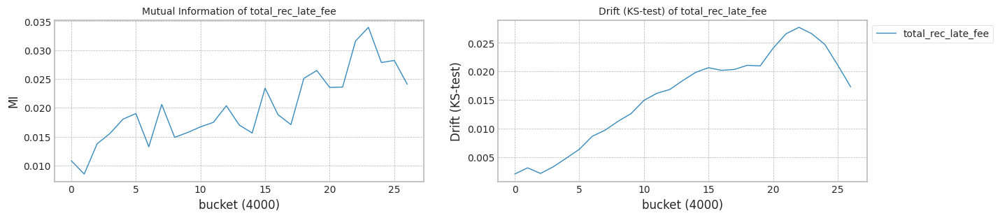

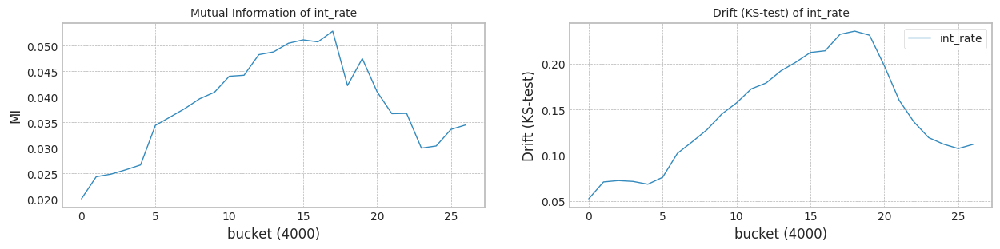

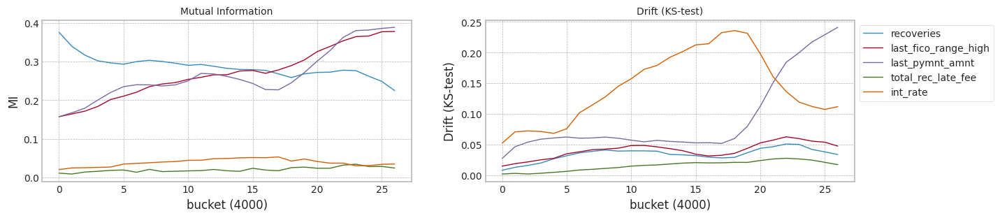

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 641.28it/s]


Test f1 score: 0.921086162471331
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.01it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8979705514905133
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.62it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.05it/s]


mean of drift:
recoveries              0.861233
last_fico_range_high    0.197926
last_pymnt_amnt         0.436136
total_rec_late_fee      0.544638
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.8979705514905133
Drift tolerant model mean: 0.8863519677174436
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 633.89it/s]


Test f1 score: 0.9394500723589002
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.01it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.9259591287433623
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.80it/s]


Test f1 score: 0.9721890666030079
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.97it/s]


mean of drift:
recoveries              0.856996
last_fico_range_high    0.193468
last_pymnt_amnt         0.405703
total_rec_late_fee      0.966117
dtype: float64
Mean F1 for all data: 0.9593014448660997
Normal model mean        : 0.9119648401169378
Drift tolerant model mean: 0.9228267062917717
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.29it/s]


Test f1 score: 0.9152418447694038
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.02it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8894473030149267
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.06it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.95it/s]


mean of drift:
recoveries              0.826780
last_fico_range_high    0.204856
last_pymnt_amnt         0.426941
total_rec_late_fee      0.563261
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.9044589944162674
Drift tolerant model mean: 0.9106684601003291
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.22it/s]


Test f1 score: 0.9210295325197497
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.05it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8981971867921137
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.86it/s]


Test f1 score: 0.972601922043813
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.99it/s]


mean of drift:
recoveries              0.814497
last_fico_range_high    0.148954
last_pymnt_amnt         0.417410
total_rec_late_fee      0.801420
dtype: float64
Mean F1 for all data: 0.9597466028219386
Normal model mean        : 0.9028935425102289
Drift tolerant model mean: 0.9229379957807314
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.20it/s]


Test f1 score: 0.9140820164481993
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.02it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8868026895373124
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.25it/s]


Test f1 score: 0.9728035346448936
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.02it/s]


mean of drift:
recoveries              0.824165
last_fico_range_high    0.141638
last_pymnt_amnt         0.435788
total_rec_late_fee      0.641810
dtype: float64
Mean F1 for all data: 0.9598322758603877
Normal model mean        : 0.8996753719156455
Drift tolerant model mean: 0.9303168517966627
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 610.53it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.95it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.30it/s]


Test f1 score: 0.974259320159048
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.01it/s]


mean of drift:
recoveries              0.861214
last_fico_range_high    0.053359
last_pymnt_amnt         0.286917
total_rec_late_fee      0.551387
dtype: float64
Mean F1 for all data: 0.9605015323583332
Normal model mean        : 0.8974548045492785
Drift tolerant model mean: 0.9353476318902745
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.99it/s]


Test f1 score: 0.9140708312286018
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.05it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8868543344668919
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.96it/s]


Test f1 score: 0.9730327012094968
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  3.00it/s]


mean of drift:
recoveries              0.840370
last_fico_range_high    0.133751
last_pymnt_amnt         0.416186
total_rec_late_fee      0.557855
dtype: float64
Mean F1 for all data: 0.9600412040685348
Normal model mean        : 0.8959404516803662
Drift tolerant model mean: 0.9388752850585974
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 642.17it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.03it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.61it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.07it/s]


mean of drift:
recoveries              0.856879
last_fico_range_high    0.144393
last_pymnt_amnt         0.409722
total_rec_late_fee      0.856470
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.8947418911850009
Drift tolerant model mean: 0.932309870390953
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 623.66it/s]


Test f1 score: 0.9142343960484958
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.08it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8870443689666606
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.94it/s]


Test f1 score: 0.958834780050022
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.94it/s]


mean of drift:
recoveries              0.835287
last_fico_range_high    0.135421
last_pymnt_amnt         0.426757
total_rec_late_fee      0.568527
dtype: float64
Mean F1 for all data: 0.9473572123304929
Normal model mean        : 0.8938866109385187
Drift tolerant model mean: 0.933981797273124
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 623.00it/s]


Test f1 score: 0.914022833740077
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.00it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8864844217663423
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.30it/s]


Test f1 score: 0.9730052556139512
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.03it/s]


mean of drift:
recoveries              0.835043
last_fico_range_high    0.128907
last_pymnt_amnt         0.392077
total_rec_late_fee      0.966117
dtype: float64
Mean F1 for all data: 0.9600352055952583
Normal model mean        : 0.8931463920213011
Drift tolerant model mean: 0.9365871381053374
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.82it/s]


Test f1 score: 0.9168686242461815
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.05it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8923880322622545
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.59it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.00it/s]


mean of drift:
recoveries              0.740299
last_fico_range_high    0.150903
last_pymnt_amnt         0.438216
total_rec_late_fee      0.555148
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.893077450225024
Drift tolerant model mean: 0.9320203044337106
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.60it/s]


Test f1 score: 0.9196468990493436
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.01it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8965396100486333
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.76it/s]


Test f1 score: 0.9729164800382216
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.06it/s]


mean of drift:
recoveries              0.861363
last_fico_range_high    0.197730
last_pymnt_amnt         0.263011
total_rec_late_fee      0.966117
dtype: float64
Mean F1 for all data: 0.9599771683028313
Normal model mean        : 0.893365963543658
Drift tolerant model mean: 0.9343500430894708
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 622.72it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.99it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.01it/s]


Test f1 score: 0.9720797040925904
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.96it/s]


mean of drift:
recoveries              0.853841
last_fico_range_high    0.154968
last_pymnt_amnt         0.401969
total_rec_late_fee      0.966117
dtype: float64
Mean F1 for all data: 0.9590410880851808
Normal model mean        : 0.89282642540318
Drift tolerant model mean: 0.9362493542429869
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.68it/s]


Test f1 score: 0.9143049553847018
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.99it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8869573273707517
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.48it/s]


Test f1 score: 0.9724228496388706
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.02it/s]


mean of drift:
recoveries              0.861222
last_fico_range_high    0.268373
last_pymnt_amnt         0.398059
total_rec_late_fee      0.618691
dtype: float64
Mean F1 for all data: 0.9595711133856412
Normal model mean        : 0.8924072041151494
Drift tolerant model mean: 0.937915194181748
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 624.45it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.02it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.59it/s]


Test f1 score: 0.9712667660208645
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.02it/s]


mean of drift:
recoveries              0.859464
last_fico_range_high    0.172646
last_pymnt_amnt         0.397617
total_rec_late_fee      0.966117
dtype: float64
Mean F1 for all data: 0.9581583705345899
Normal model mean        : 0.8920035216886357
Drift tolerant model mean: 0.9392647392719374
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 621.64it/s]


Test f1 score: 0.9142504280461446
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.04it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8871186333790808
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.96it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.94it/s]


mean of drift:
recoveries              0.835553
last_fico_range_high    0.226354
last_pymnt_amnt         0.445361
total_rec_late_fee      0.913006
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.8916982161692886
Drift tolerant model mean: 0.9359576910497817
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 619.85it/s]


Test f1 score: 0.9191802120141344
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.04it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8957818894632955
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.29it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  3.00it/s]


mean of drift:
recoveries              0.851827
last_fico_range_high    0.126882
last_pymnt_amnt         0.437185
total_rec_late_fee      0.589662
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.8919384322454066
Drift tolerant model mean: 0.93303970732435
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 601.06it/s]


Test f1 score: 0.9154382806346348
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.05it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.88987468908347
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.55it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.01it/s]


mean of drift:
recoveries              0.770581
last_fico_range_high    0.138402
last_pymnt_amnt         0.426908
total_rec_late_fee      0.707646
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.8918237798475211
Drift tolerant model mean: 0.9304459440128553
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 622.88it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.04it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.25it/s]


Test f1 score: 0.9731182795698924
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.02it/s]


mean of drift:
recoveries              0.861013
last_fico_range_high    0.157659
last_pymnt_amnt         0.395834
total_rec_late_fee      0.587445
dtype: float64
Mean F1 for all data: 0.9603807964692882
Normal model mean        : 0.8915357897354119
Drift tolerant model mean: 0.9320214625631938
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.31it/s]


Test f1 score: 0.9140644726874843
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.08it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
dtype: float64
Mean F1 for all data: 0.8866226245738624
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.45it/s]


Test f1 score: 0.9725389528983345
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.93it/s]


mean of drift:
recoveries              0.855112
last_fico_range_high    0.130095
last_pymnt_amnt         0.404052
total_rec_late_fee      0.616971
dtype: float64
Mean F1 for all data: 0.9596223942326932
Normal model mean        : 0.8912901314773345
Drift tolerant model mean: 0.9334015091466688


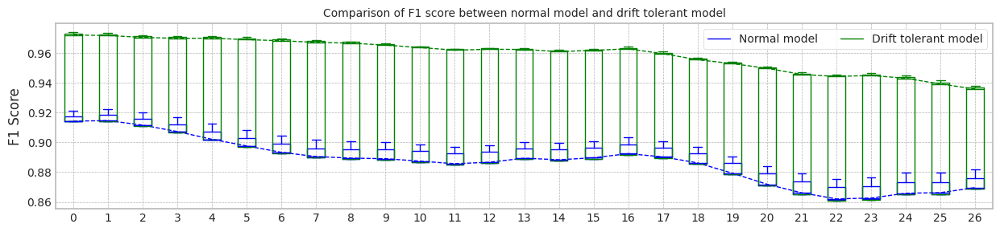

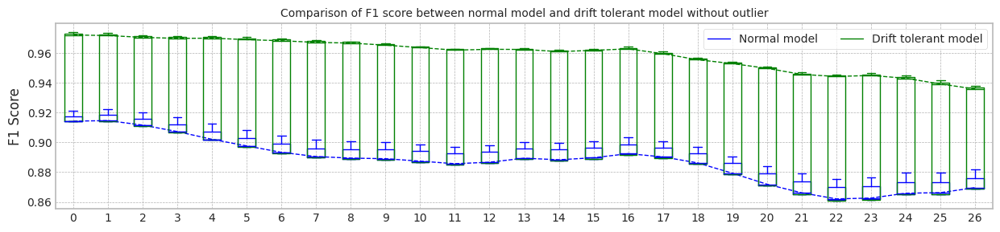

max_mean_trial= 5


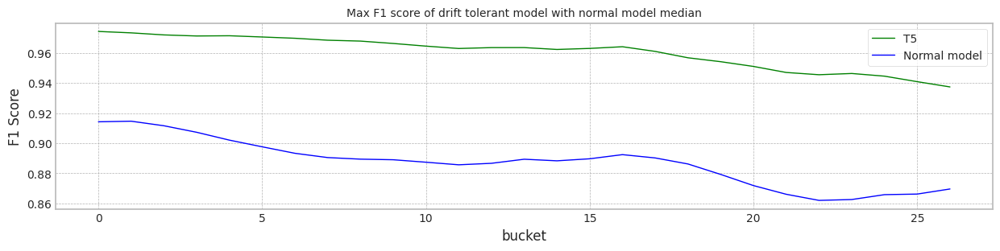

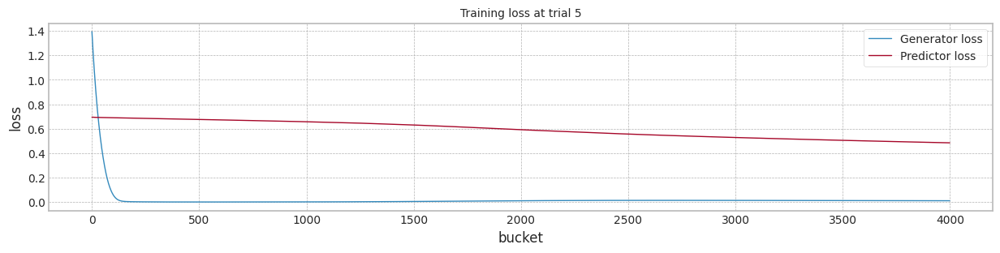

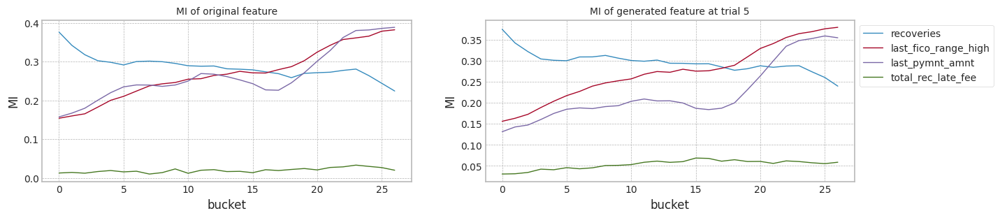

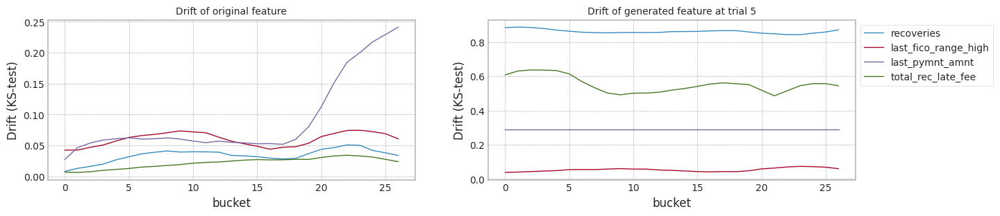

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.921086,0.921086,0.897971,0.881643
1,1.0,0.939450,0.939450,0.925959,0.913567
2,2.0,0.915242,0.915242,0.889447,0.871828
3,3.0,0.921030,0.921030,0.898197,0.882054
4,4.0,0.914082,0.914082,0.886803,0.869553
5,5.0,0.913981,0.913981,0.886352,0.868803
6,6.0,0.914071,0.914071,0.886854,0.869451
7,7.0,0.913981,0.913981,0.886352,0.868803
8,8.0,0.914234,0.914234,0.887044,0.869677
9,9.0,0.914023,0.914023,0.886484,0.868991


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.913981,0.913981,0.886352,0.868803
1,1.0,0.972189,0.972189,0.959301,0.936044
2,2.0,0.913981,0.913981,0.886352,0.868803
3,3.0,0.972602,0.972602,0.959747,0.936781
4,4.0,0.972804,0.972804,0.959832,0.936752
5,5.0,0.974259,0.974259,0.960502,0.937402
6,6.0,0.973033,0.973033,0.960041,0.937234
7,7.0,0.913981,0.913981,0.886352,0.868803
8,8.0,0.958835,0.958835,0.947357,0.926158
9,9.0,0.973005,0.973005,0.960035,0.936988


In [ ]:
X1,Y1 = check_mi_drift(X3[top_columns], Y3, train_size, test_size)
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 400) #np.max(X1['b'])+1)

train_size 19361
MI Analysis MI Max 0.27290, Min 0.02199, Mean 0.12330, Std 0.11660
Dataset structure X_train, (19361, 5) X_test, (19361, 5) X_live (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (27, 19361, 5)


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


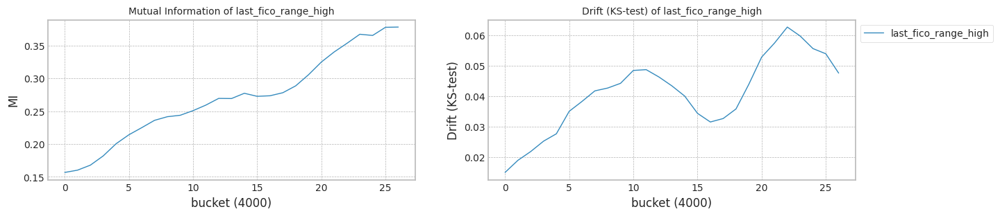

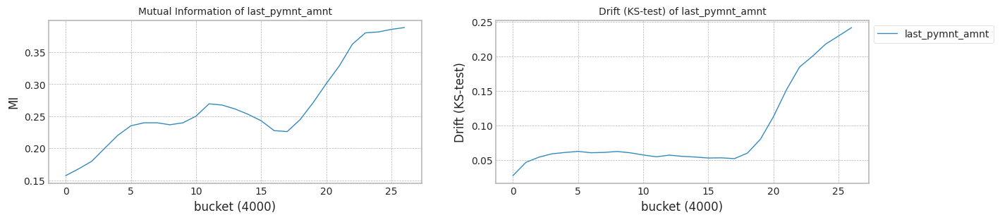

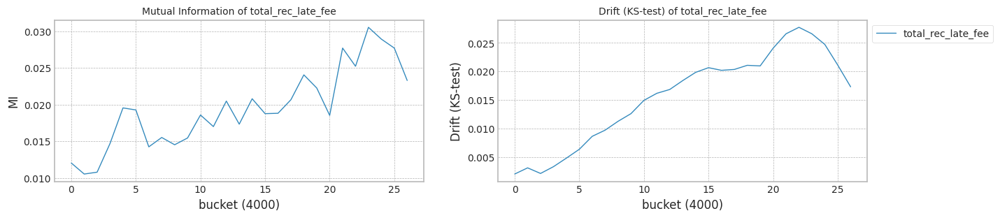

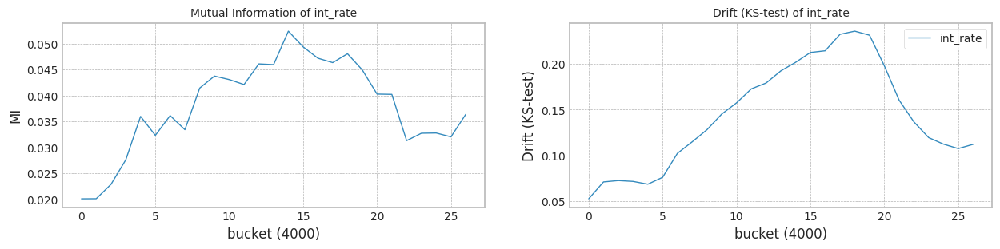

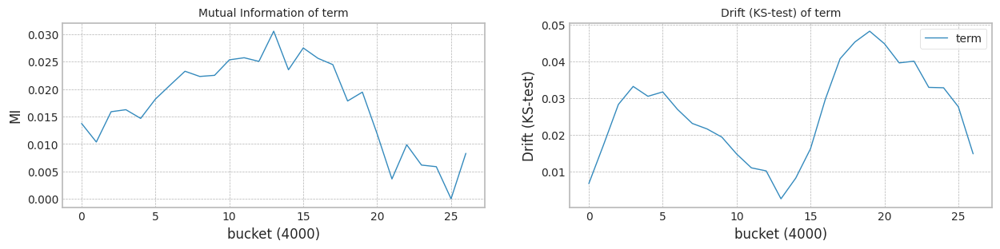

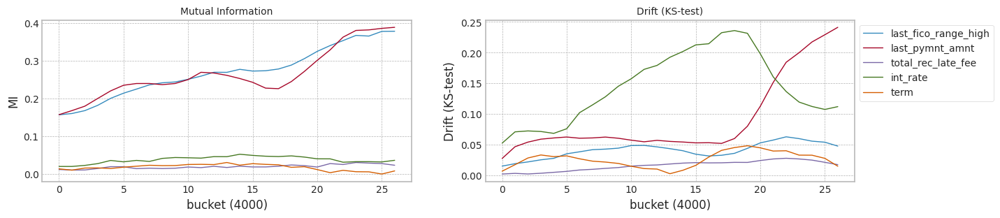

In [ ]:
top_columns = list(mi_scores[1:6].index)
top_columns

train_size = X3[X3['b'] < 46].shape[0] # 2010년 1월에서 39개월 (약 3년6개월간의 data)
print('train_size',train_size)
test_size = 4000

X1,Y1 = check_mi_drift(X3[top_columns], Y3, train_size, test_size)

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.47it/s]


Test f1 score: 0.9138381201044387
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.05it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8867137325226181
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.87it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.99it/s]


mean of drift:
last_fico_range_high    0.183781
last_pymnt_amnt         0.429265
total_rec_late_fee      0.729204
int_rate                0.145983
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.8867137325226181
Drift tolerant model mean: 0.8863519677174436
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.52it/s]


Test f1 score: 0.9139507488640826
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.02it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863457937613086
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.64it/s]


Test f1 score: 0.9239053018432523
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.05it/s]


mean of drift:
last_fico_range_high    0.195626
last_pymnt_amnt         0.450468
total_rec_late_fee      0.966117
int_rate                0.136295
dtype: float64
Mean F1 for all data: 0.9058546109214165
Normal model mean        : 0.8865297631419633
Drift tolerant model mean: 0.8961032893194301
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.54it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.04it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.21it/s]


Test f1 score: 0.9369011451273661
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.94it/s]


mean of drift:
last_fico_range_high    0.248514
last_pymnt_amnt         0.446889
total_rec_late_fee      0.966117
int_rate                0.129284
dtype: float64
Mean F1 for all data: 0.928026962434049
Normal model mean        : 0.8864704980004566
Drift tolerant model mean: 0.9067445136909696
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 625.75it/s]


Test f1 score: 0.9139507488640826
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.02it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863480716441016
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.12it/s]


Test f1 score: 0.9372708877093171
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.01it/s]


mean of drift:
last_fico_range_high    0.179896
last_pymnt_amnt         0.429116
total_rec_late_fee      0.966117
int_rate                0.140913
dtype: float64
Mean F1 for all data: 0.9322712496039592
Normal model mean        : 0.8864398914113679
Drift tolerant model mean: 0.9131261976692171
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.64it/s]


Test f1 score: 0.9192930697001503
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.03it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8974504671021332
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.93it/s]


Test f1 score: 0.9216720549032954
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.03it/s]


mean of drift:
last_fico_range_high    0.195626
last_pymnt_amnt         0.432138
total_rec_late_fee      0.966117
int_rate                0.137227
dtype: float64
Mean F1 for all data: 0.8996691465578012
Normal model mean        : 0.8886420065495211
Drift tolerant model mean: 0.9104347874469338
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.00it/s]


Test f1 score: 0.9140609636184858
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.95it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8873188719778141
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.37it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.01it/s]


mean of drift:
last_fico_range_high    0.155892
last_pymnt_amnt         0.410063
total_rec_late_fee      0.703440
int_rate                0.143986
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.8884214841209032
Drift tolerant model mean: 0.9064209841586854
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.14it/s]


Test f1 score: 0.9148582847814462
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.03it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8909254954025763
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.57it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.96it/s]


mean of drift:
last_fico_range_high    0.183657
last_pymnt_amnt         0.421768
total_rec_late_fee      0.699658
int_rate                0.140378
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.888779200018285
Drift tolerant model mean: 0.9035539818099366
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.91it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.02it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.80it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.02it/s]


mean of drift:
last_fico_range_high    0.163720
last_pymnt_amnt         0.421961
total_rec_late_fee      0.729213
int_rate                0.136263
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.8884757959806799
Drift tolerant model mean: 0.901403730048375
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.69it/s]


Test f1 score: 0.9141074990868477
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.02it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8874318200795364
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.11it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.05it/s]


mean of drift:
last_fico_range_high    0.195626
last_pymnt_amnt         0.435907
total_rec_late_fee      0.698407
int_rate                0.142524
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.8883597986583306
Drift tolerant model mean: 0.8997313120116048
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.21it/s]


Test f1 score: 0.9137485970819303
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.08it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8864647023696427
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.21it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  3.00it/s]


mean of drift:
last_fico_range_high    0.179270
last_pymnt_amnt         0.431958
total_rec_late_fee      0.729204
int_rate                0.144883
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.8881702890294619
Drift tolerant model mean: 0.8983933775821887
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.04it/s]


Test f1 score: 0.9139507488640826
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.01it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863344286326528
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.69it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.07it/s]


mean of drift:
last_fico_range_high    0.186629
last_pymnt_amnt         0.440263
total_rec_late_fee      0.966117
int_rate                0.128819
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.888003392629752
Drift tolerant model mean: 0.897298703958121
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.79it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.03it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.98it/s]


Test f1 score: 0.9218647779958472
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.04it/s]


mean of drift:
last_fico_range_high    0.187435
last_pymnt_amnt         0.429516
total_rec_late_fee      0.729204
int_rate                0.128490
dtype: float64
Mean F1 for all data: 0.9021489327391847
Normal model mean        : 0.8878657738870596
Drift tolerant model mean: 0.8977028896898762
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.54it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.02it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.86it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.03it/s]


mean of drift:
last_fico_range_high    0.186683
last_pymnt_amnt         0.430616
total_rec_late_fee      0.729204
int_rate                0.144990
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.8877493272586275
Drift tolerant model mean: 0.896829741845843
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 632.31it/s]


Test f1 score: 0.9137660004491354
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.05it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8866841543054707
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.93it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.06it/s]


mean of drift:
last_fico_range_high    0.186629
last_pymnt_amnt         0.434105
total_rec_late_fee      0.729204
int_rate                0.140668
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.8876732434762592
Drift tolerant model mean: 0.8960813294081001
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.80it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.00it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.29it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.04it/s]


mean of drift:
last_fico_range_high    0.156274
last_pymnt_amnt         0.414807
total_rec_late_fee      0.729213
int_rate                0.140613
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.8875851584256715
Drift tolerant model mean: 0.8954327052953897
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 643.54it/s]


Test f1 score: 0.9138095505302734
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.01it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8865446748758666
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.41it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.03it/s]


mean of drift:
last_fico_range_high    0.192954
last_pymnt_amnt         0.439863
total_rec_late_fee      0.698875
int_rate                0.139209
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.8875201282038088
Drift tolerant model mean: 0.8948651591967682
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 611.50it/s]


Test f1 score: 0.913833281859786
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  3.00it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.886819358753794
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.31it/s]


Test f1 score: 0.9369914519871927
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.04it/s]


mean of drift:
last_fico_range_high    0.186807
last_pymnt_amnt         0.436071
total_rec_late_fee      0.729204
int_rate                0.130757
dtype: float64
Mean F1 for all data: 0.9322450503103584
Normal model mean        : 0.887478906471455
Drift tolerant model mean: 0.897063976321097
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.80it/s]


Test f1 score: 0.9138110072689511
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.01it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8866977549530326
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.67it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.96it/s]


mean of drift:
last_fico_range_high    0.186664
last_pymnt_amnt         0.444932
total_rec_late_fee      0.698418
int_rate                0.130252
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model mean        : 0.887435509164876
Drift tolerant model mean: 0.8964688647320052
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 608.72it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.02it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 261.47it/s]


Test f1 score: 0.935370770759072
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:09<00:00,  2.98it/s]


mean of drift:
last_fico_range_high    0.178277
last_pymnt_amnt         0.422401
total_rec_late_fee      0.966117
int_rate                0.130155
dtype: float64
Mean F1 for all data: 0.9271522285286765
Normal model mean        : 0.8873784806676428
Drift tolerant model mean: 0.8980837786160405
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 654.16it/s]


Test f1 score: 0.9143950263032041
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.02it/s]


mean of drift:
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8894740016690409
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 265.22it/s]


Test f1 score: 0.9348495061692214
X_live.shape (123968, 5)
Truncate 15968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 5])


100%|██████████| 27/27 [00:08<00:00,  3.06it/s]


mean of drift:
last_fico_range_high    0.186629
last_pymnt_amnt         0.438593
total_rec_late_fee      0.729204
int_rate                0.128519
dtype: float64
Mean F1 for all data: 0.9278717290648939
Normal model mean        : 0.8874832567177127
Drift tolerant model mean: 0.8995731761384832


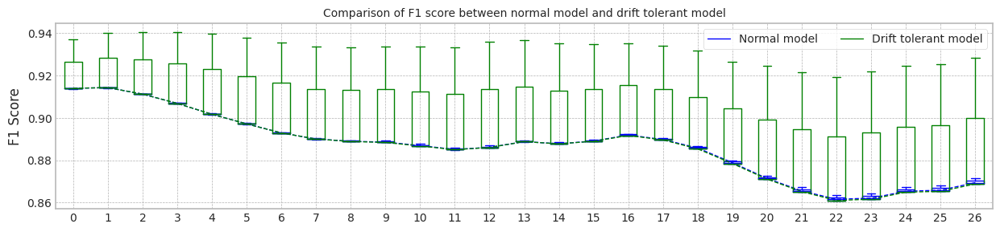

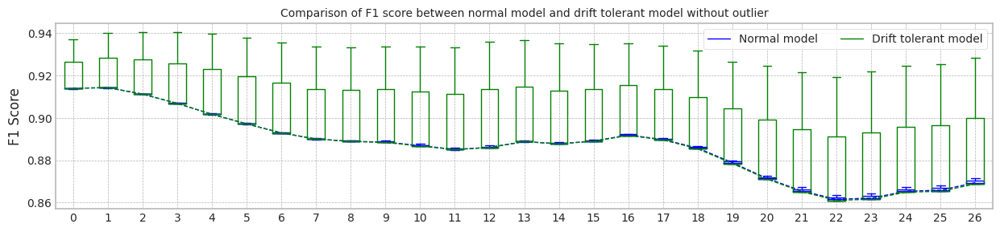

max_mean_trial= 3


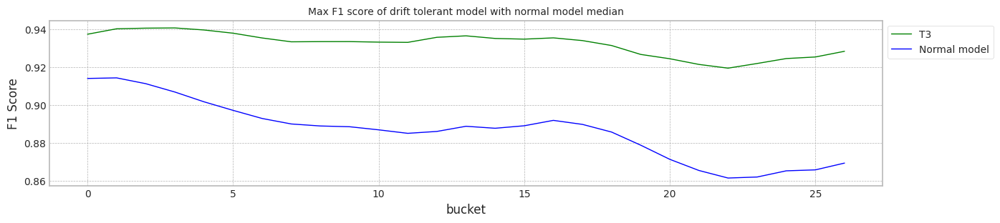

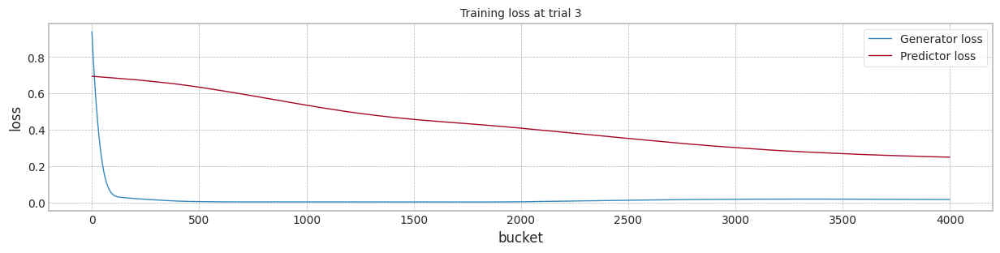

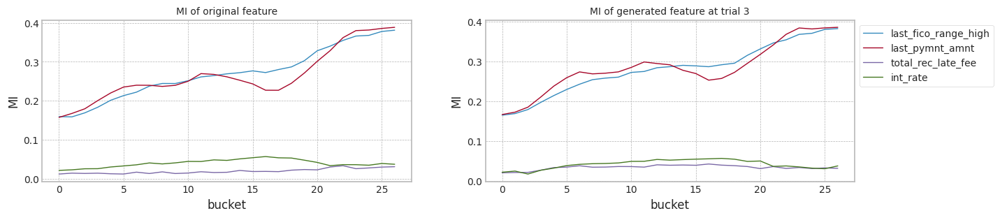

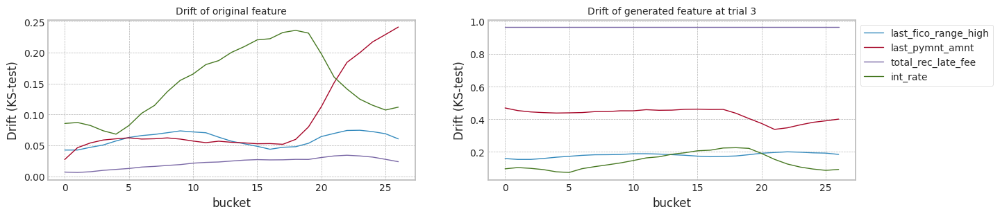

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.913838,0.913838,0.886714,0.869911
1,1.0,0.913951,0.913951,0.886346,0.868821
2,2.0,0.913981,0.913981,0.886352,0.868803
3,3.0,0.913951,0.913951,0.886348,0.868821
4,4.0,0.919293,0.919293,0.897450,0.888749
5,5.0,0.914061,0.914061,0.887319,0.871279
6,6.0,0.914858,0.914858,0.890925,0.880980
7,7.0,0.913981,0.913981,0.886352,0.868803
8,8.0,0.914107,0.914107,0.887432,0.871392
9,9.0,0.913749,0.913749,0.886465,0.869367


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.913981,0.913981,0.886352,0.868803
1,1.0,0.923905,0.923905,0.905855,0.892783
2,2.0,0.936901,0.936901,0.928027,0.921372
3,3.0,0.937271,0.937271,0.932271,0.928290
4,4.0,0.921672,0.921672,0.899669,0.886728
5,5.0,0.913981,0.913981,0.886352,0.868803
6,6.0,0.913981,0.913981,0.886352,0.868803
7,7.0,0.913981,0.913981,0.886352,0.868803
8,8.0,0.913981,0.913981,0.886352,0.868803
9,9.0,0.913981,0.913981,0.886352,0.868803


In [ ]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 400) #np.max(X1['b'])+1)